<!-- O plano e fazer a extracao exclusiva da elite. Quero reaproveitar o que peguei de todos e juntar com o que ja tenho da elite.

Depois, vou pegar o grupo de pessoas da elite que nao foram contempladas e dividir nos grupos de “precisa contemplar” e “incontemplaveis” (aqueles que ja deram erro porque nao existem ou porque ha zero tweets nas datas propostas). 

✅✅✅

-->

In [1]:
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

### Bios

In [207]:
# bios, pontos ideais e classificacoes de fatia

# bios
influencers = pd.read_csv('influencers_bio.csv')
influencers['nome_usuario'] = '@' + influencers['nome']

# pontos ideais + outras infos
influencers_infos = pd.read_csv('influencers_pontos_ideais_all_info.csv').drop(columns=['Id', 'Label', 'timeset', 'bio', 
                                                                                        'intersec1', 'intersec1_str', 
                                                                                        'intersec2', 'intersec2_str', 
                                                                                        'intersec3', 'intersec3_str']).sort_values('no')

influencers_infos = influencers.drop(columns=['nome', 'localização']).merge(
    influencers_infos.drop(columns=['no']),
    on='nome_usuario',
    how='left')

# classificacoes especificas
influencers_infos.loc[influencers_infos['ponto_ideal'] >= 1.5, 'ideology_classification'] = 'antifeminista extrema'
influencers_infos.loc[(influencers_infos['ponto_ideal'] >= 1) & (influencers_infos['ponto_ideal'] < 1.5), 'ideology_classification'] = 'antifeminista moderada'
influencers_infos.loc[(influencers_infos['ponto_ideal'] >= 0.5) & (influencers_infos['ponto_ideal'] < 1), 'ideology_classification'] = 'antifeminista centro'
influencers_infos.loc[(influencers_infos['ponto_ideal'] > -0.5) & (influencers_infos['ponto_ideal'] < 0.5), 'ideology_classification'] = 'centro'
influencers_infos.loc[(influencers_infos['ponto_ideal'] <= -0.5) & (influencers_infos['ponto_ideal'] > -1), 'ideology_classification'] = 'feminista centro'
influencers_infos.loc[(influencers_infos['ponto_ideal'] <= -1) & (influencers_infos['ponto_ideal'] > -1.5), 'ideology_classification'] = 'feminista moderada'
influencers_infos.loc[influencers_infos['ponto_ideal'] <= -1.5, 'ideology_classification'] = 'feminista extrema'

# classificacoes gerais
influencers_infos.loc[influencers_infos['ponto_ideal'] >= 0.5, 'ideology_classification_gen'] = 'antifeminista'
influencers_infos.loc[influencers_infos['ponto_ideal'] <= -0.5, 'ideology_classification_gen'] = 'feminista'
influencers_infos.ideology_classification_gen.fillna('centro', inplace=True)

influencers_infos.head()

,id,original,classificacao,bio,key words,nome_usuario,nome,pessoa,genero,20210215_seguidores,...,puc,puc_str,estadual,estadual_str,militar,militar_str,nome_usuario_raw,seguidores_analisados,ideology_classification,ideology_classification_gen
0,965380067131092992,data/followers_lists/_pinheira.rdata,Feminista,"Professor, Prof Titular @ucddublin | Director ...","professora, diretora, extrema direita, economi...",@_pinheira,Rosana Pinheiro-Machado,1.0,1.0,136817.0,...,0.0,Não PUC,0.0,Não Estaduais,0.0,Não Militar,_pinheira,25118.0,feminista moderada,feminista
1,1120399498692497408,data/followers_lists/AbrahamWeint.rdata,Antifeminista,A VERDADE LIBERTA!,verdade,@AbrahamWeint,Abraham Weintraub,1.0,0.0,1007333.0,...,0.0,Não PUC,1.0,Estaduais,0.0,Não Militar,AbrahamWeint,87587.0,antifeminista extrema,antifeminista
2,342403919,data/followers_lists/AiltonBenedito.rdata,Antifeminista,O Ser é. O não-Ser não é.,NaN,@AiltonBenedito,Ailton Benedito,1.0,0.0,228867.0,...,0.0,Não PUC,0.0,Não Estaduais,0.0,Não Militar,AiltonBenedito,34516.0,antifeminista extrema,antifeminista
3,1367385691,data/followers_lists/AlbuquerqueDavy.rdata,Antifeminista,Co-founder and partner @conexaopolitica | @por...,cofundador,@AlbuquerqueDavy,Davy Albuquerque,1.0,0.0,127395.0,...,0.0,Não PUC,0.0,Não Estaduais,0.0,Não Militar,AlbuquerqueDavy,20807.0,antifeminista extrema,antifeminista
4,984479654399610882,data/followers_lists/alesilva_38.rdata,Antifeminista,Filha de Deus. Pré-candidata a prefeita de Ipa...,"filha de deus, cristã, candidata, prefeita, ad...",@alesilva_38,Alê Silva 🇧🇷 nem lugar na fila eu quero🇧🇷,1.0,1.0,132390.0,...,0.0,Não PUC,0.0,Não Estaduais,0.0,Não Militar,alesilva_38,18820.0,antifeminista extrema,antifeminista


### Tweets

#### Classificacao

In [3]:
# tweets influencers

# tweets (geral)
tweets = pd.read_csv('user_tweets.csv')
tweets = tweets.drop_duplicates().dropna()

# tweets (elite)
tweets_elite = pd.read_csv('user_tweets_elite.csv').drop(columns=['author_id'])
tweets_elite.columns = ['user_id', 'text', 'created_at', 'id', 'author_id']
tweets_elite = tweets_elite.drop_duplicates().dropna()

# tweets (elite com erro)
tweets_erro = pd.read_csv('user_tweets_fail_elite.csv').drop(columns=['author_id'])
tweets_erro.columns = ['user_id', 'pagination_token', 'text', 'created_at', 'id', 'author_id']
tweets_erro = tweets_erro.drop_duplicates().dropna().drop(columns=['pagination_token'])

# influencers ids
influencers = pd.read_csv('influencers_bio.csv')
influencers['nome_usuario'] = '@' + influencers['nome']
influencers_id = [int(id) for id in influencers.id.to_list() if id != '0']


# tweets de influencers
tweets_influencers = pd.concat([tweets[tweets.user_id.isin(influencers_id)],
                                tweets_elite[tweets_elite.user_id.isin(influencers_id)], 
                                tweets_erro[tweets_erro.user_id.isin(influencers_id)]]).drop_duplicates().dropna()
tweets_influencers = tweets_influencers[tweets_influencers['user_id'].isin(influencers_id)]
tweets_influencers.head()

,user_id,text,created_at,id,author_id
34804,2980524357,RT @BolsonaroSP: Sei que gosta de Chesterton e...,2020-12-31T22:51:50.000Z,1.344778e+18,2.980524e+09
34805,2980524357,RT @andreporci: Não se pode perder o que nunca...,2020-12-31T16:23:28.000Z,1.344681e+18,2.980524e+09
34806,2980524357,#AbortoNAO https://t.co/U6djcGsOWl,2020-12-31T13:42:51.000Z,1.344640e+18,2.980524e+09
34807,2980524357,@lyaruo “Libera homicídio já que o sujeito vai...,2020-12-31T04:37:40.000Z,1.344503e+18,2.980524e+09
34808,2980524357,"Logo após a minha posse como vereador, no dia ...",2020-12-31T04:30:17.000Z,1.344501e+18,2.980524e+09


In [4]:
# preprocessamento tweets

import re
import unidecode
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Inicializa os recursos de NLP
stop_words_add = ['sobre', 'gente', 'aqui', 'hoje', 'voce', 'vc', 'ne', 
                  'pessoas', 'pra', 'ai', 'bom', 'fazer', 'dia', 
                  'ano', 'vai', 'nada', 'ter', 'vou', 'ate', 'ta', 
                  'ja', 'pq', 'assim', 'nao', 'tudo', 'sao', 'acho', 'tbm', 'sei']
stop_words = set(stopwords.words('portuguese') + stop_words_add)
lemmatizer = WordNetLemmatizer()

# Preprocessamento
def preprocess_tweet(tweet):
    tweet = re.sub(r'\bk+\b', '', tweet)
    tweet = re.sub(r'\bhaha+\b', '', tweet)
    tweet = re.sub(r'\s+', ' ', tweet).strip()
    tweet = re.sub(r'http\S+|@\S+|RT', '', tweet)
    tweet = re.sub(r'\W', ' ', tweet)
    tweet = tweet.lower()
    tweet = unidecode.unidecode(tweet)
    tokens = [word for word in tweet.split() if word not in stop_words]
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    return ' '.join(tokens)

tweets_influencers['processed_tweet'] = tweets_influencers['text'].astype(str).apply(preprocess_tweet)

[nltk_data] Downloading package wordnet to /home/mindera/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/mindera/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
# keywords selecionados por chatgpt entre os tweets existentes

import re
import unidecode

all_words = set([item for sublist in [value.split(' ') 
                      for value in tweets_influencers['processed_tweet'].tolist()]
                      for item in sublist])

feminism_keywords = set([
    'assedio', 'violencia', 'mulherismo', 'feminismo', 'mulher', 
    'mulheres', 'patriarcado', 'machismo', 'misoginos', 'misoginia', 'feminicidio', 
    'transfobia', 'travesti', 'estupro', 'abuso', 'sexismo', 'trans ', 
    'feminista', 'lgbtqi', 'lgbtttia', 'lgbti', 
    'bissexual', 'lesbica', 'transgenero', 'intersex', 'igualdade de genero', 'prostituicao',
    'abortista', 'abortistas', 'reprodutiva', 'autonomia', 'emancipacao', 'genero', 
    'salario', 'maternidade', 'reprodutivos', 'direitos da mulher', 
    'lgbt', 'sexismo', 'sexista', 'aborto', 'igualdade salarial', 
    'discriminacao', 'genero', 'estereotipo de genero', 
    'domestica', 'sexual', 'direito das mulheres', 'misoginia',
    'feminicidio', 'violencia', 'assedio', 'mulherismo', 'feminismo', 'igualdade', 
    'transgenero', 'aborto', 'machismo', 'misoginia', 'transfobia', 'feminista', 
    'direitos da mulher', 'lgbtqia', 'sexismo', 'abuso', 'estupro', 
    'misogino', 'patriarcado', 'travesti', 'abortista', 'igualdade salarial', 
    'direitos reprodutivos', 'prostituicao', 'emancipacao', 'discriminacao de genero', 
    'desigualdade de genero', 'violencia domestica', 'trans ', 'abortistas', 
    'homofobico', 'abuso sexual', 'direito das mulheres', 'marielle', 'mulheres', 
    'reprodutiva', 'marital', 'lgbtxyz', 'lgbtfobico',
    'violencia', 'mulher', 'igualdade', 'assedio', 'marital', 'feminismo', 'feminista',
    'machismo', 'trans ', 'transfobia', 'feminicidio', 'misoginos', 'abusivo', 'estupro', 'estupr'
    'feminista', 'mulherismo', 'travestis', 'travesty', 'abort', 'direitos', 'prostituicao', 
    'sexo', 'sexualidade', 'machista', 'misoginia', 'misogino', 'feminista', 'feminina', 
    'femininas', 'prostituta', 'aborto', 'misogina', 'violento', 'violencia', 'feminicida',
    'assedio', 'violencia', 'igualdade', 'mulherismo', 'feminicidio', 'mulheres', 
    'aborto', 'marital', 'abortista', 'trans ', 'transfobia', 'machismo', 'misoginia',
    'feminista', 'feminismo', 'feministas', 'patriarcado', 'transgenero', 'transgeneros',
    'travesti', 'travestis', 'genero', 'sexismo', 'sexista', 'sexistas', 'igualdade', 
    'abuso', 'abusivo',
    'abusos', 'estupro', 'estuprador', 'estupradores', 'transgeneridade', 'violacao', 
    'violações', 'empoderamento', 'direitos', 'reprodutivos', 'reprodutiva', 
    'reprodutivo', 'assediador', 'assediadores', 'discriminacao', 'discriminacao', 'feminina', 
    'femininas', 'masculinidade', 'masculinidades', 'feminazi', 'feminazis', 'opressao', 
    'oprimida', 'oprimidas', 'igualitaria', 'igualitario', 'igualitarias', 'igualitarios'
])

def preprocess_word(word):
    word = re.sub(r'\bk+\b', '', word)
    word = re.sub(r'\bhaha+\b', '', word)
    word = re.sub(r'\s+', ' ', word).strip()
    word = re.sub(r'http\S+|@\S+|#\S+|RT', '', word)
    word = re.sub(r'\W', ' ', word)
    word = word.lower()
    word = unidecode.unidecode(word)
    return word

feminism_keywords = [preprocess_word(fk) 
                     for fk in feminism_keywords
                     if fk in all_words]

def encontrar_palavras(texto, palavras):
    return [palavra for palavra in palavras if palavra in texto]

tweets_influencers['feminist_words'] = tweets_influencers['processed_tweet'].apply(lambda x: encontrar_palavras(x, feminism_keywords))
tweets_influencers['feminist_related'] = tweets_influencers['feminist_words'].apply(lambda x: len(x) > 0)

tweets_influencers.head()

,user_id,text,created_at,id,author_id,processed_tweet,feminist_words,feminist_related
34804,2980524357,RT @BolsonaroSP: Sei que gosta de Chesterton e...,2020-12-31T22:51:50.000Z,1.344778e+18,2.980524e+09,gosta chesterton outra frase ten siqueira abre...,[],False
34805,2980524357,RT @andreporci: Não se pode perder o que nunca...,2020-12-31T16:23:28.000Z,1.344681e+18,2.980524e+09,pode perder nunca concedido dinheiro publico r...,[],False
34806,2980524357,#AbortoNAO https://t.co/U6djcGsOWl,2020-12-31T13:42:51.000Z,1.344640e+18,2.980524e+09,abortonao,[aborto],True
34807,2980524357,@lyaruo “Libera homicídio já que o sujeito vai...,2020-12-31T04:37:40.000Z,1.344503e+18,2.980524e+09,libera homicidio sujeito matar menos defendemo...,[],False
34808,2980524357,"Logo após a minha posse como vereador, no dia ...",2020-12-31T04:30:17.000Z,1.344501e+18,2.980524e+09,logo apos posse vereador 01 01 apresentarei pr...,[],False


In [6]:
# tweets manualmente classificados

tweets_manual = pd.read_csv('tweets_classified_manual_test.csv').drop(columns=['Unnamed: 0', 'Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13', 'Unnamed: 14'])
tweets_manual.rename({'classificacoes' : 'classificacoes_manual', 
                      'feminism_related' : 'feminism_related_manual',
                      'is_offensive' : 'is_offensive_manual', 
                      'offensive_with' : 'offensive_with_manual', 
                      'is_compliment' : 'is_compliment_manual', 
                      'compliment_for' : 'compliment_for_manual'}, axis=1, inplace=True)

tweets_manual['processed_tweet'] = tweets_manual['text'].astype(str).apply(preprocess_tweet)
tweets_manual['feminist_words'] = tweets_manual['processed_tweet'].apply(lambda x: encontrar_palavras(x, feminism_keywords))
tweets_manual['feminist_related'] = tweets_manual['feminist_words'].apply(lambda x: len(x) > 0)
tweets_manual['random'] = 1
tweets_manual.head()

,user_id,created_at,text,classificacoes_manual,feminism_related_manual,is_offensive_manual,offensive_with_manual,is_compliment_manual,compliment_for_manual,processed_tweet,feminist_words,feminist_related,random
0,16011054,2020-10-06T13:09:36.000Z,"RT @paperflower: Olá, queridíssimas mulheres d...","mulher, emprego",True,False,NaN,False,NaN,ola queridissimas mulheres tech desta rede vag...,"[mulher, mulheres]",True,1
1,16011054,2020-10-02T22:10:24.000Z,Cadê umas mulheres front pra vir pra equipe &l...,"mulher, emprego",True,False,NaN,False,NaN,cade uma mulheres front vir equipe lt 3 candid...,"[mulher, mulheres]",True,1
2,951468085445386240,2020-12-29T18:06:28.000Z,RT @luu_viegas: Essa rede é de AFETO. \nAINDA...,"mulher, jurídico, rede",True,False,NaN,False,NaN,rede afeto aindaa digam rede afeto saiu protet...,[mulher],True,1
3,951468085445386240,2020-12-29T11:36:06.000Z,RT @ehkoda: Alô alô graças a deus faltam 16 di...,"trans, financiamento",True,False,NaN,False,NaN,alo alo gracas deus faltam 16 dia acabar finan...,[],False,1
4,951468085445386240,2020-12-22T20:19:20.000Z,RT @transpreta: URGENTE AJUDEM A COMPARTILHAR ...,"trans, desaparecida",False,False,NaN,False,NaN,urgente ajudem compailhar irma travesti rio ja...,[travesti],True,1


In [7]:
# tweets a classificar (gpt)

tweets_influencers['random'] = 0

pd.concat([tweets_influencers[['user_id', 'created_at', 'text', 'feminist_related', 'feminist_words']],
          tweets_manual[['user_id', 'created_at', 'text', 'feminist_related', 'feminist_words']]]).sort_values('created_at').dropna().to_csv('influencers_gpt.csv')


prompt = """
O arquivo influencers_gpt.csv contém os tweets que desejo estudar. Ele tem as seguintes colunas:
user_id - o usuário do Twitter que criou o tweet
created_at -	o momento em que o tweet foi criado
text -	o texto do tweet
feminist_related - se o tweet tem alguma das palavras chave que estao na lista "topicos_possiveis"
feminist_words - quais palavras da lista topicos_possiveis estao no tweet

Seu objetivo é criar as seguintes colunas para esse arquivo:

classificacoes - aqui, você deve classificar quais tópicos que o tweet (coluna text) aborda. Os tópicos possíveis estão na lista topicos_possiveis. A ideia e que voce possa fazer uma analise mais profunda e complexa que apenas verificar se a palavra que escolhi em "topicos possiveis". Por exemplo, "aborto" e um topico possivel, mas talvez o tweet aborde isto de outra maneira, como "interrupcao da gravidez". Seu papel e verificar os casos que a simples analise de keywords nao funciona;

feminism_related_gpt	- aqui, você deve dizer se o tweet (coluna text) tem alguma relação com agenda feminista, questões femininas ou críticas, elogios ou opiniões sobre feminismo. A ideia novamente e tentar verificar casos mais complexos, em que a simples analise de keywords nao foi suficiente;

is_offensive - aqui, você deve dizer se o tweet (coluna text) tem um conteúdo ofensivo (true or false);

offensive_with -	 aqui, caso o tweet (coluna text) seja ofensivo, você deve dizer contra quem ele é ofensivo;

is_compliment -	aqui, você deve sizer se o tweet (coluna text) contém um elogio (true or false);

compliment_for - aqui, caso o tweet (coluna text) contenha um alogio, diga quem ele elogia

topicos_possiveis = ['aborto', 'abuso', 'adocao', 'agressao', 'amizade', 'amor', 'antifeminista', 'aparencia', 'arma', 'arte', 'assedio', 'bissexualidade', 'bolsonaro', 'classe', 'comportamento', 'crianca', 'cuidado', 'democracia', 'denuncia', 'dilma', 'direitos', 'direitos humanos', 'direitos lgbt', 'direitos negros', 'direitos reprodutivos', 'direitos trabalhistas', 'discriminacao', 'economia', 'educacao', 'eleicoes', 'elogio', 'elogio mulher', 'elogio mulher negra', 'emprego', 'esporte', 'esquerda', 'estupro', 'estupro marital', 'fake news', 'familia', 'feminicidio', 'feminismo negro', 'feminismo radical', 'feminista', 'financas', 'fraude', 'genero', 'gordofobia', 'homofobia', 'identidade de genero', 'ideologia de genero', 'igualdade', 'igualdade de direitos', 'igualdade de genero', 'igualdade racial', 'impeachment', 'judeus', 'lesbica', 'lgbt', 'liberdade', 'liberdade de expressao', 'liberdade feminina', 'liberdade individual', 'lideranca', 'lideranca feminina', 'lideranca feminina negra', 'livro', 'machismo', 'marielle', 'marxismo', 'maternidade', 'meio ambiente', 'meme', 'midia', 'militancia', 'misoginia', 'mulher', 'mulher indigena', 'mulher negra', 'negro', 'novela', 'ofensa', 'ofensa esquerda', 'ofensa feminista', 'ofensa lgbt', 'ofensa mulher', 'opressao', 'pandemia', 'patriarcado', 'politica', 'politicas publicas', 'privilegio', 'prostituicao', 'racismo', 'reality show', 'relacionamento', 'relacionamento abusivo', 'relacoes sociais', 'religiao', 'representatividade', 'salario', 'saude', 'sexualidade', 'stem', 'tradicao', 'trafico de drogas', 'trafico de pessoas', 'trans', 'transfobia', 'transporte', 'vacina', 'violencia', 'violencia contra mulher', 'violencia contra mulher trans', 'violencia domestica', 'violencia obstetrica', 'violencia policial', 'violencia sexual']

Gere o arquivo influencers_gpt_updated.csv com as colunas pedidas e deixe-o disponível para download.


O arquivo Classified_General_Tweets_GPT - Manual - Treino.csv contem um exemplo desse trabalho feito manualmente por mim.
"""

In [8]:
# tweets classificados (gpt)

tweets_influencers_gpt = pd.read_csv('influencers_gpt_updated.csv').drop(columns=['Unnamed: 0', 'feminist_words'])
tweets_influencers_gpt.rename({'feminist_related': 'feminism_related_keywords'}, axis=1, inplace=True)
tweets_influencers_gpt.head()

,user_id,created_at,text,feminism_related_keywords,classificacoes,feminism_related_gpt,is_offensive,offensive_with,is_compliment,compliment_for
0,923283344686813186,2020-10-01T00:13:00.000Z,Biden não passa de uma Dilma que fala inglês. ...,True,"dilma, marielle",False,False,NaN,False,NaN
1,135743827,2020-10-01T00:18:31.000Z,Oi gente! \n\nHoje é dia de mudar as coisas po...,True,mulher,True,False,NaN,False,NaN
2,135743827,2020-10-01T00:19:46.000Z,"Eu, Winnie, vou continuar por aqui mas nos bas...",False,NaN,False,False,NaN,False,NaN
3,332324517,2020-10-01T00:25:37.000Z,RT @Flamengo: Nosso Time é a Gente em Campo! O...,False,NaN,False,False,NaN,False,NaN
4,135743827,2020-10-01T00:27:22.000Z,A nossa nova foto de capa é do @GenilsonGuajaj...,False,NaN,False,False,NaN,False,NaN


In [9]:
# tweets classificados (influencers + manual)
# nao esquecer de retirar manual para analise

tweets_classificados = tweets_influencers_gpt.merge(tweets_manual[['user_id', 'created_at', 'text', 
                                                                   'classificacoes_manual', 'feminism_related_manual', 
                                                                    'is_offensive_manual', 'offensive_with_manual', 
                                                                    'is_compliment_manual', 'compliment_for_manual',
                                                                    'feminist_words', 'random']],
                             how = 'left',
                             on=['user_id', 'created_at', 'text'])


tweets_classificados = tweets_classificados[['user_id', 'created_at', 'text',                      
                                            'is_offensive_manual', 'offensive_with_manual',
                                            'is_offensive', 'offensive_with',                                            
                                            'is_compliment_manual', 'compliment_for_manual', 
                                            'is_compliment', 'compliment_for',                                             
                                            'feminism_related_manual', 'feminism_related_keywords', 'feminism_related_gpt', 
                                            'classificacoes', 'classificacoes_manual',                                            
                                            'feminist_words', 
                                            'random']]

tweets_classificados.head()

,user_id,created_at,text,is_offensive_manual,offensive_with_manual,is_offensive,offensive_with,is_compliment_manual,compliment_for_manual,is_compliment,compliment_for,feminism_related_manual,feminism_related_keywords,feminism_related_gpt,classificacoes,classificacoes_manual,feminist_words,random
0,923283344686813186,2020-10-01T00:13:00.000Z,Biden não passa de uma Dilma que fala inglês. ...,NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,True,False,"dilma, marielle",NaN,NaN,NaN
1,135743827,2020-10-01T00:18:31.000Z,Oi gente! \n\nHoje é dia de mudar as coisas po...,NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,True,True,mulher,NaN,NaN,NaN
2,135743827,2020-10-01T00:19:46.000Z,"Eu, Winnie, vou continuar por aqui mas nos bas...",NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,False,False,NaN,NaN,NaN,NaN
3,332324517,2020-10-01T00:25:37.000Z,RT @Flamengo: Nosso Time é a Gente em Campo! O...,NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,False,False,NaN,NaN,NaN,NaN
4,135743827,2020-10-01T00:27:22.000Z,A nossa nova foto de capa é do @GenilsonGuajaj...,NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,False,False,NaN,NaN,NaN,NaN


In [10]:
# metricas

tweets_classificados_metricas = tweets_classificados[tweets_classificados.random == 1].copy()

In [11]:
# calculo das metricas: feminism_related, is_offensive, is_compliment
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score

# feminism_related, is_offensive, is_compliment
# Acurácia, Matriz de Confusão, Precisão, Revocação e F1-Score

def analisar_classificacao(df, coluna_manual, coluna_gpt):
    matriz_confusao = confusion_matrix(df[coluna_manual], df[coluna_gpt])
    TN, FP, FN, TP = matriz_confusao.ravel()

    acuracia = accuracy_score(df[coluna_manual], df[coluna_gpt])
    precisao = precision_score(df[coluna_manual], df[coluna_gpt])
    sensibilidade = recall_score(df[coluna_manual], df[coluna_gpt])
    f1 = f1_score(df[coluna_manual], df[coluna_gpt])
    especificidade = TN / (TN + FP)

    # Taxa de Falsos Positivos
    fpr = FP / (FP + TN)

    # Taxa de Falsos Negativos
    fnr = FN / (FN + TP)

    # Balanced Accuracy
    balanced_accuracy = (sensibilidade + especificidade) / 2

    # Índice Kappa de Cohen
    # kappa = cohen_kappa_score(df[coluna_manual], df[coluna_gpt])

    return {
        # "matriz_confusao": matriz_confusao,
        "acuracia": round(acuracia*100, 2),
        "precisao": round(precisao*100, 2),
        "revocacao": round(sensibilidade*100, 2),
        "f1_score": round(f1*100, 2),
        "especificidade": round(especificidade*100, 2),
        "taxa_falsos_positivos": round(fpr*100, 2),
        "taxa_falsos_negativos": round(fnr*100, 2),
        "balanced_accuracy": round(balanced_accuracy*100, 2),
        # "kappa": kappa
    }


tweets_classificados_metricas['feminism_related_manual'] = tweets_classificados_metricas['feminism_related_manual'].astype(bool)
tweets_classificados_metricas['is_offensive_manual'] = tweets_classificados_metricas['is_offensive_manual'].astype(bool)
tweets_classificados_metricas['is_compliment_manual'] = tweets_classificados_metricas['is_compliment_manual'].astype(bool)

metricas_feminism = analisar_classificacao(tweets_classificados_metricas, 'feminism_related_manual', 'feminism_related_gpt')
metricas_feminism_keywords = analisar_classificacao(tweets_classificados_metricas, 'feminism_related_manual', 'feminism_related_keywords')
metricas_offenses = analisar_classificacao(tweets_classificados_metricas, 'is_offensive_manual', 'is_offensive')
metricas_compliments = analisar_classificacao(tweets_classificados_metricas, 'is_compliment_manual', 'is_compliment')

In [12]:
# Metricas: feminism_related (manual x gpt)
metricas_feminism

{'acuracia': 58.94,
 'precisao': 73.98,
 'revocacao': 49.73,
 'f1_score': 59.48,
 'especificidade': 73.11,
 'taxa_falsos_positivos': 26.89,
 'taxa_falsos_negativos': 50.27,
 'balanced_accuracy': 61.42}

In [13]:
# Metricas: feminism_related (manual x keywords)
metricas_feminism_keywords

{'acuracia': 67.55,
 'precisao': 66.04,
 'revocacao': 95.63,
 'f1_score': 78.12,
 'especificidade': 24.37,
 'taxa_falsos_positivos': 75.63,
 'taxa_falsos_negativos': 4.37,
 'balanced_accuracy': 60.0}

GPT tem muitos falsos negativos e poucos falsos positivos. Isso significa que se classifica como feminista, provavelmente é mesmo, mas acaba por perder muitos tweets que nos interessariam.

O método de keywords tem poucos falsos negativos e muitos falsos positivos. Isso significa que se ele diz que não é, provavelmente não é mesmo, mas acabamos com mais tweets classificados como de interesse sem ser.

Vamos analisar as keywords usadas - dividiremos os tweets de teste em dois - validação e teste.
Tentaremos localizar o problema com a validação (50%) e testaremos nossa hipótese nos tweets que restarem (50%).

In [14]:
# separacao validacao e teste

import numpy as np

np.random.seed(42)
tweets_classificados_metricas['validacao'] = np.random.choice([0, 1], size=len(tweets_classificados_metricas))

tweets_classificados_metricas.validacao.value_counts()

validacao
0    153
1    149
Name: count, dtype: int64

In [15]:
# analise keywords (% de problemas)

from collections import Counter

sublists = tweets_classificados_metricas[(tweets_classificados_metricas['validacao'] == 1) & 
                                         (tweets_classificados_metricas['feminism_related_manual'] == False) & 
                                         (tweets_classificados_metricas['feminism_related_keywords'] == True)].feminist_words.to_list()
all_termos_misleading = [word for sublist in sublists for word in sublist]

count_termos_misleading = dict(Counter(all_termos_misleading))

{k: round((v/len(all_termos_misleading))*100, 1) for k, v in count_termos_misleading.items()}

{'sexo': 4.5,
 'violacao': 2.3,
 'mulher': 31.8,
 'direitos': 29.5,
 'salario': 11.4,
 'violencia': 4.5,
 'mulheres': 4.5,
 'opressao': 2.3,
 'genero': 4.5,
 'abuso': 2.3,
 'igualdade': 2.3}

'mulher', 'direitos' e 'salario' parecem os maiores problemas. Vamos ver como a analise de keywords se comporta sem essas duas.

In [16]:
# novas metricas
new_feminism_keywords = [keyword for keyword in feminism_keywords if keyword not in ['mulher', 'direitos', 'salario']]

tweets_classificados_metricas['processed_tweet'] = tweets_classificados_metricas['text'].astype(str).apply(preprocess_tweet)

tweets_classificados_metricas['feminist_words_new'] = tweets_classificados_metricas['processed_tweet'].apply(lambda x: encontrar_palavras(x, new_feminism_keywords))
tweets_classificados_metricas['feminist_related_keywords_new'] = tweets_classificados_metricas['feminist_words_new'].apply(lambda x: len(x) > 0)

metricas_feminism_keywords_new = analisar_classificacao(tweets_classificados_metricas, 'feminism_related_manual', 'feminist_related_keywords_new')

metricas_feminism_keywords_new

{'acuracia': 76.82,
 'precisao': 83.04,
 'revocacao': 77.6,
 'f1_score': 80.23,
 'especificidade': 75.63,
 'taxa_falsos_positivos': 24.37,
 'taxa_falsos_negativos': 22.4,
 'balanced_accuracy': 76.61}

Melhoramos muito! Agora apenas temos 24% de falsos positivos e 22% de falsos negativos.<br>
Vamos usar as **keywords** para fazer analise do que é feminista ou não.

In [17]:
# aplicando novas metricas ao conjunto completo

tweets_classificados['processed_tweet'] = tweets_classificados['text'].astype(str).apply(preprocess_tweet)

tweets_classificados['feminist_words_new'] = tweets_classificados['processed_tweet'].apply(lambda x: encontrar_palavras(x, new_feminism_keywords))
tweets_classificados['feminist_related_keywords_new'] = tweets_classificados['feminist_words_new'].apply(lambda x: len(x) > 0)

In [18]:
# Metricas: is_offensive
metricas_offenses

{'acuracia': 86.75,
 'precisao': 71.43,
 'revocacao': 11.63,
 'f1_score': 20.0,
 'especificidade': 99.23,
 'taxa_falsos_positivos': 0.77,
 'taxa_falsos_negativos': 88.37,
 'balanced_accuracy': 55.43}

Muitos falsos negativos - pegamos menos ofensas que deveríamos. 

Vamos tentar com BERT, um modelo especifico para trabalhar com palavra.

In [19]:
# separacao em tweets de treino, validacao e teste
text_teste = tweets_manual.text.unique().tolist()

tweets_treino = pd.read_csv('tweets_classified_manual_total.csv')
print('Total de tweets manualmente classificados: ', len(tweets_treino))

tweets_treino = tweets_treino[~tweets_treino.text.isin(text_teste)]
print('Total de tweets manualmente classificados, excluindo validação e teste: ', len(tweets_treino))

tweets_treino[tweets_treino.is_offensive == True][['text']].to_csv('tweets_treino_ofensivos.csv') # para gpt
tweets_treino['processed_tweet'] = tweets_treino['text'].astype(str).apply(preprocess_tweet)

train_df = tweets_treino[['processed_tweet', 'is_offensive']].copy()
test_df = tweets_classificados_metricas[['processed_tweet', 'is_offensive']].copy()

Total de tweets manualmente classificados:  1059
Total de tweets manualmente classificados, excluindo validação e teste:  747


In [20]:
# Tokenização e Preparação do Input para o BERT

from transformers import BertTokenizer

# Carregar o tokenizador pré-treinado
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Função para tokenizar os textos
def tokenize_texts(texts, max_len=250):
    return tokenizer(
        texts.tolist(),
        max_length=max_len,
        padding='max_length',
        truncation=True,
        return_tensors='pt'
    )

# Tokenizar os textos de treino e teste
train_encodings = tokenize_texts(train_df['processed_tweet'])
test_encodings = tokenize_texts(test_df['processed_tweet'])


In [21]:
# Modelo BERT / Treino

import torch
from torch.utils.data import DataLoader, Dataset
from transformers import BertForSequenceClassification, AdamW
from torch.nn import CrossEntropyLoss

class TweetDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx]).long()  # Garantir que os rótulos sejam do tipo long
        return item

    def __len__(self):
        return len(self.labels)

# Criar datasets
train_dataset = TweetDataset(train_encodings, train_df['is_offensive'].values)
test_dataset = TweetDataset(test_encodings, test_df['is_offensive'].values)

# Carregar o modelo pré-treinado
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2)

# Definir dispositivo (GPU ou CPU)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

# Definir pesos para as classes
class_weights = torch.tensor([1.0, 2.652]).to(device)  # Ajuste os pesos conforme necessário

# Usar CrossEntropyLoss com pesos ajustados
loss_fn = CrossEntropyLoss(weight=class_weights)

# Preparar o otimizador
optimizer = AdamW(model.parameters(), lr=1e-5)

# Loop de treinamento
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)

model.train()

for epoch in range(4):  # Treinar por 3 épocas
    for batch in train_loader:
        batch = {k: v.to(device) for k, v in batch.items()}

        # Forward pass
        outputs = model(**batch)
        loss = loss_fn(outputs.logits, batch['labels'])

        # Backward pass
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

    print(f'Epoch {epoch + 1} finished.')

# Salvar o modelo treinado
model.save_pretrained('./bert-offensive-model')


A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Pl

Epoch 1 finished.
Epoch 2 finished.
Epoch 3 finished.
Epoch 4 finished.


In [22]:
# Metricas - Parte I

from sklearn.metrics import classification_report

# Avaliação do modelo
model.eval()
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

predictions = []
true_labels = []

with torch.no_grad():
    for batch in test_loader:
        batch = {k: v.to(device) for k, v in batch.items()}
        outputs = model(**batch)
        logits = outputs.logits
        predictions.extend(torch.argmax(logits, dim=-1).tolist())
        true_labels.extend(batch['labels'].tolist())

# Exibir relatório de classificação
print(classification_report(true_labels, predictions, target_names=['Not Offensive', 'Offensive']))



               precision    recall  f1-score   support

Not Offensive       0.98      1.00      0.99       295
    Offensive       0.00      0.00      0.00         7

     accuracy                           0.98       302
    macro avg       0.49      0.50      0.49       302
 weighted avg       0.95      0.98      0.97       302



In [23]:
# Metricas - Parte II

# Cálculo da matriz de confusão
cm = confusion_matrix(true_labels, predictions)

# Extrair os valores da matriz de confusão
tn, fp, fn, tp = cm.ravel()

# Acurácia
accuracy = accuracy_score(true_labels, predictions)

# Precisão
precision = precision_score(true_labels, predictions)

# Revocação (Sensibilidade)
recall = recall_score(true_labels, predictions)

# F1-Score
f1 = f1_score(true_labels, predictions)

# Especificidade
specificity = tn / (tn + fp)

# Taxa de Falsos Positivos (FPR)
false_positive_rate = fp / (fp + tn)

# Taxa de Falsos Negativos (FNR)
false_negative_rate = fn / (fn + tp)

# Exibir as métricas
print(f"Matriz Confusao: {cm}")
print(f"Acurácia: {accuracy:.4f}")
print(f"Precisão: {precision:.4f}")
print(f"Revocação (Sensibilidade): {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
print(f"Especificidade: {specificity:.4f}")
print(f"Taxa de Falsos Positivos (FPR): {false_positive_rate:.4f}")
print(f"Taxa de Falsos Negativos (FNR): {false_negative_rate:.4f}")

Matriz Confusao: [[295   0]
 [  7   0]]
Acurácia: 0.9768
Precisão: 0.0000
Revocação (Sensibilidade): 0.0000
F1-Score: 0.0000
Especificidade: 1.0000
Taxa de Falsos Positivos (FPR): 0.0000
Taxa de Falsos Negativos (FNR): 1.0000


Testamos o BERT e tentamos treina-lo de diversas maneiras e o resultado não foi muito convincente.

Resultados do BERT para diversas proporções de peso. 1 x...

2.6
[[295   0]
 [  7   0]]

2.65
[[288   7]
 [  6   1]]

2.655
[[246  49]
 [  6   1]]

2.7
[[292   3]
 [  7   0]]

Testamos o XGBoost para os tweets dos usuários e funcionou melhor. Usaremos ele aqui também.

In [24]:
# XGBoost - is_offensive

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import xgboost as xgb
from imblearn.over_sampling import SMOTE

# Carregar os dados
tweets_treino = pd.read_csv('tweets_classified_manual_total.csv')
tweets_treino['processed_tweet'] = tweets_treino['text'].astype(str).apply(preprocess_tweet)

train_df = tweets_treino[['processed_tweet', 'is_offensive']].copy().drop_duplicates(subset='processed_tweet')

# Pré-processamento básico
# Removendo a coluna desnecessária e convertendo o texto para minúsculas
train_df['processed_tweet'] = train_df['processed_tweet'].str.lower().str.strip()

# Separando os dados em features e target
X = train_df['processed_tweet']
y = train_df['is_offensive']

# Transformação dos textos em vetores numéricos usando TF-IDF
vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X_tfidf = vectorizer.fit_transform(X)

# Separação dos dados em treino e teste
X_train, X_val, y_train, y_val = train_test_split(X_tfidf, y, test_size=0.2, random_state=42, stratify=y)

# Aplicar SMOTE para balancear o conjunto de treinamento
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Configuração do modelo XGBoost
# Calcular o scale_pos_weight
num_false = sum(y_train == False)
num_true = sum(y_train == True)
scale_pos_weight = num_false / num_true

# Configurar o modelo XGBoost com scale_pos_weight ajustado
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    max_depth=6,
    n_estimators=100,
    learning_rate=0.1,
    scale_pos_weight=scale_pos_weight,
    use_label_encoder=False,
    eval_metric='logloss'
)

# Treinamento

# Com SMOTE
xgb_model.fit(X_train_res, y_train_res)

# SEM SMOTE
# xgb_model.fit(X_train, y_train)

# Aplicar o modelo treinado no conjunto total
X_total = vectorizer.transform(tweets_classificados['processed_tweet'])

# Obter probabilidades de predição
y_pred_proba = xgb_model.predict_proba(X_total)[:, 1]

# Ajustar o threshold
threshold = 0.57104
tweets_classificados['is_offensive_new'] = (y_pred_proba > threshold).astype(int)

In [25]:
# XGBoost - is_compliment

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import xgboost as xgb
from imblearn.over_sampling import SMOTE

# Carregar os dados
tweets_treino = pd.read_csv('tweets_classified_manual_total.csv')
tweets_treino['processed_tweet'] = tweets_treino['text'].astype(str).apply(preprocess_tweet)

train_df = tweets_treino[['processed_tweet', 'is_compliment']].copy().drop_duplicates(subset='processed_tweet')

# Pré-processamento básico
# Removendo a coluna desnecessária e convertendo o texto para minúsculas
train_df['processed_tweet'] = train_df['processed_tweet'].str.lower().str.strip()

# Separando os dados em features e target
X = train_df['processed_tweet']
y = train_df['is_compliment']

# Transformação dos textos em vetores numéricos usando TF-IDF
vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X_tfidf = vectorizer.fit_transform(X)

# Separação dos dados em treino e teste
X_train, X_val, y_train, y_val = train_test_split(X_tfidf, y, test_size=0.2, random_state=42, stratify=y)

# Aplicar SMOTE para balancear o conjunto de treinamento
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Configuração do modelo XGBoost
# Calcular o scale_pos_weight
num_false = sum(y_train == False)
num_true = sum(y_train == True)
scale_pos_weight = num_false / num_true

# Configurar o modelo XGBoost com scale_pos_weight ajustado
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    max_depth=6,
    n_estimators=100,
    learning_rate=0.1,
    scale_pos_weight=scale_pos_weight,
    use_label_encoder=False,
    eval_metric='logloss'
)

# Treinamento

# Com SMOTE
xgb_model.fit(X_train_res, y_train_res)

# SEM SMOTE
# xgb_model.fit(X_train, y_train)

# Aplicar o modelo treinado no conjunto total
X_total = vectorizer.transform(tweets_classificados['processed_tweet'])

# Obter probabilidades de predição
y_pred_proba = xgb_model.predict_proba(X_total)[:, 1]

# Ajustar o threshold
threshold = 0.703
tweets_classificados['is_compliment_new'] = (y_pred_proba > threshold).astype(int)


In [26]:
# Quantidade de Ofensas e Elogios

print('Quantidade de tweets: ', tweets_classificados.is_offensive_new.count())
print()
print('Quantidade de tweets feministas: ' + str(tweets_classificados.feminist_related_keywords_new.value_counts()[1]) + ' (' + str(round(tweets_classificados.feminist_related_keywords_new.value_counts()[1]/tweets_classificados.feminist_related_keywords_new.count() * 100, 2)) + '%)')
print()
print('Quantidade de tweets ofensivos: ' + str(tweets_classificados.is_offensive_new.value_counts()[1]) + ' (' + str(round(tweets_classificados.is_offensive_new.value_counts()[1]/tweets_classificados.is_offensive_new.count() * 100, 2)) + '%)')
print()
print('Quantidade de tweets elogiosos: ' + str(tweets_classificados.is_compliment_new.value_counts()[1]) + ' (' + str(round(tweets_classificados.is_compliment_new.value_counts()[1]/tweets_classificados.is_offensive_new.count() * 100, 2)) + '%)')


Quantidade de tweets:  11192

Quantidade de tweets feministas: 1771 (15.82%)

Quantidade de tweets ofensivos: 1093 (9.77%)

Quantidade de tweets elogiosos: 110 (0.98%)


Os influenciadores parecem mais ofensivos e elogiosos que os usuários...

In [27]:
# metricas classificacao: preparacao valores
tweets_classificados_metricas['classificacoes_keywords'] = tweets_classificados_metricas['feminist_words_new'].astype(str).str.replace('[', '').str.replace(']', '').str.replace("'", '')
tweets_classificados_metricas['classificacoes_gpt'] = tweets_classificados_metricas['classificacoes'].fillna('')

def drop_letter_drop_repetition(values):
    return ' '.join(value[:-2] if value[-2:] not in ['as', 'es', 'os'] else value[:-4]  for value in set(values.split(' ')))

tweets_classificados_metricas['classificacoes_manual_clean'] = tweets_classificados_metricas['classificacoes_manual'].astype(str).apply(preprocess_tweet).apply(drop_letter_drop_repetition)
tweets_classificados_metricas['classificacoes_gpt_clean'] = tweets_classificados_metricas['classificacoes_gpt'].astype(str).apply(preprocess_tweet).apply(drop_letter_drop_repetition)
tweets_classificados_metricas['classificacoes_keywords_clean'] = tweets_classificados_metricas['classificacoes_keywords'].astype(str).apply(preprocess_tweet).apply(drop_letter_drop_repetition)

tweets_classificados_metricas[['classificacoes_manual_clean', 'classificacoes_gpt_clean', 'classificacoes_keywords_clean']].head()


,classificacoes_manual_clean,classificacoes_gpt_clean,classificacoes_keywords_clean
5,relacionamen,abusi relacionamen,abusi
17,feminicid,mulh,feminicid
154,aparenc hom,mulh,
185,politi mulh,mulh,mulh
321,empre mulh,mulh,mulh



Análise de classificações, Manual x GPT:
Cobertura Completa (Média): 17.55%
Cobertura Parcial (Média): 17.55%
Palavras Excedentes (Média): 82.45%


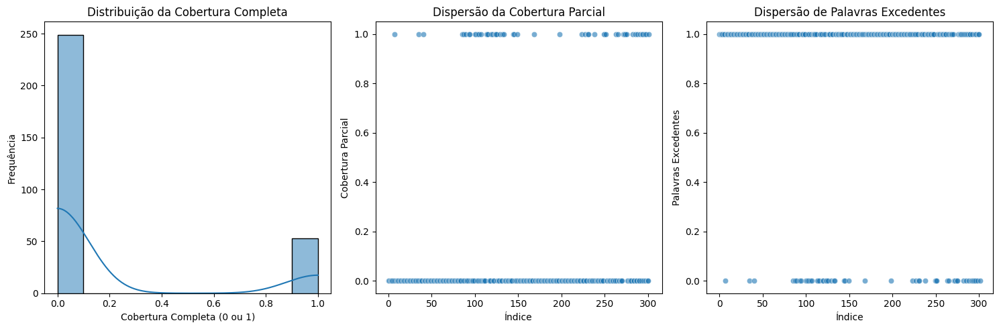


Análise de classificações, Manual x Keywords:
Cobertura Completa (Média): 14.9%
Cobertura Parcial (Média): 14.9%
Palavras Excedentes (Média): 85.1%


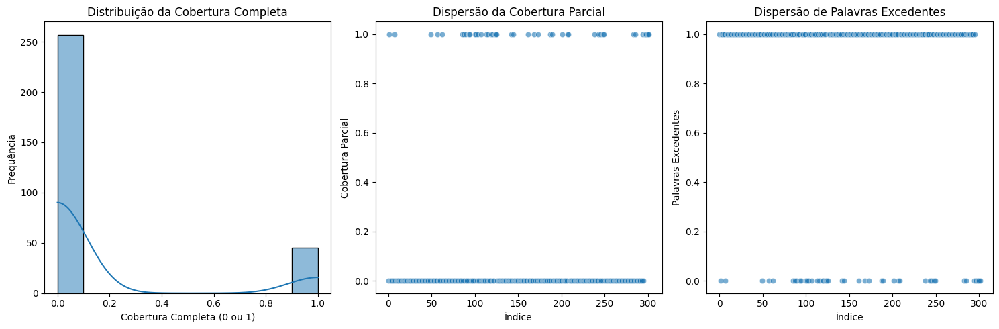

In [28]:
# metricas classificacao: classificacoes (com gpt e com feminist_words)

import matplotlib.pyplot as plt
import seaborn as sns

def analisar_classificacoes(df, col_manual, col_gpt):
    cobertura_completa = []
    cobertura_parcial = []
    palavras_excedentes = []

    for manual, gpt in zip(df[col_manual], df[col_gpt]):
        # Converte as classificações em conjuntos de palavras
        manual_set = set(manual.split(','))
        gpt_set = set(gpt.split(','))

        # Cobertura Completa das Classificações Manuais
        if manual_set.issubset(gpt_set):
            cobertura_completa.append(1)
        else:
            cobertura_completa.append(0)

        # Cobertura Parcial das Classificações Manuais
        cobertura_parcial.append(len(manual_set.intersection(gpt_set)) / len(manual_set))

        # Número de Palavras Excedentes em classificacoes_gpt
        palavras_excedentes.append(len(gpt_set) - len(manual_set.intersection(gpt_set)))

    # Convertendo as listas para colunas no dataframe
    df['cobertura_completa'] = cobertura_completa
    df['cobertura_parcial'] = cobertura_parcial
    df['palavras_excedentes'] = palavras_excedentes

    # Métricas globais
    cobertura_completa_media = df['cobertura_completa'].mean()
    cobertura_parcial_media = df['cobertura_parcial'].mean()
    palavras_excedentes_media = df['palavras_excedentes'].mean()

    return cobertura_completa_media, cobertura_parcial_media, palavras_excedentes_media

def plotar_distribuicao_cobertura(df):
    # Configuração do tamanho dos gráficos
    plt.figure(figsize=(15, 5))

    # Gráfico de distribuição da Cobertura Completa
    plt.subplot(1, 3, 1)
    sns.histplot(df['cobertura_completa'], kde=True, bins=10)
    plt.title('Distribuição da Cobertura Completa')
    plt.xlabel('Cobertura Completa (0 ou 1)')
    plt.ylabel('Frequência')

    # Gráfico de dispersão da Cobertura Parcial
    plt.subplot(1, 3, 2)
    sns.scatterplot(x=range(len(df)), y=df['cobertura_parcial'], alpha=0.6)
    plt.title('Dispersão da Cobertura Parcial')
    plt.xlabel('Índice')
    plt.ylabel('Cobertura Parcial')

    # Gráfico de dispersão do Número de Palavras Excedentes
    plt.subplot(1, 3, 3)
    sns.scatterplot(x=range(len(df)), y=df['palavras_excedentes'], alpha=0.6)
    plt.title('Dispersão de Palavras Excedentes')
    plt.xlabel('Índice')
    plt.ylabel('Palavras Excedentes')

    # Exibe os gráficos
    plt.tight_layout()
    plt.show()


cobertura_completa_media, cobertura_parcial_media, palavras_excedentes_media = analisar_classificacoes(tweets_classificados_metricas, 'classificacoes_manual_clean', 'classificacoes_gpt_clean')

print("\nAnálise de classificações, Manual x GPT:")
print(f"Cobertura Completa (Média): {round(cobertura_completa_media * 100, 2)}%")
print(f"Cobertura Parcial (Média): {round(cobertura_parcial_media * 100, 2)}%")
print(f"Palavras Excedentes (Média): {round(palavras_excedentes_media * 100, 2)}%")
plotar_distribuicao_cobertura(tweets_classificados_metricas)

cobertura_completa_media, cobertura_parcial_media, palavras_excedentes_media = analisar_classificacoes(tweets_classificados_metricas, 'classificacoes_manual_clean', 'classificacoes_keywords_clean')

print("\nAnálise de classificações, Manual x Keywords:")
print(f"Cobertura Completa (Média): {round(cobertura_completa_media * 100, 2)}%")
print(f"Cobertura Parcial (Média): {round(cobertura_parcial_media * 100, 2)}%")
print(f"Palavras Excedentes (Média): {round(palavras_excedentes_media * 100, 2)}%")
plotar_distribuicao_cobertura(tweets_classificados_metricas)

In [29]:
# add influencers classifications on tweets
tweets_classificados_metricas[['text', *tweets_classificados_metricas.columns[-6:]]].head(20)

,text,classificacoes_manual_clean,classificacoes_gpt_clean,classificacoes_keywords_clean,cobertura_completa,cobertura_parcial,palavras_excedentes
5,RT @dougoliverx: o único relacionamento abusiv...,relacionamen,abusi relacionamen,abusi,0,0.0,1
17,Feminicídio. Uma mulher foi assassinada brutal...,feminicid,mulh,feminicid,1,1.0,0
154,"@carvalhoismaels ""Vai cortar quando?""\n""Você a...",aparenc hom,mulh,,0,0.0,1
185,@JefinhoMenes aqui uma mulher! governo pras mu...,politi mulh,mulh,mulh,0,0.0,1
321,Cadê umas mulheres front pra vir pra equipe &l...,empre mulh,mulh,mulh,0,0.0,1
339,@DesejoDeMatar Caem muito fácil em ilusão. Vai...,mulh ofen,mulh,,0,0.0,1
432,@jairmearrependi Kkkkkkkkkkkkkkkk não tem Bols...,mulh ofen,mulh bolsona,,0,0.0,1
510,RT @masaquecusto: meu amigo “como é mesmo o no...,misogin,misogin,misogin,1,1.0,0
516,A mulher gravando vídeo pra processo seletivo ...,empre,mulh,,0,0.0,1
524,@Moreirananda_ @roberta_bastoss Como não exist...,relacionamen,,se,0,0.0,1


Vamos testar outros modelos para as classificacoes.

In [30]:
# LSA (Latent Semantic Analysis)
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer
import nltk
from nltk.corpus import stopwords

# Baixe as stop words em português
nltk.download('stopwords')
stop_words_pt = stopwords.words('portuguese')

# Exemplo de DataFrame
df = tweets_treino.copy()

# Passo 1: Criação da Matriz TF-IDF
vectorizer = TfidfVectorizer(stop_words=stop_words_pt)
X_tfidf = vectorizer.fit_transform(df['processed_tweet'])

# Passo 2: Aplicação do LSA com SVD
n_components = 4  # Número de tópicos
lsa = make_pipeline(TruncatedSVD(n_components), Normalizer(copy=False))
X_lsa = lsa.fit_transform(X_tfidf)

# Palavras mais importantes por tópico
terms = vectorizer.get_feature_names_out()

# Coletando palavras importantes de cada tópico
topic_terms = []
for i, component in enumerate(lsa[0].components_):
    terms_in_topic = [terms[j] for j in component.argsort()[:-10 - 1:-1]]
    topic_terms.append(set(terms_in_topic))

# Identificando palavras exclusivas por tópico
exclusive_terms = []
for i, terms_set in enumerate(topic_terms):
    other_terms = set().union(*[topic_terms[j] for j in range(len(topic_terms)) if j != i])
    exclusive = terms_set - other_terms
    exclusive_terms.append(exclusive)


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [31]:
# Exibindo palavras exclusivas de cada tópico
for i, exclusive in enumerate(exclusive_terms):
    print(f"Tópico {i}: {' '.join(exclusive)}")

Tópico 0: justicapormariferrer intencao caso existe
Tópico 1: contra pode liberdade
Tópico 2: marielle espaco franco iniciativa programa
Tópico 3: 


In [32]:
# Adicionando os tópicos ao DataFrame original
df['topico'] = X_lsa.argmax(axis=1)
df[['processed_tweet', 'topico']].head()

,processed_tweet,topico
0,pretende investigar pretende investigar imagin...,1
1,so ler falas desse velho homofobico sobe revol...,1
2,coronel brilhante ustra respeitava direitos hu...,1
3,liberdade acabou vacina obrigatoria todos 45 m...,1
4,lixo travesti barbado,0


In [33]:
# Topicos

df.topico.value_counts()

topico
1    854
0    149
2     56
Name: count, dtype: int64

LSA nao capturou muito bem os topicos que estamos procurando. O ideal seria nao dar topicos, vamos tentar outra abordagem: escolher a palavra mais importante de cada tweet, e entao clusteriza-las e tentar dar um significado para elas.

In [35]:
# TF-IDF

import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
import nltk

# Passo 1: Baixar stop words em português
nltk.download('stopwords')
stop_words_pt = stopwords.words('portuguese')

df = tweets_treino.copy()

# Passo 2: Criação da Matriz TF-IDF
vectorizer = TfidfVectorizer(stop_words=stop_words_pt, max_df=0.9)
X_tfidf = vectorizer.fit_transform(df['processed_tweet'])

# Passo 3: Extração das palavras mais importantes
feature_names = vectorizer.get_feature_names_out()

def get_top_keywords(row, feature_names, top_n=5):
    # Ordenar as palavras por seu peso TF-IDF
    indices = row.argsort()[::-1][:top_n]  # Pega os índices das top_n palavras
    top_words = [feature_names[i] for i in indices if row[i] > 0]  # Certifique-se de que o peso é maior que 0
    return top_words

# Aplicando a função para cada tweet
df['palavras_importantes_tfidf'] = [get_top_keywords(X_tfidf[i].toarray().flatten(), feature_names) for i in range(X_tfidf.shape[0])]

# Exibindo o DataFrame com as palavras mais importantes para cada tweet
df[['processed_tweet', 'palavras_importantes_tfidf']].head()


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,processed_tweet,palavras_importantes_tfidf
0,pretende investigar pretende investigar imagin...,"[pretende, investigar, eventual, punir, imagino]"
1,so ler falas desse velho homofobico sobe revol...,"[homofobico, abandonada, lar, energumeno, hipo..."
2,coronel brilhante ustra respeitava direitos hu...,"[coronel, hamilton, respeitava, dw, brilhante]"
3,liberdade acabou vacina obrigatoria todos 45 m...,"[paulistas, obrigatoria, ameacar, acabou, milh..."
4,lixo travesti barbado,"[barbado, travesti, lixo]"


In [36]:
# RAKE
from IPython.display import display
import pandas as pd
from rake_nltk import Rake
import nltk
nltk.download('punkt')

# Baixar as stop words do nltk
nltk.download('stopwords')

# Inicializar o RAKE com stop words em português
rake = Rake(language='portuguese')

# Função para extrair de 1 a 3 palavras mais importantes de cada tweet
def extrair_palavras_importantes(texto):
    rake.extract_keywords_from_text(texto)
    # Obter as frases/palavras-chave
    key_phrases = rake.get_ranked_phrases()[:3]  # Limitar a 3 palavras
    # Quebrar frases em palavras e retornar as mais relevantes
    palavras_importantes = ' '.join(key_phrases).split()[:5]  # Limitar a 3 palavras
    return palavras_importantes

# Aplicar a função para cada tweet
df['palavras_importantes_rake'] = df['processed_tweet'].apply(extrair_palavras_importantes)

# Exibir o DataFrame com as palavras importantes extraídas
display(df[['processed_tweet', 'palavras_importantes_tfidf', 'palavras_importantes_rake']].head())
display(df[['processed_tweet', 'palavras_importantes_tfidf', 'palavras_importantes_rake']].tail())


[nltk_data] Downloading package punkt to /home/mindera/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,processed_tweet,palavras_importantes_tfidf,palavras_importantes_rake
0,pretende investigar pretende investigar imagin...,"[pretende, investigar, eventual, punir, imagino]","[pretende, investigar, pretende, investigar, i..."
1,so ler falas desse velho homofobico sobe revol...,"[homofobico, abandonada, lar, energumeno, hipo...","[so, ler, falas, desse, velho]"
2,coronel brilhante ustra respeitava direitos hu...,"[coronel, hamilton, respeitava, dw, brilhante]","[coronel, brilhante, ustra, respeitava, direitos]"
3,liberdade acabou vacina obrigatoria todos 45 m...,"[paulistas, obrigatoria, ameacar, acabou, milh...","[liberdade, acabou, vacina, obrigatoria, todos]"
4,lixo travesti barbado,"[barbado, travesti, lixo]","[lixo, travesti, barbado]"


,processed_tweet,palavras_importantes_tfidf,palavras_importantes_rake
1054,tia zap bandeira brasil ato anti democratico f...,"[protesto, queimando, zap, tia, democratico]","[tia, zap, bandeira, brasil, ato]"
1055,cd projekt empresa game polonia sido porta ent...,"[polonia, projekt, cd, perceba, entrada]","[cd, projekt, empresa, game, polonia]"
1056,centro belo horizonte artes predios destroi tr...,"[predios, trabalhadores, feias, carregadas, ar...","[centro, belo, horizonte, artes, predios]"
1057,percebo muitos odeiam opiniao contraria pautas...,"[contraria, pautas, opiniao, percebo, toxico]","[percebo, muitos, odeiam, opiniao, contraria]"
1058,ficaria primeiro terceiro porem considero urge...,"[inventando, soja, comportar, terceiro, trazer]","[ficaria, primeiro, terceiro, porem, considero]"


In [37]:
# BERT

import torch
from transformers import BertTokenizerFast, BertModel
import re

# Carregar o modelo BERT pré-treinado e o tokenizer rápido
model_name = 'bert-base-uncased'
tokenizer = BertTokenizerFast.from_pretrained(model_name)  # Usar BertTokenizerFast
model = BertModel.from_pretrained(model_name, output_attentions=True)

# Função para extrair as palavras mais importantes com base na palavra original
def get_important_words(tweet, n_words=3):
    # Tokenizar o tweet
    inputs = tokenizer(tweet, return_tensors='pt', truncation=True, max_length=128, return_offsets_mapping=True)
    input_ids = inputs['input_ids']
    attention_mask = inputs['attention_mask']
    offset_mapping = inputs['offset_mapping']  # Mapeamento dos tokens para posições no texto original

    # Passar pelo modelo BERT
    outputs = model(input_ids, attention_mask=attention_mask)
    
    # Extraindo pesos de atenção da última camada
    attention = outputs.attentions[-1]
    
    # Média dos pesos de atenção entre todas as cabeças
    mean_attention = attention.mean(dim=1).squeeze(0)
    
    # Somar pesos de atenção para cada token
    token_importance = mean_attention.sum(dim=0)
    
    # Encontrar os índices dos tokens mais importantes
    important_indices = torch.argsort(token_importance, descending=True)
    
    # Filtrar tokens especiais e subpalavras, e construir a lista final de palavras importantes
    important_words = set()
    for idx in important_indices:
        token = tokenizer.convert_ids_to_tokens(input_ids[0, idx].item())
        # Ignorar tokens especiais e subpalavras
        if token not in ["[CLS]", "[SEP]"] and not token.startswith("##") and not re.search(r'\d', token):
            # Encontrar a posição original da palavra e extrair a palavra completa
            start, end = offset_mapping[0, idx]
            next_space = tweet[start:].find(' ')

            if next_space != -1:
                end = start + next_space
            else:
                end = len(tweet)

            word = tweet[start:end]
            important_words.add(word)
        if len(important_words) >= n_words:
            break
    
    return list(important_words)

# Aplicar a função get_important_words a cada tweet no DataFrame
df['palavras_importantes_bert'] = df['processed_tweet'].apply(lambda x: get_important_words(x, n_words=3))

# Exibindo o DataFrame com as palavras mais importantes para cada tweet
display(df[['processed_tweet', 'classificacoes', 'palavras_importantes_tfidf', 'palavras_importantes_rake', 'palavras_importantes_bert']].head())
display(df[['processed_tweet', 'classificacoes', 'palavras_importantes_tfidf', 'palavras_importantes_rake', 'palavras_importantes_bert']].tail())


A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Pl

,processed_tweet,classificacoes,palavras_importantes_tfidf,palavras_importantes_rake,palavras_importantes_bert
0,pretende investigar pretende investigar imagin...,abuso,"[pretende, investigar, eventual, punir, imagino]","[pretende, investigar, pretende, investigar, i...","[eventual, tb, pretende]"
1,so ler falas desse velho homofobico sobe revol...,"adoção, criança","[homofobico, abandonada, lar, energumeno, hipo...","[so, ler, falas, desse, velho]","[hipocrita, homofobico, energumeno]"
2,coronel brilhante ustra respeitava direitos hu...,direitos humanos,"[coronel, hamilton, respeitava, dw, brilhante]","[coronel, brilhante, ustra, respeitava, direitos]","[carlos, humanos, presidente]"
3,liberdade acabou vacina obrigatoria todos 45 m...,vacina obrigatória,"[paulistas, obrigatoria, ameacar, acabou, milh...","[liberdade, acabou, vacina, obrigatoria, todos]","[vacina, paulistas, ameacar]"
4,lixo travesti barbado,"ofensa lgbt, trans","[barbado, travesti, lixo]","[lixo, travesti, barbado]","[barbado, lixo, travesti]"


,processed_tweet,classificacoes,palavras_importantes_tfidf,palavras_importantes_rake,palavras_importantes_bert
1054,tia zap bandeira brasil ato anti democratico f...,"feminista, democracia","[protesto, queimando, zap, tia, democratico]","[tia, zap, bandeira, brasil, ato]","[anti, feminista, protesto]"
1055,cd projekt empresa game polonia sido porta ent...,"lgbt, racismo, feminista","[polonia, projekt, cd, perceba, entrada]","[cd, projekt, empresa, game, polonia]","[lgbt, cd, feminista]"
1056,centro belo horizonte artes predios destroi tr...,"lgbt, racismo, feminista","[predios, trabalhadores, feias, carregadas, ar...","[centro, belo, horizonte, artes, predios]","[centro, lgbt, feminista]"
1057,percebo muitos odeiam opiniao contraria pautas...,"lgbt, racismo, feminista","[contraria, pautas, opiniao, percebo, toxico]","[percebo, muitos, odeiam, opiniao, contraria]","[racial, lgbt, gamer]"
1058,ficaria primeiro terceiro porem considero urge...,masculinidade,"[inventando, soja, comportar, terceiro, trazer]","[ficaria, primeiro, terceiro, porem, considero]","[modismos, masculinidade, inventando]"


In [50]:
# TextRank

import pandas as pd
import nltk
import networkx as nx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Baixar stop words em português
nltk.download('stopwords')
nltk.download('punkt')
stop_words = set(stopwords.words('portuguese'))

def preprocess_text(text):
    # Tokenização e remoção de stop words
    tokens = word_tokenize(text.lower())
    filtered_tokens = [token for token in tokens if token.isalpha() and token not in stop_words]
    return filtered_tokens

def build_graph(words):
    # Criação do grafo baseado nas palavras
    graph = nx.Graph()
    
    # Conectar cada palavra com a próxima
    for i, word in enumerate(words):
        if i < len(words) - 1:
            graph.add_edge(word, words[i + 1])
    
    return graph

def extract_keywords(text, n_keywords=5):
    words = preprocess_text(text)
    if len(words) == 0:
        return []
    
    graph = build_graph(words)
    scores = nx.pagerank(graph)
    
    # Ordenar as palavras pelos scores do PageRank
    ranked_words = sorted(scores, key=scores.get, reverse=True)
    
    # Retornar as n palavras mais importantes
    return ranked_words[:n_keywords]


# Aplicando o TextRank para cada tweet e armazenando as palavras-chave
df['palavras_importantes_textrank'] = df['processed_tweet'].apply(lambda x: extract_keywords(x))

# Exibindo o DataFrame com as palavras mais importantes para cada tweet
display(df[['processed_tweet', 'palavras_importantes_tfidf', 'palavras_importantes_rake', 'palavras_importantes_bert', 'palavras_importantes_textrank']].head())
display(df[['processed_tweet', 'palavras_importantes_tfidf', 'palavras_importantes_rake', 'palavras_importantes_bert', 'palavras_importantes_textrank']].tail())



[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/mindera/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


,processed_tweet,palavras_importantes_tfidf,palavras_importantes_rake,palavras_importantes_bert,palavras_importantes_textrank
0,pretende investigar pretende investigar imagin...,"[pretende, investigar, eventual, punir, imagino]","[pretende, investigar, pretende, investigar, i...","[eventual, tb, pretende]","[pretende, coisa, alguma, eventual, abuso]"
1,so ler falas desse velho homofobico sobe revol...,"[homofobico, abandonada, lar, energumeno, hipo...","[so, ler, falas, desse, velho]","[hipocrita, homofobico, energumeno]","[homofobico, n, ler, amor, falas]"
2,coronel brilhante ustra respeitava direitos hu...,"[coronel, hamilton, respeitava, dw, brilhante]","[coronel, brilhante, ustra, respeitava, direitos]","[carlos, humanos, presidente]","[coronel, dw, humanos, vice, direitos]"
3,liberdade acabou vacina obrigatoria todos 45 m...,"[paulistas, obrigatoria, ameacar, acabou, milh...","[liberdade, acabou, vacina, obrigatoria, todos]","[vacina, paulistas, ameacar]","[acabou, alem, vacina, paulistas, obrigatoria]"
4,lixo travesti barbado,"[barbado, travesti, lixo]","[lixo, travesti, barbado]","[barbado, lixo, travesti]","[travesti, lixo, barbado]"


,processed_tweet,palavras_importantes_tfidf,palavras_importantes_rake,palavras_importantes_bert,palavras_importantes_textrank
1054,tia zap bandeira brasil ato anti democratico f...,"[protesto, queimando, zap, tia, democratico]","[tia, zap, bandeira, brasil, ato]","[anti, feminista, protesto]","[zap, igreja, bandeira, queimando, brasil]"
1055,cd projekt empresa game polonia sido porta ent...,"[polonia, projekt, cd, perceba, entrada]","[cd, projekt, empresa, game, polonia]","[lgbt, cd, feminista]","[polonia, projekt, rapido, empresa, perceba]"
1056,centro belo horizonte artes predios destroi tr...,"[predios, trabalhadores, feias, carregadas, ar...","[centro, belo, horizonte, artes, predios]","[centro, lgbt, feminista]","[belo, alem, horizonte, vomitar, artes]"
1057,percebo muitos odeiam opiniao contraria pautas...,"[contraria, pautas, opiniao, percebo, toxico]","[percebo, muitos, odeiam, opiniao, contraria]","[racial, lgbt, gamer]","[pautas, contraria, opiniao, muitos, quer]"
1058,ficaria primeiro terceiro porem considero urge...,"[inventando, soja, comportar, terceiro, trazer]","[ficaria, primeiro, terceiro, porem, considero]","[modismos, masculinidade, inventando]","[primeiro, debate, terceiro, p, porem]"


In [39]:
# POS Tagging

import pandas as pd
import nltk
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from nltk import pos_tag, word_tokenize

# Definir stop words em português
stop_words_pt = stopwords.words('portuguese')

# Função para POS Tagging e seleção de palavras de conteúdo com mais categorias
def extrair_palavras_conteudo(tweet):
    # Tokenizar o tweet
    tokens = word_tokenize(tweet.lower())
    
    # Aplicar POS Tagging
    pos_tags = pos_tag(tokens)
    
    # Filtrar palavras de conteúdo com mais categorias (substantivos, adjetivos, verbos, advérbios)
    palavras_conteudo = [
        word for word, tag in pos_tags
        if (tag.startswith('NN') or tag.startswith('VB') or tag.startswith('JJ') or tag.startswith('RB'))
        and word not in stop_words_pt
    ]
    
    return ' '.join(palavras_conteudo)

# Aplicar a função para extrair palavras de conteúdo de cada tweet
df['palavras_conteudo'] = df['processed_tweet'].apply(extrair_palavras_conteudo)

# Usar TF-IDF para selecionar as palavras mais importantes
vectorizer = TfidfVectorizer(max_features=10)  # Aumentando o número de palavras consideradas
tfidf_matrix = vectorizer.fit_transform(df['palavras_conteudo'])

# Função para obter as palavras mais importantes
def palavras_importantes(tfidf_vector, feature_names):
    sorted_indices = tfidf_vector.argsort()[::-1]
    return [feature_names[i] for i in sorted_indices[:3] if tfidf_vector[i] > 0]

# Adicionar palavras importantes ao DataFrame
feature_names = vectorizer.get_feature_names_out()
df['palavras_importantes_pos_tag'] = [
    palavras_importantes(tfidf_vector, feature_names)
    for tfidf_vector in tfidf_matrix.toarray()
]

# Exibir o DataFrame com as palavras importantes
display(df[['processed_tweet', 'classificacoes', 'palavras_importantes_tfidf', 'palavras_importantes_rake', 'palavras_importantes_bert', 'palavras_importantes_textrank', 'palavras_importantes_pos_tag']].head())
display(df[['processed_tweet', 'classificacoes', 'palavras_importantes_tfidf', 'palavras_importantes_rake', 'palavras_importantes_bert', 'palavras_importantes_textrank', 'palavras_importantes_pos_tag']].tail())


,processed_tweet,classificacoes,palavras_importantes_tfidf,palavras_importantes_rake,palavras_importantes_bert,palavras_importantes_textrank,palavras_importantes_pos_tag
0,pretende investigar pretende investigar imagin...,abuso,"[pretende, investigar, eventual, punir, imagino]","[pretende, investigar, pretende, investigar, i...","[eventual, tb, pretende]","[pretende, coisa, alguma, eventual, abuso]",[]
1,so ler falas desse velho homofobico sobe revol...,"adoção, criança","[homofobico, abandonada, lar, energumeno, hipo...","[so, ler, falas, desse, velho]","[hipocrita, homofobico, energumeno]","[homofobico, n, ler, amor, falas]",[so]
2,coronel brilhante ustra respeitava direitos hu...,direitos humanos,"[coronel, hamilton, respeitava, dw, brilhante]","[coronel, brilhante, ustra, respeitava, direitos]","[carlos, humanos, presidente]","[coronel, dw, humanos, vice, direitos]",[direitos]
3,liberdade acabou vacina obrigatoria todos 45 m...,vacina obrigatória,"[paulistas, obrigatoria, ameacar, acabou, milh...","[liberdade, acabou, vacina, obrigatoria, todos]","[vacina, paulistas, ameacar]","[acabou, alem, vacina, paulistas, obrigatoria]",[liberdade]
4,lixo travesti barbado,"ofensa lgbt, trans","[barbado, travesti, lixo]","[lixo, travesti, barbado]","[barbado, lixo, travesti]","[travesti, lixo, barbado]",[]


,processed_tweet,classificacoes,palavras_importantes_tfidf,palavras_importantes_rake,palavras_importantes_bert,palavras_importantes_textrank,palavras_importantes_pos_tag
1054,tia zap bandeira brasil ato anti democratico f...,"feminista, democracia","[protesto, queimando, zap, tia, democratico]","[tia, zap, bandeira, brasil, ato]","[anti, feminista, protesto]","[zap, igreja, bandeira, queimando, brasil]",[]
1055,cd projekt empresa game polonia sido porta ent...,"lgbt, racismo, feminista","[polonia, projekt, cd, perceba, entrada]","[cd, projekt, empresa, game, polonia]","[lgbt, cd, feminista]","[polonia, projekt, rapido, empresa, perceba]",[]
1056,centro belo horizonte artes predios destroi tr...,"lgbt, racismo, feminista","[predios, trabalhadores, feias, carregadas, ar...","[centro, belo, horizonte, artes, predios]","[centro, lgbt, feminista]","[belo, alem, horizonte, vomitar, artes]",[]
1057,percebo muitos odeiam opiniao contraria pautas...,"lgbt, racismo, feminista","[contraria, pautas, opiniao, percebo, toxico]","[percebo, muitos, odeiam, opiniao, contraria]","[racial, lgbt, gamer]","[pautas, contraria, opiniao, muitos, quer]",[]
1058,ficaria primeiro terceiro porem considero urge...,masculinidade,"[inventando, soja, comportar, terceiro, trazer]","[ficaria, primeiro, terceiro, porem, considero]","[modismos, masculinidade, inventando]","[primeiro, debate, terceiro, p, porem]",[]


In [100]:
# Modelo Supervisionado (RandomForest)

import numpy as np
import nltk
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from gensim.models import Word2Vec

# Configurando NLTK e stop words
nltk.download('punkt')
nltk.download('stopwords')
stop_words = list(stopwords.words('portuguese'))

df['classificacoes_clean'] = df.classificacoes.apply(lambda x: preprocess_tweet(x))

# Atualizando lista de classificações aceitáveis
classificacoes_aceitaveis = ['patriarcado', 'marielle', 'misoginia', 'abusivo', 'estupradores', 
                             'lgbtfobico', 'feminazis', 'maternidade', 'salario', 'emancipacao', 
                             'transfobia', 'masculinidade', 'estuprador', 'feministas', 
                             'reprodutivo', 'lgbtqia', 'misoginos', 'assediador', 'feminicidio', 
                             'oprimida', 'abortistas', 'mulher', 'estupro', 'travesti', 
                             'igualitaria', 'feminina', 'violento', 'femininas', 'mulheres', 
                             'sexual', 'misogino', 'igualitarias', 'sexismo', 'violacao', 
                             'violencia', 'domestica', 'prostituicao', 'igualitario', 'autonomia', 
                             'igualdade', 'direitos', 'lesbica', 'opressao', 'lgbti', 'mulherismo', 
                             'feminismo', 'lgbt', 'discriminacao', 'abusos', 'misogina', 'aborto', 
                             'assedio', 'abortista', 'feminista', 'reprodutivos', 'assediadores', 
                             'sexualidade', 'lgbtqi', 'abuso', 'empoderamento', 'travestis', 
                             'homofobico', 'machista', 'machismo', 'genero', 'prostituta', 'sexo', 
                             'reprodutiva', 'anticoncepcional', 'camisinha', 'contraceptivo', 
                             'vagina', 'divorcio', 'racismo', 'racista']
classificacoes_organicas = list(set([word for sublist in [word.split(' ') for word in df.classificacoes_clean.to_list()] for word in sublist]))
classificacoes_aceitaveis = list(set(classificacoes_aceitaveis + classificacoes_organicas))

# Função para extrair características das palavras
def extract_features(tweet, index, tfidf_vectorizer, word2vec_model=None, classification_words=None):
    words = word_tokenize(tweet)
    word = words[index]
    
    # TF-IDF
    tfidf_matrix = tfidf_vectorizer.transform([tweet])
    tfidf_score = tfidf_matrix[0, tfidf_vectorizer.vocabulary_.get(word.lower(), 0)]
    
    # Posição da palavra
    position = index / len(words)
    
    # Comprimento da palavra
    length = len(word)
    
    # Similaridade com as classificações usando Word2Vec
    similarity = 0
    if word2vec_model and classification_words:
        similarities = [
            word2vec_model.wv.similarity(word.lower(), class_word)
            for class_word in classification_words if class_word in word2vec_model.wv and word.lower() in word2vec_model.wv
        ]
        if similarities:  # Verifica se a lista não está vazia
            similarity = max(similarities)
    
    return [tfidf_score, position, length, similarity]


# Vetorizador TF-IDF ajustado ao corpus de treino
tfidf_vectorizer = TfidfVectorizer(stop_words=stop_words)
tfidf_vectorizer.fit(df[df.test == False]['processed_tweet'])

# Treinando um modelo Word2Vec com os tweets de treino
tokenized_tweets = [word_tokenize(tweet) for tweet in df[df.test == False]['processed_tweet']]
word2vec_model = Word2Vec(sentences=tokenized_tweets, vector_size=100, window=5, min_count=1, workers=4)

# Preparando os dados de treinamento
features = []
labels = []

for i, row in df[df.test == False].iterrows():
    words = word_tokenize(row['processed_tweet'])
    classification_words = row['classificacoes_clean']
    for index in range(len(words)):
        if words[index].lower() in stop_words:
            continue
        features.append(extract_features(row['processed_tweet'], index, tfidf_vectorizer, word2vec_model, classification_words))
        labels.append(1 if words[index].lower() in classification_words else 0)

features = np.array(features)
labels = np.array(labels)

# Treinando o classificador RandomForest
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(features, labels)

# Função para predizer as palavras mais importantes em um tweet
def predict_important_words(tweet, clf, tfidf_vectorizer, word2vec_model=None, classificacoes_aceitaveis=None, top_n=3):
    words = word_tokenize(tweet)
    features = [extract_features(tweet, index, tfidf_vectorizer, word2vec_model, classificacoes_aceitaveis) for index in range(len(words))]
    predictions = clf.predict_proba(features)[:, 1]  # Probabilidade de ser 'importante'
    
    # Selecionar as palavras com maior probabilidade
    important_words = [words[i] for i in np.argsort(predictions)[-top_n:]]
    
    # Filtrar palavras para que sejam aceitáveis
    important_words = [word for word in important_words if word.lower() in classificacoes_aceitaveis]
    
    return important_words

tweets_only_teste = df[df.test == True].copy()

# Aplicando a função de predição para o DataFrame tweets_only_teste
tweets_only_teste['important_words_randomforest'] = tweets_only_teste.apply(
    lambda row: predict_important_words(
        row['processed_tweet'], clf, tfidf_vectorizer, word2vec_model, classificacoes_aceitaveis
    ), axis=1
)

tweets_only_teste['important_words_randomforest'] = tweets_only_teste['important_words_randomforest'].apply(lambda x: list(set(x)))

# Exibir o DataFrame com as palavras importantes
display(tweets_only_teste[['processed_tweet', 'classificacoes_clean', 'palavras_importantes_tfidf', 'palavras_importantes_rake', 'palavras_importantes_bert', 'palavras_importantes_textrank', 'palavras_importantes_pos_tag', 'important_words_randomforest']].head())
display(tweets_only_teste[['processed_tweet', 'classificacoes_clean', 'palavras_importantes_tfidf', 'palavras_importantes_rake', 'palavras_importantes_bert', 'palavras_importantes_textrank', 'palavras_importantes_pos_tag', 'important_words_randomforest']].tail())


[nltk_data] Downloading package punkt to /home/mindera/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,processed_tweet,classificacoes_clean,palavras_importantes_tfidf,palavras_importantes_rake,palavras_importantes_bert,palavras_importantes_textrank,palavras_importantes_pos_tag,important_words_randomforest
303,janaina paschoal desculpa esfarrapada manifest...,assedio,"[manifestar, estranho, lotado, paschoal, janaina]","[janaina, paschoal, desculpa, esfarrapada, man...","[contra, intencao, deputado]","[paschoal, lotado, desculpa, plenario, esfarra...",[contra],"[contra, assedio]"
304,existe igualdade negro brancos desigualdade ef...,igualdade racial,"[existe, passam, esforcaram, sorte, efemera]","[existe, igualdade, negro, brancos, desigualdade]","[enquanto, negro, fantasia]","[existe, igual, queria, fantasia, vida]",[],"[negro, igualdade]"
305,todos acordos dividas cruzeiro estao sendo jog...,futebol,"[jogados, cruzeiro, bancar, 150, acordos]","[todos, acordos, dividas, cruzeiro, estao]","[inclusive, time, bancar]","[acordos, caixa, dividas, time, cruzeiro]",[],"[diferenca, salarial]"
306,problema partir abril 2021 vence acordo teto s...,diferenca salarial,"[pagos, voltam, teto, previsao, vence]","[problema, partir, abril, 2021, vence]","[salarios, pagar, problema]","[partir, caixa, abril, previsao, vence]",[],"[diferenca, salarial]"
307,engracado classificacao etaria filmes colocam ...,classificacao etaria,"[filmes, sexo, ano, esquartejar, engracado]","[engracado, classificacao, etaria, filmes, col...","[sexo, vivo, filmes]","[filmes, sexo, ano, humano, classificacao]",[],"[sexo, etaria]"


,processed_tweet,classificacoes_clean,palavras_importantes_tfidf,palavras_importantes_rake,palavras_importantes_bert,palavras_importantes_textrank,palavras_importantes_pos_tag,important_words_randomforest
1054,tia zap bandeira brasil ato anti democratico f...,feminista democracia,"[protesto, queimando, zap, tia, democratico]","[tia, zap, bandeira, brasil, ato]","[anti, feminista, protesto]","[zap, igreja, bandeira, queimando, brasil]",[],"[feminista, protesto]"
1055,cd projekt empresa game polonia sido porta ent...,lgbt racismo feminista,"[polonia, projekt, cd, perceba, entrada]","[cd, projekt, empresa, game, polonia]","[lgbt, cd, feminista]","[polonia, projekt, rapido, empresa, perceba]",[],"[racial, lgbt, feminista]"
1056,centro belo horizonte artes predios destroi tr...,lgbt racismo feminista,"[predios, trabalhadores, feias, carregadas, ar...","[centro, belo, horizonte, artes, predios]","[centro, lgbt, feminista]","[belo, alem, horizonte, vomitar, artes]",[],"[racial, lgbt, feminista]"
1057,percebo muitos odeiam opiniao contraria pautas...,lgbt racismo feminista,"[contraria, pautas, opiniao, percebo, toxico]","[percebo, muitos, odeiam, opiniao, contraria]","[racial, lgbt, gamer]","[pautas, contraria, opiniao, muitos, quer]",[],"[feministas, lgbt, racial]"
1058,ficaria primeiro terceiro porem considero urge...,masculinidade,"[inventando, soja, comportar, terceiro, trazer]","[ficaria, primeiro, terceiro, porem, considero]","[modismos, masculinidade, inventando]","[primeiro, debate, terceiro, p, porem]",[],"[homem, masculinidade]"


In [101]:
# classificacoes
classificacoes_teste = list(set([word for sublist in [word.split(' ') for word in tweets_only_teste.classificacoes_clean.to_list()] for word in sublist]))
classificacoes_rf = list(set([word for sublist in tweets_only_teste.important_words_randomforest.to_list() for word in sublist]))

print('qtd palavras comuns manual e randomforest: ', len([word for word in classificacoes_teste if word in classificacoes_rf]))
print('palavras comuns manual e randomforest: ', [word for word in classificacoes_teste if word in classificacoes_rf])

print('qtd palavras exclusivamente manuais: ', len([word for word in classificacoes_teste if word not in classificacoes_rf]))
print('palavras exclusivamente manuais: ', [word for word in classificacoes_teste if word not in classificacoes_rf])

qtd palavras comuns manual e randomforest:  81
palavras comuns manual e randomforest:  ['vacina', 'misoginia', 'violacao', 'homem', 'ajuda', 'diferenca', 'eleicao', 'prostituicao', 'liberdade', 'crianca', 'opressao', 'domestica', 'relacionamento', 'news', 'midia', 'trans', 'feminicidio', 'aborto', 'programa', 'expressao', 'emprego', 'sexual', 'sociais', 'feminina', 'protesto', 'masculinidade', 'pena', 'patriarcado', 'jogo', 'violencia', 'salarial', 'indigena', 'familia', 'direitos', 'maternidade', 'machismo', 'ong', 'saude', 'marxismo', 'abuso', 'agressao', 'futebol', 'genero', 'juridico', 'criancas', 'feministas', 'assedio', 'mulher', 'prisao', 'mulheres', 'fake', 'feminismo', 'salario', 'palestra', 'contra', 'racial', 'financiamento', 'policial', 'negra', 'eleicoes', 'rede', 'lgbt', 'marielle', 'estupro', 'direito', 'deus', 'trabalho', 'solidao', 'bolsonaro', 'pandemia', 'sexo', 'livro', 'identidade', 'politica', 'feminista', 'etaria', 'educacao', 'economia', 'igualdade', 'ideologia'

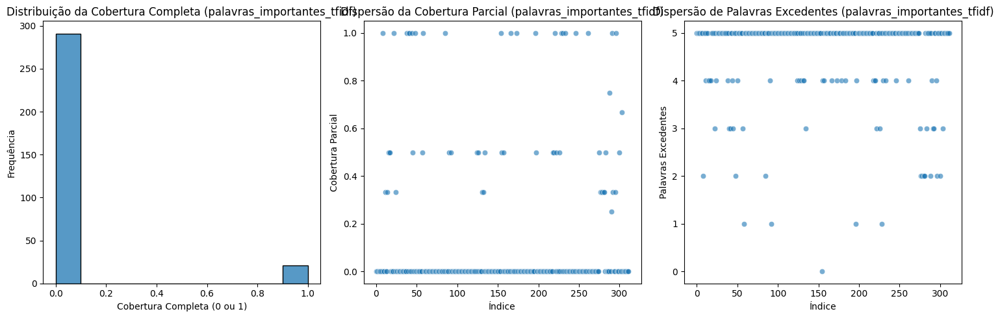

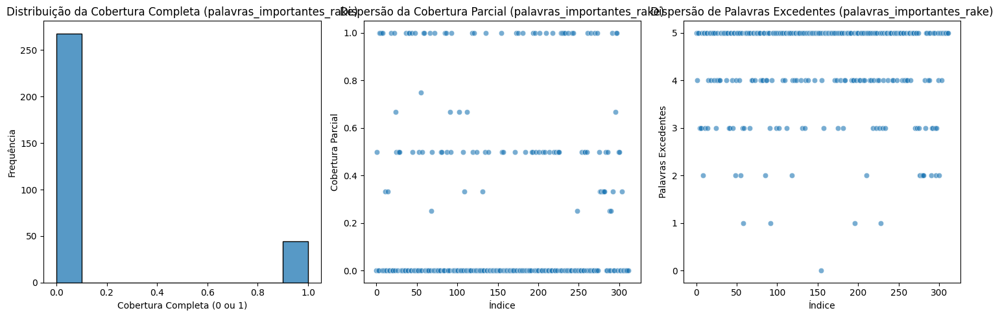

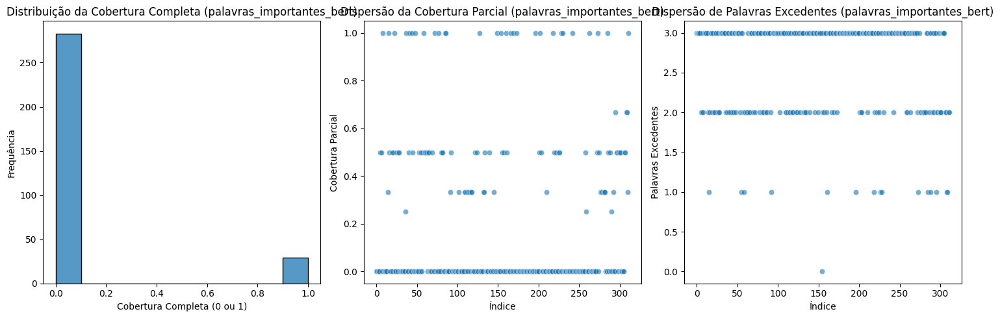

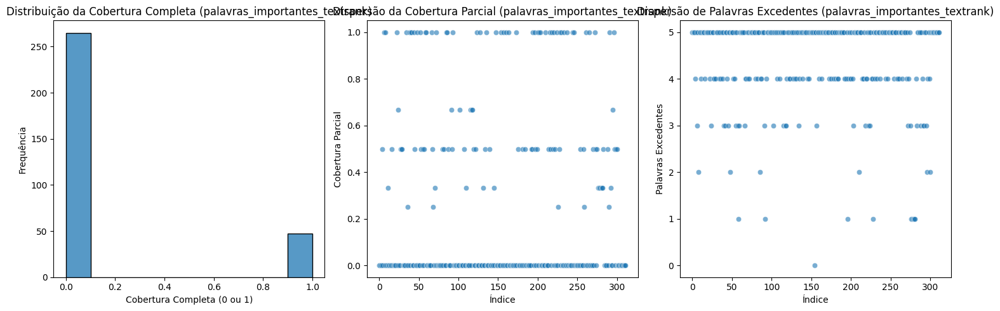

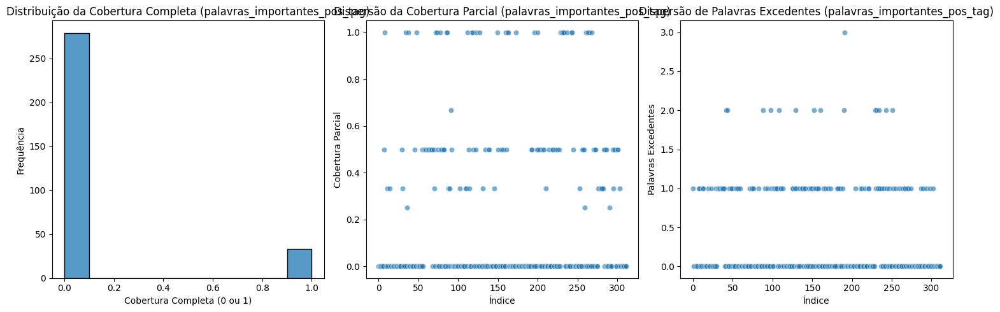

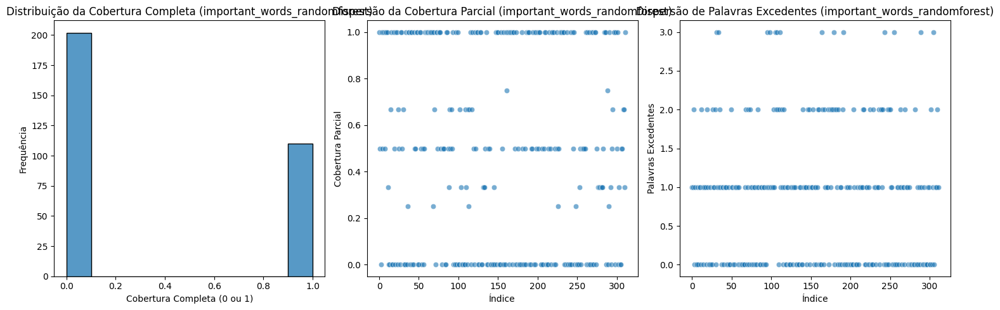

Análise de palavras_importantes_tfidf:
Cobertura Completa (Média): 6.73%
Cobertura Parcial (Média): 11.86%
Palavras Excedentes (Média): 4.63


Análise de palavras_importantes_rake:
Cobertura Completa (Média): 14.10%
Cobertura Parcial (Média): 24.01%
Palavras Excedentes (Média): 4.36


Análise de palavras_importantes_bert:
Cobertura Completa (Média): 9.29%
Cobertura Parcial (Média): 20.49%
Palavras Excedentes (Média): 2.60


Análise de palavras_importantes_textrank:
Cobertura Completa (Média): 15.06%
Cobertura Parcial (Média): 24.92%
Palavras Excedentes (Média): 4.39


Análise de palavras_importantes_pos_tag:
Cobertura Completa (Média): 10.58%
Cobertura Parcial (Média): 23.10%
Palavras Excedentes (Média): 0.40


Análise de important_words_randomforest:
Cobertura Completa (Média): 35.26%
Cobertura Parcial (Média): 49.73%
Palavras Excedentes (Média): 0.86




In [102]:
# Metricas
import matplotlib.pyplot as plt
import seaborn as sns

# Função para calcular as métricas de cobertura completa, parcial e palavras excedentes
def calcular_metricas_cobertura(df, col_lista, col_manual):
    cobertura_completa = []
    cobertura_parcial = []
    palavras_excedentes = []

    for lista, manual in zip(df[col_lista], df[col_manual]):
        # Convertendo classificacoes_clean em conjunto de palavras
        manual_set = set(manual.split())
        lista_set = set(lista)

        # Cobertura Completa
        cobertura_completa.append(1 if manual_set.issubset(lista_set) else 0)

        # Cobertura Parcial
        intersecao = manual_set.intersection(lista_set)
        cobertura_parcial.append(len(intersecao) / len(manual_set) if manual_set else 0)

        # Palavras Excedentes
        palavras_excedentes.append(len(lista_set - intersecao))

    return cobertura_completa, cobertura_parcial, palavras_excedentes

# Função para aplicar as métricas a todas as colunas de listas
def analisar_todas_colunas(df, colunas, col_manual):
    resultados = {}
    for col in colunas:
        cobertura_completa, cobertura_parcial, palavras_excedentes = calcular_metricas_cobertura(df, col, col_manual)
        resultados[col] = {
            'cobertura_completa_media': sum(cobertura_completa) / len(cobertura_completa),
            'cobertura_parcial_media': sum(cobertura_parcial) / len(cobertura_parcial),
            'palavras_excedentes_media': sum(palavras_excedentes) / len(palavras_excedentes),
            'cobertura_completa': cobertura_completa,
            'cobertura_parcial': cobertura_parcial,
            'palavras_excedentes': palavras_excedentes
        }
    return resultados

# Definindo as colunas de interesse
colunas_palavras_importantes = [
    'palavras_importantes_tfidf',
    'palavras_importantes_rake',
    'palavras_importantes_bert',
    'palavras_importantes_textrank',
    'palavras_importantes_pos_tag',
    'important_words_randomforest'
]

# Executando a análise
resultados = analisar_todas_colunas(tweets_only_teste, colunas_palavras_importantes, 'classificacoes_clean')

# Função para plotar os gráficos
def plotar_resultados(resultados):
    for col, metrics in resultados.items():
        plt.figure(figsize=(15, 5))

        # Gráfico de distribuição da Cobertura Completa
        plt.subplot(1, 3, 1)
        sns.histplot(metrics['cobertura_completa'], kde=False, bins=10)
        plt.title(f'Distribuição da Cobertura Completa ({col})')
        plt.xlabel('Cobertura Completa (0 ou 1)')
        plt.ylabel('Frequência')

        # Gráfico de dispersão da Cobertura Parcial
        plt.subplot(1, 3, 2)
        sns.scatterplot(x=range(len(metrics['cobertura_parcial'])), y=metrics['cobertura_parcial'], alpha=0.6)
        plt.title(f'Dispersão da Cobertura Parcial ({col})')
        plt.xlabel('Índice')
        plt.ylabel('Cobertura Parcial')

        # Gráfico de dispersão do Número de Palavras Excedentes
        plt.subplot(1, 3, 3)
        sns.scatterplot(x=range(len(metrics['palavras_excedentes'])), y=metrics['palavras_excedentes'], alpha=0.6)
        plt.title(f'Dispersão de Palavras Excedentes ({col})')
        plt.xlabel('Índice')
        plt.ylabel('Palavras Excedentes')

        # Exibe os gráficos
        plt.tight_layout()
        plt.show()

# Plotando os resultados
plotar_resultados(resultados)

# Exibindo as métricas globais
for col, metrics in resultados.items():
    print(f"Análise de {col}:")
    print(f"Cobertura Completa (Média): {metrics['cobertura_completa_media'] * 100:.2f}%")
    print(f"Cobertura Parcial (Média): {metrics['cobertura_parcial_media'] * 100:.2f}%")
    print(f"Palavras Excedentes (Média): {metrics['palavras_excedentes_media']:.2f}")
    print("\n")


**Cobertura Completa (Média)**: Random Forest teve uma cobertura completa média de 35.26%, que é significativamente maior do que as outras técnicas. Isso significa que, em mais de um terço dos casos, o Random Forest foi capaz de identificar todas as palavras-chave corretas.

**Cobertura Parcial (Média)**: Random Forest apresentou uma cobertura parcial média de 50.00%, novamente superando as outras abordagens. Isso sugere que, em média, o Random Forest conseguiu identificar metade das palavras-chave corretas.

**Palavras Excedentes (Média)**: Random Forest teve uma média de 0.85 palavras excedentes, o que indica que o modelo é relativamente preciso, identificando poucas palavras irrelevantes em comparação com as outras abordagens.

Vamos focar um pouco mais na Random Forest - sera que conseguimos melhorar ainda mais seus resultados?

In [103]:
# TTTTT

import pandas as pd
import numpy as np
import nltk
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from gensim.models import Word2Vec, KeyedVectors
from sklearn.utils.class_weight import compute_class_weight

# Configurando NLTK e stop words
nltk.download('punkt')
nltk.download('stopwords')
stop_words = list(stopwords.words('portuguese'))

# Parâmetros de configuração
use_ngrams = True           # Para usar n-grams no TF-IDF
tune_hyperparameters = True # Para realizar tuning de hiperparâmetros
balance_classes = True      # Para balancear classes no RandomForest
refine_word2vec = True      # Para ajustar parâmetros do Word2Vec
expand_semantics = True     # Para realizar expansão semântica

# Expansão Semântica (adicionando sinônimos)
if expand_semantics:
    from nltk.corpus import wordnet as wn
    nltk.download('wordnet')
    synonyms = []
    for word in classificacoes_aceitaveis:
        for syn in wn.synsets(word):
            for lemma in syn.lemmas():
                synonyms.append(lemma.name())
    classificacoes_aceitaveis = list(set(classificacoes_aceitaveis + synonyms))

# Função para extrair características das palavras
def extract_features(tweet, index, tfidf_vectorizer, word2vec_model=None, classification_words=None):
    words = word_tokenize(tweet)
    word = words[index]
    
    # TF-IDF
    tfidf_matrix = tfidf_vectorizer.transform([tweet])
    tfidf_score = tfidf_matrix[0, tfidf_vectorizer.vocabulary_.get(word.lower(), 0)]
    
    # Posição da palavra
    position = index / len(words)
    
    # Comprimento da palavra
    length = len(word)
    
    # Similaridade com as classificações usando Word2Vec
    similarity = 0
    if word2vec_model and classification_words:
        similarities = [
            word2vec_model.wv.similarity(word.lower(), class_word)
            for class_word in classification_words if class_word in word2vec_model.wv and word.lower() in word2vec_model.wv
        ]
        if similarities:  # Verifica se a lista não está vazia
            similarity = max(similarities)
    
    return [tfidf_score, position, length, similarity]

# Vetorizador TF-IDF ajustado ao corpus de treino
ngram_range = (1, 3) if use_ngrams else (1, 1)
tfidf_vectorizer = TfidfVectorizer(stop_words=stop_words, ngram_range=ngram_range)
tfidf_vectorizer.fit(df[df.test == False]['processed_tweet'])

# Treinando um modelo Word2Vec com os tweets de treino
tokenized_tweets = [word_tokenize(tweet) for tweet in df[df.test == False]['processed_tweet']]
vector_size = 200 if refine_word2vec else 100
window_size = 10 if refine_word2vec else 5
word2vec_model = Word2Vec(sentences=tokenized_tweets, vector_size=vector_size, window=window_size, min_count=1, workers=4)

# Preparando os dados de treinamento
features = []
labels = []

for i, row in df[df.test == False].iterrows():
    words = word_tokenize(row['processed_tweet'])
    classification_words = row['classificacoes_clean']
    for index in range(len(words)):
        if words[index].lower() in stop_words:
            continue
        features.append(extract_features(row['processed_tweet'], index, tfidf_vectorizer, word2vec_model, classification_words))
        labels.append(1 if words[index].lower() in classification_words else 0)

features = np.array(features)
labels = np.array(labels)

# Tuning de Hiperparâmetros
if tune_hyperparameters:
    param_grid = {
        'n_estimators': [100, 200, 500],
        'max_depth': [10, 20, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    }
    clf = GridSearchCV(RandomForestClassifier(random_state=42, class_weight='balanced' if balance_classes else None), param_grid, cv=3, n_jobs=-1, verbose=2)
else:
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced' if balance_classes else None)

clf.fit(features, labels)

# Função para predizer as palavras mais importantes em um tweet
def predict_important_words(tweet, clf, tfidf_vectorizer, word2vec_model=None, classificacoes_aceitaveis=None, top_n=3):
    words = word_tokenize(tweet)
    features = [extract_features(tweet, index, tfidf_vectorizer, word2vec_model, classificacoes_aceitaveis) for index in range(len(words))]
    predictions = clf.predict_proba(features)[:, 1]  # Probabilidade de ser 'importante'
    
    # Selecionar as palavras com maior probabilidade
    important_words = [words[i] for i in np.argsort(predictions)[-top_n:]]
    
    # Filtrar palavras para que sejam aceitáveis
    important_words = [word for word in important_words if word.lower() in classificacoes_aceitaveis]
    
    return important_words

tweets_only_teste = df[df.test == True].copy()

# Aplicando a função de predição para o DataFrame tweets_only_teste
tweets_only_teste['important_words_randomforest_TTTTT'] = tweets_only_teste.apply(
    lambda row: predict_important_words(
        row['processed_tweet'], clf, tfidf_vectorizer, word2vec_model, classificacoes_aceitaveis
    ), axis=1
)

tweets_only_teste['important_words_randomforest_TTTTT'] = tweets_only_teste['important_words_randomforest_TTTTT'].apply(lambda x: list(set(x)))

# # Exibir o DataFrame com as palavras importantes
display(tweets_only_teste[['processed_tweet', 'classificacoes_clean', 'important_words_randomforest_TTTTT']].head())
display(tweets_only_teste[['processed_tweet', 'classificacoes_clean', 'important_words_randomforest_TTTTT']].tail())


[nltk_data] Downloading package punkt to /home/mindera/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/mindera/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Fitting 3 folds for each of 162 candidates, totalling 486 fits


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_s

,processed_tweet,classificacoes_clean,important_words_randomforest_TTTTT
303,janaina paschoal desculpa esfarrapada manifest...,assedio,[]
304,existe igualdade negro brancos desigualdade ef...,igualdade racial,"[negro, igualdade]"
305,todos acordos dividas cruzeiro estao sendo jog...,futebol,"[diferenca, salarial]"
306,problema partir abril 2021 vence acordo teto s...,diferenca salarial,"[diferenca, salarial]"
307,engracado classificacao etaria filmes colocam ...,classificacao etaria,[sexo]


,processed_tweet,classificacoes_clean,important_words_randomforest_TTTTT
1054,tia zap bandeira brasil ato anti democratico f...,feminista democracia,[feminista]
1055,cd projekt empresa game polonia sido porta ent...,lgbt racismo feminista,"[racial, lgbt, feminista]"
1056,centro belo horizonte artes predios destroi tr...,lgbt racismo feminista,"[expressao, lgbt, feminista]"
1057,percebo muitos odeiam opiniao contraria pautas...,lgbt racismo feminista,"[feministas, lgbt]"
1058,ficaria primeiro terceiro porem considero urge...,masculinidade,[homem]


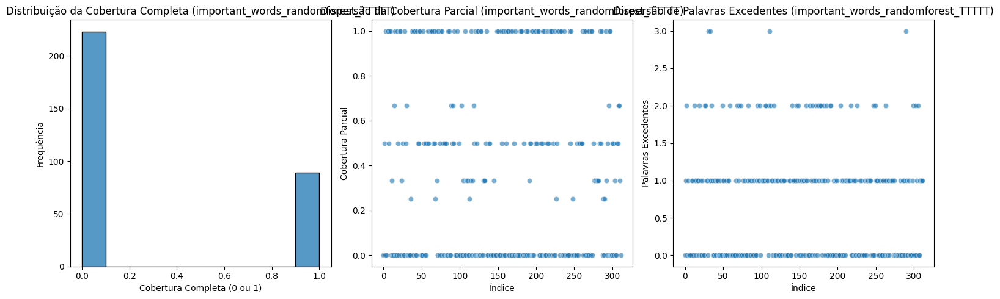

Análise de important_words_randomforest_TTTTT:
Cobertura Completa (Média): 28.53%
Cobertura Parcial (Média): 42.28%
Palavras Excedentes (Média): 0.72




In [104]:
# Definindo as colunas de interesse
colunas_palavras_importantes = [
    'important_words_randomforest_TTTTT'
]

# Executando a análise
resultados = analisar_todas_colunas(tweets_only_teste, colunas_palavras_importantes, 'classificacoes_clean')

# Plotando os resultados
plotar_resultados(resultados)

# Exibindo as métricas globais
for col, metrics in resultados.items():
    print(f"Análise de {col}:")
    print(f"Cobertura Completa (Média): {metrics['cobertura_completa_media'] * 100:.2f}%")
    print(f"Cobertura Parcial (Média): {metrics['cobertura_parcial_media'] * 100:.2f}%")
    print(f"Palavras Excedentes (Média): {metrics['palavras_excedentes_media']:.2f}")
    print("\n")


[nltk_data] Downloading package punkt to /home/mindera/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/mindera/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,processed_tweet,classificacoes_clean,important_words_randomforest
303,janaina paschoal desculpa esfarrapada manifest...,assedio,"[contra, assedio]"
304,existe igualdade negro brancos desigualdade ef...,igualdade racial,"[negro, igualdade]"
305,todos acordos dividas cruzeiro estao sendo jog...,futebol,"[diferenca, salarial]"
306,problema partir abril 2021 vence acordo teto s...,diferenca salarial,"[diferenca, salarial]"
307,engracado classificacao etaria filmes colocam ...,classificacao etaria,"[sexo, etaria]"


,processed_tweet,classificacoes_clean,important_words_randomforest
1054,tia zap bandeira brasil ato anti democratico f...,feminista democracia,"[feminista, protesto]"
1055,cd projekt empresa game polonia sido porta ent...,lgbt racismo feminista,"[racial, lgbt, feminista]"
1056,centro belo horizonte artes predios destroi tr...,lgbt racismo feminista,"[racial, lgbt, feminista]"
1057,percebo muitos odeiam opiniao contraria pautas...,lgbt racismo feminista,"[feministas, lgbt, racial]"
1058,ficaria primeiro terceiro porem considero urge...,masculinidade,"[homem, masculinidade]"


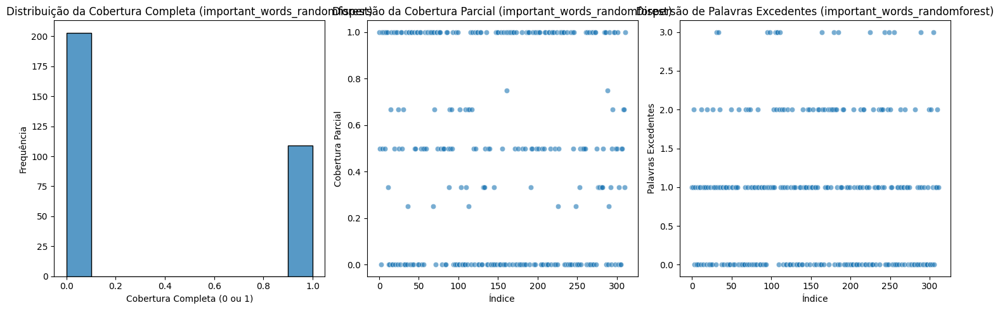

Análise de important_words_randomforest:
Cobertura Completa (Média): 34.94%
Cobertura Parcial (Média): 49.52%
Palavras Excedentes (Média): 0.88




In [105]:
# Outras confs

import pandas as pd
import numpy as np
import nltk
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from gensim.models import Word2Vec, KeyedVectors
from sklearn.utils.class_weight import compute_class_weight

# Configurando NLTK e stop words
nltk.download('punkt')
nltk.download('stopwords')
stop_words = list(stopwords.words('portuguese'))

# Parâmetros de configuração
use_ngrams = False           # Para usar n-grams no TF-IDF
tune_hyperparameters = False # Para realizar tuning de hiperparâmetros
balance_classes = False      # Para balancear classes no RandomForest
refine_word2vec = False      # Para ajustar parâmetros do Word2Vec
expand_semantics = True     # Para realizar expansão semântica

# Expansão Semântica (adicionando sinônimos)
if expand_semantics:
    from nltk.corpus import wordnet as wn
    nltk.download('wordnet')
    synonyms = []
    for word in classificacoes_aceitaveis:
        for syn in wn.synsets(word):
            for lemma in syn.lemmas():
                synonyms.append(lemma.name())
    classificacoes_aceitaveis = list(set(classificacoes_aceitaveis + synonyms))

# Função para extrair características das palavras
def extract_features(tweet, index, tfidf_vectorizer, word2vec_model=None, classification_words=None):
    words = word_tokenize(tweet)
    word = words[index]
    
    # TF-IDF
    tfidf_matrix = tfidf_vectorizer.transform([tweet])
    tfidf_score = tfidf_matrix[0, tfidf_vectorizer.vocabulary_.get(word.lower(), 0)]
    
    # Posição da palavra
    position = index / len(words)
    
    # Comprimento da palavra
    length = len(word)
    
    # Similaridade com as classificações usando Word2Vec
    similarity = 0
    if word2vec_model and classification_words:
        similarities = [
            word2vec_model.wv.similarity(word.lower(), class_word)
            for class_word in classification_words if class_word in word2vec_model.wv and word.lower() in word2vec_model.wv
        ]
        if similarities:  # Verifica se a lista não está vazia
            similarity = max(similarities)
    
    return [tfidf_score, position, length, similarity]

# Vetorizador TF-IDF ajustado ao corpus de treino
ngram_range = (1, 3) if use_ngrams else (1, 1)
tfidf_vectorizer = TfidfVectorizer(stop_words=stop_words, ngram_range=ngram_range)
tfidf_vectorizer.fit(df[df.test == False]['processed_tweet'])

# Treinando um modelo Word2Vec com os tweets de treino
tokenized_tweets = [word_tokenize(tweet) for tweet in df[df.test == False]['processed_tweet']]
vector_size = 200 if refine_word2vec else 100
window_size = 10 if refine_word2vec else 5
word2vec_model = Word2Vec(sentences=tokenized_tweets, vector_size=vector_size, window=window_size, min_count=1, workers=4)

# Preparando os dados de treinamento
features = []
labels = []

for i, row in df[df.test == False].iterrows():
    words = word_tokenize(row['processed_tweet'])
    classification_words = row['classificacoes_clean']
    for index in range(len(words)):
        if words[index].lower() in stop_words:
            continue
        features.append(extract_features(row['processed_tweet'], index, tfidf_vectorizer, word2vec_model, classification_words))
        labels.append(1 if words[index].lower() in classification_words else 0)

features = np.array(features)
labels = np.array(labels)

# Tuning de Hiperparâmetros
if tune_hyperparameters:
    param_grid = {
        'n_estimators': [100, 200, 500],
        'max_depth': [10, 20, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    }
    clf = GridSearchCV(RandomForestClassifier(random_state=42, class_weight='balanced' if balance_classes else None), param_grid, cv=3, n_jobs=-1, verbose=2)
else:
    clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced' if balance_classes else None)

clf.fit(features, labels)

# Função para predizer as palavras mais importantes em um tweet
def predict_important_words(tweet, clf, tfidf_vectorizer, word2vec_model=None, classificacoes_aceitaveis=None, top_n=3):
    words = word_tokenize(tweet)
    features = [extract_features(tweet, index, tfidf_vectorizer, word2vec_model, classificacoes_aceitaveis) for index in range(len(words))]
    predictions = clf.predict_proba(features)[:, 1]  # Probabilidade de ser 'importante'
    
    # Selecionar as palavras com maior probabilidade
    important_words = [words[i] for i in np.argsort(predictions)[-top_n:]]
    
    # Filtrar palavras para que sejam aceitáveis
    important_words = [word for word in important_words if word.lower() in classificacoes_aceitaveis]
    
    return important_words

tweets_only_teste = df[df.test == True].copy()

# Aplicando a função de predição para o DataFrame tweets_only_teste
tweets_only_teste['important_words_randomforest'] = tweets_only_teste.apply(
    lambda row: predict_important_words(
        row['processed_tweet'], clf, tfidf_vectorizer, word2vec_model, classificacoes_aceitaveis
    ), axis=1
)

tweets_only_teste['important_words_randomforest'] = tweets_only_teste['important_words_randomforest'].apply(lambda x: list(set(x)))

# # Exibir o DataFrame com as palavras importantes
display(tweets_only_teste[['processed_tweet', 'classificacoes_clean', 'important_words_randomforest']].head())
display(tweets_only_teste[['processed_tweet', 'classificacoes_clean', 'important_words_randomforest']].tail())


# Definindo as colunas de interesse
colunas_palavras_importantes = [
    'important_words_randomforest'
]

# Executando a análise
resultados = analisar_todas_colunas(tweets_only_teste, colunas_palavras_importantes, 'classificacoes_clean')

# Plotando os resultados
plotar_resultados(resultados)

# Exibindo as métricas globais
for col, metrics in resultados.items():
    print(f"Análise de {col}:")
    print(f"Cobertura Completa (Média): {metrics['cobertura_completa_media'] * 100:.2f}%")
    print(f"Cobertura Parcial (Média): {metrics['cobertura_parcial_media'] * 100:.2f}%")
    print(f"Palavras Excedentes (Média): {metrics['palavras_excedentes_media']:.2f}")
    print("\n")



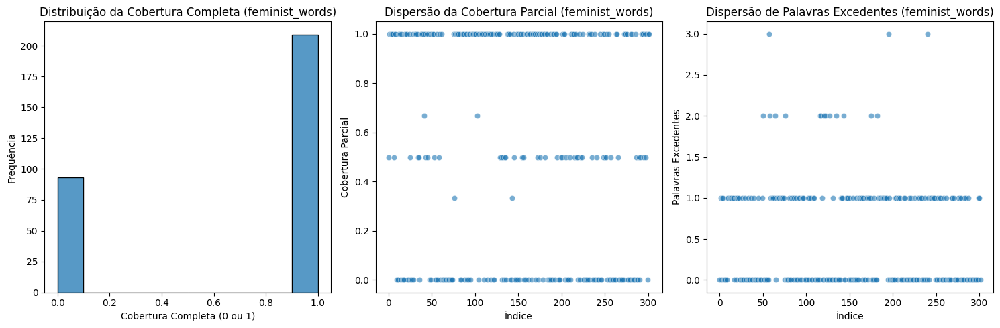

Análise de feminist_words:
Cobertura Completa (Média): 69.21%
Cobertura Parcial (Média): 53.97%
Palavras Excedentes (Média): 0.52




In [110]:
# Definindo as colunas de interesse

tweets_classificados['classificacoes_clean'] = tweets_classificados.classificacoes.fillna('').apply(lambda x: preprocess_tweet(x))

colunas_palavras_importantes = [
    'feminist_words'
]

# Executando a análise
resultados = analisar_todas_colunas(tweets_classificados[tweets_classificados.random == 1], colunas_palavras_importantes, 'classificacoes_clean')

# Plotando os resultados
plotar_resultados(resultados)

# Exibindo as métricas globais
for col, metrics in resultados.items():
    print(f"Análise de {col}:")
    print(f"Cobertura Completa (Média): {metrics['cobertura_completa_media'] * 100:.2f}%")
    print(f"Cobertura Parcial (Média): {metrics['cobertura_parcial_media'] * 100:.2f}%")
    print(f"Palavras Excedentes (Média): {metrics['palavras_excedentes_media']:.2f}")
    print("\n")

Aparentemente, a melhor classificacao possivel ainda é a captura de keywords.

In [115]:
# Isolando as informações necessárias para análise

tweets_classificados[['user_id', 'created_at', 'text', 
                      'feminist_related_keywords_new', 'feminist_words_new',
                      'is_offensive_new', 'offensive_with',
                      'is_compliment_new', 'compliment_for']].fillna('').to_csv('influencers_tweets_to_manual_analysis.csv')

Vamos agora ver o banco de dados final e vamos criar fazer uma última análise manual.

In [3]:
# Final db >> Rodar updates a partir daqui - REVISADO

import pandas as pd
import re
import emoji

tweets_classificados_final = pd.read_csv('influencers_tweets_to_manual_analysis_update.csv').drop(columns = ['Unnamed: 0'])

# add hashtags column
def extract_hashtags(text):
    return re.findall(r'#\w+', text)

# add @'s column
def extract_mentions(text):
    return re.findall(r'@\w+', text)

# add emojis column
def extract_emojis(text):
    return ''.join(list(set(c for c in text if emoji.is_emoji(c))))

# Aplicando as funções para criar novas colunas no DataFrame
tweets_classificados_final['hashtags'] = tweets_classificados_final['text'].apply(extract_hashtags)
tweets_classificados_final['mentions'] = tweets_classificados_final['text'].apply(extract_mentions)
tweets_classificados_final['emojis'] = tweets_classificados_final['text'].apply(extract_emojis)

tweets_classificados_final.head()

,user_id,created_at,text,feminist_related_keywords_new,feminist_words_new,is_offensive_new,offensive_with,is_compliment_new,compliment_for,hashtags,mentions,emojis
0,923283344686813186,2020-10-01T00:13:00.000Z,Biden não passa de uma Dilma que fala inglês. ...,True,['marielle'],0,NaN,0,NaN,[],[],
1,135743827,2020-10-01T00:18:31.000Z,Oi gente! \r\n\r\nHoje é dia de mudar as coisa...,False,[],0,NaN,0,NaN,[],[@indiadeiphone],
2,135743827,2020-10-01T00:19:46.000Z,"Eu, Winnie, vou continuar por aqui mas nos bas...",False,[],0,NaN,0,NaN,[],[],
3,332324517,2020-10-01T00:25:37.000Z,RT @Flamengo: Nosso Time é a Gente em Campo! O...,False,[],0,NaN,0,NaN,[],[@Flamengo],
4,135743827,2020-10-01T00:27:22.000Z,A nossa nova foto de capa é do @GenilsonGuajaj...,False,[],1,NaN,0,NaN,[],[@GenilsonGuajaj1],


In [4]:
# Agora adicionamos detalhes do influencer ao db

# influencers_infos['user_id'] = influencers_infos['id']
# influencers_infos['ideology_assined'] = influencers_infos['classificacao']

# influencers_infos.to_csv('influencers_info_final.csv')
influencers_infos = pd.read_csv('influencers_info_final.csv')

influencers_infos = influencers_infos[['user_id', 'nome_usuario', 'nome', 'pessoa', 
                                       'bio', 'key words', 
                                       'ideology_assined', 'ideology_classification', 'ideology_classification_gen', 
                                       '20210215_seguidores', 'tam_rel_seguidores', 'seguidores_analisados', 
                                       'ponto_ideal', 'estado', 'universidades', 'partido', 
                                       'profissoes', 'genero_str', 'art_prod_str', 
                                       'polit_militan_str', 'jor_com_str', 'jus_str', 'mid_str', 
                                       'part_col_str', 'polic_militar_str', 'prof_str', 'saude_str', 
                                       'ciencia_str', 'emp_str', 'rel_str', 'federal_str', 'estadual_str' 
                                       ]]

df = tweets_classificados_final.merge(influencers_infos,
                                      on='user_id',
                                      how='inner')

df.head()

,user_id,created_at,text,feminist_related_keywords_new,feminist_words_new,is_offensive_new,offensive_with,is_compliment_new,compliment_for,hashtags,...,mid_str,part_col_str,polic_militar_str,prof_str,saude_str,ciencia_str,emp_str,rel_str,federal_str,estadual_str
0,923283344686813186,2020-10-01T00:13:00.000Z,Biden não passa de uma Dilma que fala inglês. ...,True,['marielle'],0,NaN,0,NaN,[],...,Não Mídias,Não Partidos ou Coletivos,Não Policiais ou Militares,"Professores, Intelectuais e Escritores",Não Profissionais da Saúde,Não Cientistas das Exatas e Engenheiros,Não Empresários,Não Líderes Religiosos,Não Federais,Não Estaduais
1,135743827,2020-10-01T00:18:31.000Z,Oi gente! \r\n\r\nHoje é dia de mudar as coisa...,False,[],0,NaN,0,NaN,[],...,Não Mídias,Não Partidos ou Coletivos,Não Policiais ou Militares,"Não Professores, Intelectuais ou Escritores",Não Profissionais da Saúde,Não Cientistas das Exatas e Engenheiros,Empresários,Não Líderes Religiosos,Não Federais,Não Estaduais
2,135743827,2020-10-01T00:19:46.000Z,"Eu, Winnie, vou continuar por aqui mas nos bas...",False,[],0,NaN,0,NaN,[],...,Não Mídias,Não Partidos ou Coletivos,Não Policiais ou Militares,"Não Professores, Intelectuais ou Escritores",Não Profissionais da Saúde,Não Cientistas das Exatas e Engenheiros,Empresários,Não Líderes Religiosos,Não Federais,Não Estaduais
3,332324517,2020-10-01T00:25:37.000Z,RT @Flamengo: Nosso Time é a Gente em Campo! O...,False,[],0,NaN,0,NaN,[],...,Não Mídias,Não Partidos ou Coletivos,Policiais e Militares,"Não Professores, Intelectuais ou Escritores",Não Profissionais da Saúde,Não Cientistas das Exatas e Engenheiros,Não Empresários,Não Líderes Religiosos,Não Federais,Não Estaduais
4,135743827,2020-10-01T00:27:22.000Z,A nossa nova foto de capa é do @GenilsonGuajaj...,False,[],1,NaN,0,NaN,[],...,Não Mídias,Não Partidos ou Coletivos,Não Policiais ou Militares,"Não Professores, Intelectuais ou Escritores",Não Profissionais da Saúde,Não Cientistas das Exatas e Engenheiros,Empresários,Não Líderes Religiosos,Não Federais,Não Estaduais


In [5]:
# last rename

df.columns = ['user_id', 'tweet_created_at', 'tweet_text', 
              'tweet_feminist_related', 'tweet_feminist_words', 
              'tweet_is_offensive', 'tweet_offensive_with',
              'tweet_is_compliment', 'tweet_compliment_for', 
              'tweet_hashtags', 'tweet_mentions', 'tweet_emojis',
              'user_name', 'user_nome', 'user_is_person', 
              'user_bio', 'user_bio_keywords',
              'user_ideology_assined', 'user_ideology_classification', 'user_ideology_classification_gen', 
              'user_20210215_n_followers', 'user_rel_siz_followers', 'user_analised_followers', 
              'user_ideal_point', 'user_state', 'user_university', 
              'user_party', 'user_occupation', 'user_gender', 
              'user_art_prod',
              'user_polit_militan', 'user_jor_com', 'user_jus', 'user_mid',
              'user_part_col', 'user_polic_militar', 'user_prof', 'user_saude',
              'user_ciencia', 'user_emp', 'user_rel', 'user_federal', 'user_estadual']


#### Analise

In [6]:
# influencers_user_names = pd.read_csv('influencers_all_infos.csv').nome_usuario.to_list()
# influencers_infos[(influencers_infos['nome_usuario'].isin(influencers_user_names)) & (influencers_infos['20210215_seguidores'] == influencers_infos['20210215_seguidores'].max())]['nome_usuario']

In [7]:
# Datas

print('Periodo Analisado')
print('Inicio: ', df.tweet_created_at.min())
print('Fim: ', df.tweet_created_at.max())

Periodo Analisado
Inicio:  2020-10-01T00:13:00.000Z
Fim:  2020-12-31T23:41:01.000Z


In [8]:
# usuários por fatia
df.groupby('user_ideology_assined').user_id.nunique()

user_ideology_assined
Antifeminista    42
Feminista        28
Name: user_id, dtype: int64

In [9]:
# usuários por fatia
df.groupby('user_ideology_classification').user_nome.unique()

user_ideology_classification
antifeminista centro      [Onyx Lorenzoni, Partido Social Liberal - PSL,...
antifeminista extrema     [Paulo A. Briguet, Filipe Barros, Alexandre Al...
antifeminista moderada    [Vítor Hugo, Ana Paula Henkel, Leticia Aguiar,...
centro                    [David M. Quinlan, Fernanda Brum, Andre Valada...
feminista extrema         [Bia Ferreira, Sueli Carneiro, Tese Onze, Elza...
feminista moderada        [Paola Carosella, Leci Brandão, Eliane Brum, P...
Name: user_nome, dtype: object

In [10]:
# usuários por fatia (quantidade)
df.groupby('user_ideology_classification').user_nome.nunique()

user_ideology_classification
antifeminista centro       6
antifeminista extrema      3
antifeminista moderada    12
centro                     8
feminista extrema          6
feminista moderada         6
Name: user_nome, dtype: int64

In [11]:
# tweets por fatia
df.groupby('user_ideology_assined').user_id.count()

user_ideology_assined
Antifeminista    5736
Feminista        5154
Name: user_id, dtype: int64

In [12]:
# tweets por fatia
df.groupby('user_ideology_classification').user_id.count()

user_ideology_classification
antifeminista centro       575
antifeminista extrema      520
antifeminista moderada    2177
centro                     714
feminista extrema         1518
feminista moderada        1480
Name: user_id, dtype: int64

#### influenciadores por faixa e comparacao entre faixas


#### Tolerância

In [13]:
# Filtrando apenas os tweets relacionados ao feminismo
df_feminism = df[df['tweet_feminist_related'] == True]

ordem_classificacoes = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Criar um mapeamento de classificações para valores numéricos
classificacao_map = {classificacao: i for i, classificacao in enumerate(ordem_classificacoes)}

# Adicionar uma coluna de "ranking" ao DataFrame com base no mapeamento
df_feminism['ranking'] = df_feminism['user_ideology_classification'].map(classificacao_map)

# Ordenar o DataFrame pela coluna de "ranking"
df_feminism = df_feminism.sort_values(by='ranking').drop(columns=['ranking'])



/tmp/ipykernel_202017/2841690656.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feminism['ranking'] = df_feminism['user_ideology_classification'].map(classificacao_map)


In [14]:
# proporcao de tweets ofensivos/elogiosos

import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Contagem de tweets ofensivos por faixa ideológica
offensive_counts = df_feminism.groupby('user_ideology_classification')['tweet_is_offensive'].sum()

# Contagem total de tweets por faixa ideológica
total_counts = df_feminism.groupby('user_ideology_classification')['tweet_is_offensive'].count()

# Proporção de tweets ofensivos por faixa ideológica
offensive_proportion = round(offensive_counts / total_counts * 100, 2)

# Contagem de tweets elogiosos por faixa ideológica
compliment_counts = df_feminism.groupby('user_ideology_classification')['tweet_is_compliment'].sum()

# Proporção de elogios por faixa ideológica
compliment_proportion = round(compliment_counts / total_counts * 100, 2)

# display(offensive_counts)
# display(offensive_proportion)

# display(compliment_counts)
# display(compliment_proportion)

# Gráfico de linha para porcentagem de tweets ofensivos

# Criando o layout para os gráficos lado a lado
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Lista com a ordem desejada das classificações ideológicas
ordem_classificacoes = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Reorganizando os DataFrames de proporção de acordo com a ordem desejada
offensive_proportion = offensive_proportion.reindex(ordem_classificacoes).fillna(0)
compliment_proportion = compliment_proportion.reindex(ordem_classificacoes).fillna(0)

# Criando o layout para os gráficos lado a lado
fig = make_subplots(rows=1, cols=2, subplot_titles=("Proporção de Tweets Ofensivos", "Proporção de Tweets Elogiosos"))

# Gráfico de linha para porcentagem de tweets ofensivos
fig.add_trace(go.Scatter(
    x=offensive_proportion.index,
    y=offensive_proportion.values,
    mode='lines+markers',
    name='Ofensivo',
    line=dict(color='blue')
), row=1, col=1)

# Gráfico de linha para porcentagem de tweets elogiosos
fig.add_trace(go.Scatter(
    x=compliment_proportion.index,
    y=compliment_proportion.values,
    mode='lines+markers',
    name='Elogios',
    line=dict(color='blue')
), row=1, col=2)

# Atualizando o layout dos gráficos
fig.update_layout(
    title_text="Proporção de Tweets Ofensivos e Elogiosos por Faixa Ideológica",
    template='plotly_white',
    showlegend=False  # Remove a legenda para manter o gráfico mais limpo
)

# Atualizando os títulos dos eixos y para cada subplot
fig.update_yaxes(title_text="Proporção de Tweets Ofensivos (%)", row=1, col=1)
fig.update_yaxes(title_text="Proporção de Tweets Elogiosos (%)", row=1, col=2)

# Atualizando os títulos dos eixos x para cada subplot
fig.update_xaxes(title_text="Faixa Ideológica", tickmode='array', tickvals=ordem_classificacoes, row=1, col=1)
fig.update_xaxes(title_text="Faixa Ideológica", tickmode='array', tickvals=ordem_classificacoes, row=1, col=2)

fig.show()




In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Mapeamento dos rótulos antigos para os novos
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Reindexar os DataFrames com os novos rótulos
offensive_proportion = offensive_proportion.rename(rename_map).reindex(rename_map.values()).fillna(0)
compliment_proportion = compliment_proportion.rename(rename_map).reindex(rename_map.values()).fillna(0)

# Criando o layout para os gráficos lado a lado com maior tamanho
fig = make_subplots(rows=1, cols=2, subplot_titles=("Proporção de Tweets Ofensivos", "Proporção de Tweets Elogiosos"))

# Gráfico de linha para porcentagem de tweets ofensivos com anotações
fig.add_trace(go.Scatter(
    x=offensive_proportion.index,
    y=offensive_proportion.values,
    mode='lines+markers+text',
    name='Ofensivo',
    line=dict(color='blue'),
    text=offensive_proportion.values,  # Valores a serem exibidos
    textposition='top center'  # Posição do texto
), row=1, col=1)

# Gráfico de linha para porcentagem de tweets elogiosos com anotações
fig.add_trace(go.Scatter(
    x=compliment_proportion.index,
    y=compliment_proportion.values,
    mode='lines+markers+text',
    name='Elogios',
    line=dict(color='blue'),
    text=compliment_proportion.values,  # Valores a serem exibidos
    textposition='top center'  # Posição do texto
), row=1, col=2)

# Atualizando o layout dos gráficos
fig.update_layout(
    title_text="Proporção de Tweets Ofensivos e Elogiosos por Faixa de Isolamento",
    template='plotly_white',
    showlegend=False,  # Remove a legenda para manter o gráfico mais limpo
    width=1200,  # Aumentando a largura do gráfico
    height=600   # Aumentando a altura do gráfico
)

# Atualizando os títulos dos eixos y para cada subplot e definindo o intervalo de 0 a 20
fig.update_yaxes(title_text="Proporção de Tweets Ofensivos (%)", range=[0, 20], row=1, col=1)
fig.update_yaxes(title_text="Proporção de Tweets Elogiosos (%)", range=[0, 20], row=1, col=2)

# Atualizando os títulos dos eixos x para cada subplot com novos rótulos
fig.update_xaxes(
    title_text="Faixa de Isolamento", 
    tickmode='array', 
    tickvals=list(rename_map.values()), 
    ticktext=list(rename_map.values()), 
    row=1, col=1
)
fig.update_xaxes(
    title_text="Faixa de Isolamento", 
    tickmode='array', 
    tickvals=list(rename_map.values()), 
    ticktext=list(rename_map.values()), 
    row=1, col=2
)

fig.show()


In [16]:
# proporcao de ofende/elogia

import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filtrar os tweets relacionados ao feminismo
df_feminism = df[df['tweet_feminist_related'] == True]

# Lista com a ordem desejada das classificações ideológicas
ordem_classificacoes = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Contando o número total de usuários únicos por faixa ideológica
total_users = df_feminism.groupby('user_ideology_classification')['user_id'].nunique()

# Contando o número de usuários únicos que fizeram tweets ofensivos por faixa ideológica
offensive_users = df_feminism[df_feminism['tweet_is_offensive'] == 1].groupby('user_ideology_classification')['user_id'].nunique()

# Contando o número de usuários únicos que fizeram tweets elogiosos por faixa ideológica
compliment_users = df_feminism[df_feminism['tweet_is_compliment'] == 1].groupby('user_ideology_classification')['user_id'].nunique()

# Calculando a proporção de usuários ofensivos e elogiosos em relação ao total de usuários
offensive_user_proportion = (offensive_users / total_users * 100).reindex(ordem_classificacoes).fillna(0)
compliment_user_proportion = (compliment_users / total_users * 100).reindex(ordem_classificacoes).fillna(0)

# Criando o layout para os gráficos lado a lado
fig = make_subplots(rows=1, cols=2, subplot_titles=("Proporção de Usuários Ofensivos", "Proporção de Usuários Elogiosos"))

# Gráfico de linha para proporção de usuários ofensivos
fig.add_trace(go.Scatter(
    x=offensive_user_proportion.index,
    y=offensive_user_proportion.values,
    mode='lines+markers',
    name='Usuários Ofensivos',
    line=dict(color='blue')
), row=1, col=1)

# Gráfico de linha para proporção de usuários elogiosos
fig.add_trace(go.Scatter(
    x=compliment_user_proportion.index,
    y=compliment_user_proportion.values,
    mode='lines+markers',
    name='Usuários Elogiosos',
    line=dict(color='blue')
), row=1, col=2)

# Atualizando o layout dos gráficos
fig.update_layout(
    title_text="Proporção de Usuários Ofensivos e Elogiosos por Faixa Ideológica",
    template='plotly_white',
    showlegend=False  # Remove a legenda para manter o gráfico mais limpo
)

# Atualizando os títulos dos eixos y para cada subplot
fig.update_yaxes(title_text="Proporção de Usuários Ofensivos (%)", row=1, col=1)
fig.update_yaxes(title_text="Proporção de Usuários Elogiosos (%)", row=1, col=2)

# Atualizando os títulos dos eixos x para cada subplot
fig.update_xaxes(title_text="Faixa Ideológica", tickmode='array', tickvals=ordem_classificacoes, row=1, col=1)
fig.update_xaxes(title_text="Faixa Ideológica", tickmode='array', tickvals=ordem_classificacoes, row=1, col=2)

fig.show()


In [17]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Mapeamento dos rótulos antigos para os novos
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Filtrar os tweets relacionados ao feminismo
df_feminism = df[df['tweet_feminist_related'] == True]

# Lista com a ordem desejada das classificações ideológicas (ou de segmentação)
ordem_classificacoes = list(rename_map.keys())

# Contando o número total de usuários únicos por faixa de segmentação
total_users = df_feminism.groupby('user_ideology_classification')['user_id'].nunique().reindex(ordem_classificacoes).fillna(0).rename(rename_map)

# Contando o número de usuários únicos que fizeram tweets ofensivos por faixa de segmentação
offensive_users = df_feminism[df_feminism['tweet_is_offensive'] == 1].groupby('user_ideology_classification')['user_id'].nunique()

# Contando o número de usuários únicos que fizeram tweets elogiosos por faixa de segmentação
compliment_users = df_feminism[df_feminism['tweet_is_compliment'] == 1].groupby('user_ideology_classification')['user_id'].nunique()

# Calculando a proporção de usuários ofensivos e elogiosos em relação ao total de usuários
offensive_user_proportion = (round(offensive_users, 2)).reindex(ordem_classificacoes).fillna(0).rename(rename_map)
compliment_user_proportion = (round(compliment_users, 2)).reindex(ordem_classificacoes).fillna(0).rename(rename_map)

# Criando o layout para os gráficos lado a lado
fig = make_subplots(rows=1, cols=2, subplot_titles=("Proporção de Usuários Ofensivos", "Proporção de Usuários Elogiosos"))

# Adicionando o gráfico de barras para a quantidade total de usuários únicos no gráfico de usuários ofensivos
fig.add_trace(go.Bar(
    x=total_users.index,
    y=total_users.values,
    name='Total de Usuários Estudados',
    marker=dict(color='lightgray'),
    text=total_users.values,  # Exibir os valores nas barras
    textposition='outside',  # Posição automática do texto
), row=1, col=1)

# Adicionando o gráfico de linha para proporção de usuários ofensivos com anotações
fig.add_trace(go.Scatter(
    x=offensive_user_proportion.index,
    y=offensive_user_proportion.values,
    mode='lines+markers+text',
    name='Usuários Ofensivos',
    line=dict(color='blue'),
    text=offensive_user_proportion.values,  # Valores a serem exibidos
    textposition='top center'  # Posição do texto
), row=1, col=1)

# Adicionando o gráfico de barras para a quantidade total de usuários únicos no gráfico de usuários elogiosos
fig.add_trace(go.Bar(
    x=total_users.index,
    y=total_users.values,
    name='Total de Usuários Estudados',
    marker=dict(color='lightgray'),
    text=total_users.values,  # Exibir os valores nas barras
    textposition='outside',  # Posição automática do texto
), row=1, col=2)

# Adicionando o gráfico de linha para proporção de usuários elogiosos com anotações
fig.add_trace(go.Scatter(
    x=compliment_user_proportion.index,
    y=compliment_user_proportion.values,
    mode='lines+markers+text',
    name='Usuários Elogiosos',
    line=dict(color='blue'),
    text=compliment_user_proportion.values,  # Valores a serem exibidos
    textposition='top center'  # Posição do texto
), row=1, col=2)

# Atualizando o layout dos gráficos
fig.update_layout(
    title_text="Quantidade de Usuários Ofensivos e Elogiosos por Faixa de Segmentação",
    template='plotly_white',
    showlegend=False,  # Remove a legenda para manter o gráfico mais limpo
    width=1200,  # Aumentando a largura do gráfico
    height=600,  # Aumentando a altura do gráfico
    barmode='overlay'  # Sobrepondo as barras e as linhas
)

# Atualizando os títulos dos eixos y para cada subplot e definindo o intervalo de 0 a 10
fig.update_yaxes(title_text="Quantidade de Usuários Ofensivos", range=[-1, 15], row=1, col=1)
fig.update_yaxes(title_text="Quantidade de Usuários Elogiosos", range=[-1, 15], row=1, col=2)

# Atualizando os títulos dos eixos x para cada subplot
fig.update_xaxes(
    title_text="Faixa de Segmentação", 
    tickmode='array', 
    tickvals=list(rename_map.values()), 
    ticktext=list(rename_map.values()), 
    row=1, col=1
)
fig.update_xaxes(
    title_text="Faixa de Segmentação", 
    tickmode='array', 
    tickvals=list(rename_map.values()), 
    ticktext=list(rename_map.values()), 
    row=1, col=2
)

fig.show()


In [18]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Mapeamento dos rótulos antigos para os novos
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Lista com a ordem desejada das classificações ideológicas (ou de segmentação)
ordem_classificacoes = list(rename_map.keys())

# Contando o número total de tweets por faixa de segmentação
total_tweets = df.groupby('user_ideology_classification')['tweet_text'].count()

# Contando o número de tweets feministas por faixa de segmentação
feminist_tweets = df[df['tweet_feminist_related'] == True].groupby('user_ideology_classification')['tweet_text'].count()

# Calculando a proporção de tweets feministas em relação ao total de tweets
feminist_tweet_proportion = (round(feminist_tweets / total_tweets * 100, 2)).reindex(ordem_classificacoes).fillna(0).rename(rename_map)

# Criando o gráfico de proporção de tweets feministas
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=feminist_tweet_proportion.index,
    y=feminist_tweet_proportion.values,
    mode='lines+markers+text',
    name='Tweets Feministas',
    line=dict(color='blue'),
    text=feminist_tweet_proportion.values,  # Valores a serem exibidos
    textposition='top center'  # Posição do texto
))

# Atualizando o layout do gráfico
fig.update_layout(
    title_text="Proporção de Tweets de Interesse por Faixa de Segmentação",
    template='plotly_white',
    width=1000,  # Largura do gráfico
    height=500,  # Altura do gráfico
    showlegend=False  # Remove a legenda para manter o gráfico mais limpo
)

# Atualizando os títulos dos eixos
fig.update_yaxes(title_text="Proporção de Tweets de Interesse (%)", range=[0, 100])
fig.update_xaxes(
    title_text="Faixa de Segmentação", 
    tickmode='array', 
    tickvals=list(rename_map.values()), 
    ticktext=list(rename_map.values())
)

fig.show()


In [19]:
# total de influencers

true_inf = pd.read_csv('influencers_pontos_ideais_all_info.csv')
true_inf = true_inf.merge(influencers_infos,
               on='nome_usuario',
               how='inner').groupby('ideology_classification').nome_usuario.count()

import pandas as pd
import plotly.graph_objects as go

# Mapeamento dos rótulos antigos para os novos
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Renomeando as classificações ideológicas
true_inf_renamed = true_inf.rename(rename_map)

# Criando a lista com a ordem desejada das classificações ideológicas (ou de segmentação)
ordem_classificacoes = list(rename_map.values())

# Reindexando para garantir a ordem correta
true_inf_ordered = true_inf_renamed.reindex(ordem_classificacoes).fillna(0)

# Criando o gráfico de barras
fig = go.Figure()

fig.add_trace(go.Bar(
    x=true_inf_ordered.index,
    y=true_inf_ordered.values,
    name='Total de Influenciadores',
    text=true_inf_ordered.values,  # Exibir os valores nas barras
    textposition='auto',  # Posição automática do texto
    marker=dict(color='blue')
))

# Atualizando o layout do gráfico
fig.update_layout(
    title_text="Total de Influenciadores por Faixa de Segmentação",
    template='plotly_white',
    width=1000,  # Largura do gráfico
    height=500,  # Altura do gráfico
    showlegend=False  # Remove a legenda para manter o gráfico mais limpo
)

# Atualizando os títulos dos eixos
fig.update_yaxes(title_text="Número de Influenciadores")
fig.update_xaxes(
    title_text="Faixa de Segmentação", 
    tickmode='array', 
    tickvals=list(rename_map.values()), 
    ticktext=list(rename_map.values())
)

fig.show()


In [20]:
df_feminism.groupby('user_ideology_classification')['tweet_text'].nunique().rename(rename_map).reindex(ordem_classificacoes).fillna(0)

user_ideology_classification
ext. isol. cluster feminista        244.0
mod. isol. cluster feminista        359.0
pou. isol. cluster feminista          0.0
não isolado                           6.0
pou. isol. cluster antifeminista     24.0
mod. isol. cluster antifeminista     81.0
ext. isol. cluster antifeminista     14.0
Name: tweet_text, dtype: float64

In [21]:
import pandas as pd
import plotly.graph_objects as go

# Mapeamento dos rótulos antigos para os novos
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Total tweets
true_inf = df_feminism.groupby('user_ideology_classification')['tweet_text'].nunique().rename(rename_map).reindex(ordem_classificacoes).fillna(0)

# Lista com a ordem desejada das classificações ideológicas (ou de segmentação)
ordem_classificacoes = list(rename_map.values())

# Reindexando para garantir a ordem correta
total_influencers = true_inf.reindex(ordem_classificacoes).fillna(0)

# Contando o número total de tweets ofensivos e elogiosos
total_ofensivos = df_feminism[df_feminism['tweet_is_offensive'] == True].groupby('user_ideology_classification')['user_id'].nunique().rename(rename_map).reindex(ordem_classificacoes).fillna(0)
total_elogiosos = df_feminism[df_feminism['tweet_is_compliment'] == True].groupby('user_ideology_classification')['user_id'].nunique().rename(rename_map).reindex(ordem_classificacoes).fillna(0)

# Criando o gráfico combinado de barras e linha
fig = go.Figure()

# Adicionando o gráfico de barras para o total de tweets no eixo y primário (padrão)
fig.add_trace(go.Bar(
    x=total_influencers.index,
    y=total_influencers.values,
    name='Total de Tweets',
    text=total_influencers.values,  # Exibir os valores nas barras
    textposition='auto',  # Posição automática do texto
    marker=dict(color='blue')
))

# Adicionando o gráfico de linha para tweets ofensivos no eixo y secundário
fig.add_trace(go.Scatter(
    x=total_ofensivos.index,
    y=total_ofensivos.values,
    mode='lines+markers+text',
    name='Tweets Ofensivos',
    line=dict(color='orange'),
    text=total_ofensivos.values,  # Valores a serem exibidos
    textposition='bottom center',  # Posição do texto
    textfont=dict(color='darkgoldenrod'),
    yaxis='y2'  # Usar o segundo eixo y
))

# Adicionando o gráfico de linha para tweets elogiosos no eixo y secundário
fig.add_trace(go.Scatter(
    x=total_elogiosos.index,
    y=total_elogiosos.values,
    mode='lines+markers+text',
    name='Tweets Elogiosos',
    line=dict(color='green'),
    text=total_elogiosos.values,  # Valores a serem exibidos
    textposition='bottom center',  # Posição do texto
    textfont=dict(color='darkgoldenrod'),
    yaxis='y2'  # Usar o segundo eixo y
))

# Atualizando o layout do gráfico
fig.update_layout(
    title_text="Total de Tweets x Tweets Analisados por Faixa de Segmentação",
    template='plotly_white',
    width=1200,  # Largura do gráfico
    height=500,  # Altura do gráfico
    showlegend=True,  # Exibir a legenda
    legend=dict(
        x=1.05,  # Move a legenda para a direita
        y=1,  # Alinha a legenda ao topo
        xanchor='left',  # Âncora da legenda na parte esquerda
        yanchor='top',  # Âncora da legenda na parte superior
    ),
    yaxis=dict(title="Total de Tweets"),  # Eixo y primário para as barras
    yaxis2=dict(title="Quantidade de Tweets Ofensivos/Elogiosos", overlaying='y', side='right', range=[0, max(max(total_ofensivos.values), max(total_elogiosos.values)) + 2])  # Eixo y secundário para as linhas
)

# Atualizando os títulos dos eixos x
fig.update_xaxes(
    title_text="Faixa de Segmentação", 
    tickmode='array', 
    tickvals=list(rename_map.values()), 
    ticktext=list(rename_map.values())
)

fig.show()


In [22]:
import pandas as pd
import plotly.graph_objects as go

# Mapeamento dos rótulos antigos para os novos
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Carregando o dataframe `true_inf` e aplicando o mapeamento
true_inf = pd.read_csv('influencers_pontos_ideais_all_info.csv')
true_inf = true_inf.merge(influencers_infos, on='nome_usuario', how='inner').groupby('ideology_classification').nome_usuario.count().rename(rename_map)

# Lista com a ordem desejada das classificações ideológicas (ou de segmentação)
ordem_classificacoes = list(rename_map.values())

# Reindexando para garantir a ordem correta
total_influencers = true_inf.reindex(ordem_classificacoes).fillna(0)

# Contando o número total de usuários únicos que criam ou compartilham tweets de interesse
total_users = df_feminism.groupby('user_ideology_classification')['user_id'].nunique().rename(rename_map).reindex(ordem_classificacoes).fillna(0).rename(rename_map)

# Criando o gráfico combinado de barras e linha
fig = go.Figure()

# Adicionando o gráfico de barras para o total de influenciadores
fig.add_trace(go.Bar(
    x=total_influencers.index,
    y=total_influencers.values,
    name='Total de Influenciadores',
    text=total_influencers.values,  # Exibir os valores nas barras
    textposition='auto',  # Posição automática do texto
    marker=dict(color='blue')
))

# Adicionando o gráfico de linha para influenciadores que criam ou compartilham tweets de interesse
fig.add_trace(go.Scatter(
    x=total_users.index,
    y=total_users.values,
    mode='lines+markers+text',
    name='Influenciadores Analisados',
    line=dict(color='orange'),
    text=total_users.values,  # Valores a serem exibidos
    textposition='bottom center',  # Posição do texto
    textfont=dict(color='darkgoldenrod')
))

# Atualizando o layout do gráfico
fig.update_layout(
    title_text="Total de Influenciadores x Influenciadores Analisados por Faixa de Segmentação",
    template='plotly_white',
    width=1000,  # Largura do gráfico
    height=500,  # Altura do gráfico
    showlegend=True  # Exibir a legenda
)

# Atualizando os títulos dos eixos
fig.update_yaxes(title_text="Quantidade de Influenciadores")
fig.update_xaxes(
    title_text="Faixa de Segmentação", 
    tickmode='array', 
    tickvals=list(rename_map.values()), 
    ticktext=list(rename_map.values())
)

fig.show()


In [23]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Mapeamento dos rótulos antigos para os novos
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Filtrar os tweets relacionados ao feminismo
df_feminism = df[df['tweet_feminist_related'] == True]

# Lista com a ordem desejada das classificações ideológicas
ordem_classificacoes = list(rename_map.keys())

# Função para contar os alvos de ofensa ou elogio
def contar_alvos(series):
    return series.dropna().str.split(',').explode().value_counts()

# Contagem de alvos de ofensas por faixa ideológica
ofensas_totais = df_feminism.groupby('user_ideology_classification')['tweet_offensive_with'].apply(contar_alvos)

# Contagem de alvos de elogios por faixa ideológica
elogios_totais = df_feminism.groupby('user_ideology_classification')['tweet_compliment_for'].apply(
    lambda x: x.dropna().str.split(',').explode().str.split().explode().value_counts()
)

# Total de tweets ofensivos e elogiosos por faixa ideológica
total_ofensivos_por_faixa = df_feminism[df_feminism['tweet_is_offensive'] == 1].groupby('user_ideology_classification')['tweet_text'].count()
total_elogios_por_faixa = df_feminism[df_feminism['tweet_is_compliment'] == 1].groupby('user_ideology_classification')['tweet_text'].count()

# Calculando a proporção de cada alvo em relação ao total de tweets ofensivos por faixa
ofensas_proporcao = ofensas_totais.div(total_ofensivos_por_faixa, level='user_ideology_classification').unstack(fill_value=0)

# Calculando a proporção de cada alvo em relação ao total de tweets elogiosos por faixa
elogios_proporcao = elogios_totais.div(total_elogios_por_faixa, level='user_ideology_classification').unstack(fill_value=0)

# Selecionando os 10 principais alvos de ofensas para visualização
top_ofensas = ofensas_proporcao.sum().sort_values(ascending=False).head(10).index
ofensas_alvos_top = ofensas_proporcao[top_ofensas].reindex(ordem_classificacoes).rename(index=rename_map)

# Selecionando os 10 principais alvos de elogios para visualização
top_elogios = elogios_proporcao.sum().sort_values(ascending=False).head(10).index
elogios_alvos_top = elogios_proporcao[top_elogios].reindex(ordem_classificacoes).rename(index=rename_map)

# Criando o layout para os gráficos lado a lado
fig = make_subplots(rows=1, cols=2, subplot_titles=("Proporção de Alvos de Ofensas por Faixa de Segmentação", "Proporção de Alvos de Elogios por Faixa de Segmentação"))

# Gráfico de barras para proporção de alvos de ofensas
for coluna in ofensas_alvos_top.columns:
    fig.add_trace(go.Bar(
        x=ofensas_alvos_top.index,
        y=ofensas_alvos_top[coluna]*100,
        name=coluna
    ), row=1, col=1)

# Gráfico de barras para proporção de alvos de elogios
for coluna in elogios_alvos_top.columns:
    fig.add_trace(go.Bar(
        x=elogios_alvos_top.index,
        y=elogios_alvos_top[coluna]*100,
        name=coluna
    ), row=1, col=2)

# Atualizando o layout dos gráficos
fig.update_layout(
    title_text="Análise dos Alvos de Ofensas e Elogios por Faixa de Segmentação",
    template='plotly_white',
    showlegend=True,
    barmode='group',
    width=1200,  # Ajusta a largura para acomodar os gráficos lado a lado
    height=600   # Ajusta a altura do gráfico
)

# Atualizando os títulos dos eixos y
fig.update_yaxes(title_text="Proporção de Ofensas (%)", row=1, col=1)
fig.update_yaxes(title_text="Proporção de Elogios (%)", row=1, col=2)

# Atualizando os títulos dos eixos x e reordenando as faixas de segmentação
fig.update_xaxes(title_text="Faixa de Segmentação", tickmode='array', tickvals=list(rename_map.values()), categoryorder="array", categoryarray=list(rename_map.values()), row=1, col=1)
fig.update_xaxes(title_text="Faixa de Segmentação", tickmode='array', tickvals=list(rename_map.values()), categoryorder="array", categoryarray=list(rename_map.values()), row=1, col=2)

# Exibindo os gráficos
fig.show()


In [24]:
df_feminism[(df_feminism.tweet_is_compliment == True) & (df_feminism.tweet_compliment_for == 'mulher')]['tweet_text'][3891]

'Há nove décadas, as mulheres conquistaram o direito ao voto em nosso país e são parte fundamental para o desenvolvimento de nossa nação. Parabéns a todas vocês.\r\n\r\n#DireitodeVotodaMulher\r\n#aVozdeMinasnoSenado https://t.co/TRadKqNVhq'

In [25]:
df_feminism.groupby('user_ideology_classification')['tweet_text'].nunique().reindex(ordem_classificacoes).fillna(0)

user_ideology_classification
feminista extrema         244.0
feminista moderada        359.0
feminista centro            0.0
centro                      6.0
antifeminista centro       24.0
antifeminista moderada     81.0
antifeminista extrema      14.0
Name: tweet_text, dtype: float64

In [26]:
df_feminism[(df_feminism['tweet_is_offensive'] == True) & (~df_feminism.user_ideology_classification.isna())].tweet_text.nunique() + df_feminism[(df_feminism['tweet_is_compliment'] == True) & (~df_feminism.user_ideology_classification.isna())].tweet_text.nunique()

30

In [27]:
df_feminism = df_feminism[~df_feminism.user_ideology_classification.isna()]

[nltk_data] Downloading package wordnet to /home/mindera/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/mindera/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/tmp/ipykernel_202017/3185835763.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



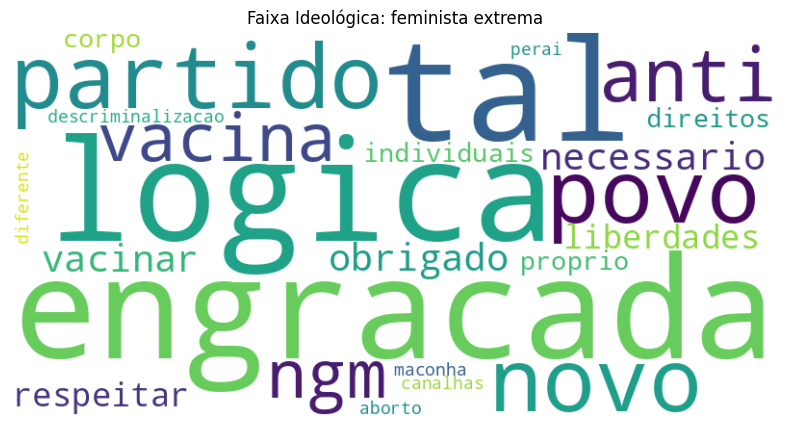

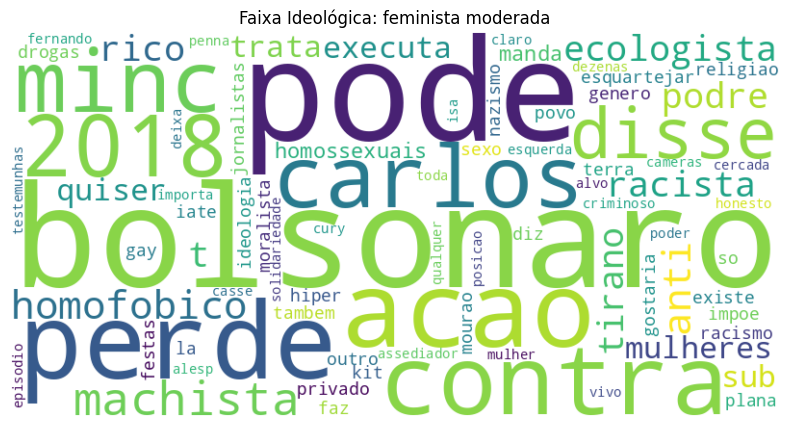

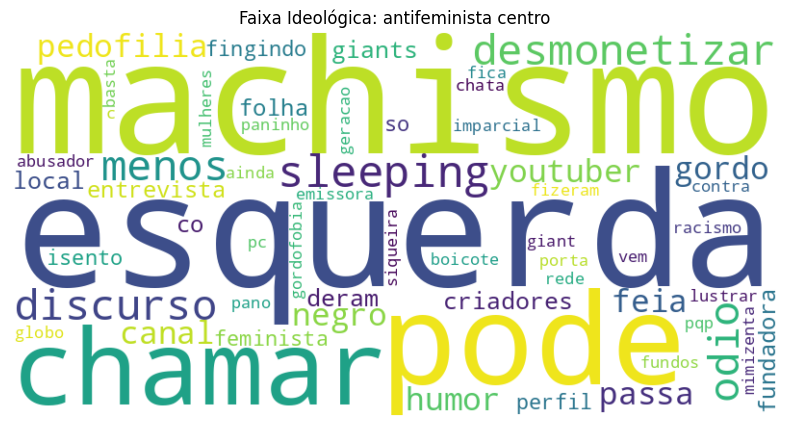

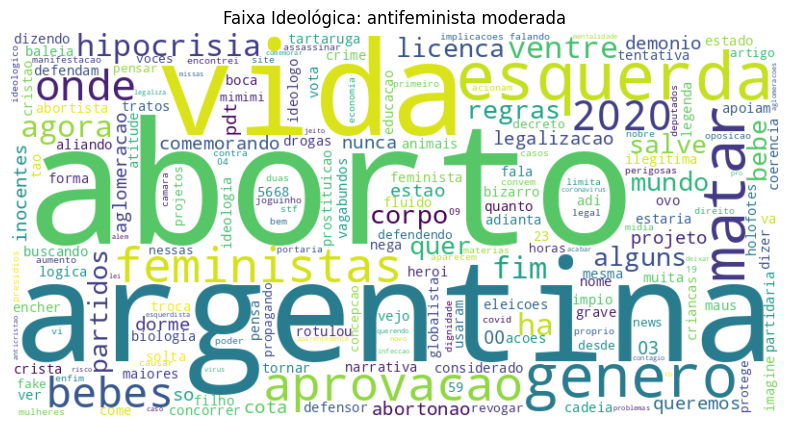

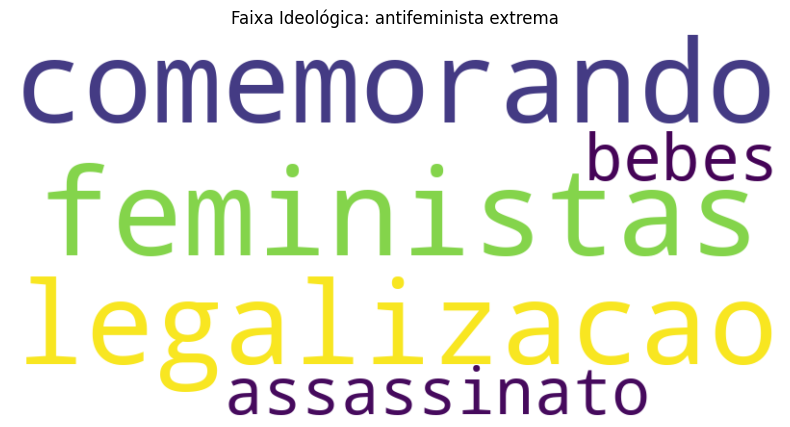

In [28]:
# word cloud

import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud

import re
import unidecode
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')
from nltk.corpus import stopwords

# Filtrar os tweets relacionados ao feminismo que são ofensivos
df_offensive = df_feminism[df_feminism['tweet_is_offensive'] == 1]

# Inicializa os recursos de NLP
stop_words_add = ['sobre', 'gente', 'aqui', 'hoje', 'voce', 'vc', 'ne', 
                  'pessoas', 'pra', 'ai', 'bom', 'fazer', 'dia', 
                  'ano', 'vai', 'nada', 'ter', 'vou', 'ate', 'ta', 
                  'ja', 'pq', 'assim', 'nao', 'tudo', 'sao', 'acho', 'tbm', 'sei',
                  "de", "a", "o", "e", "do", "da", "em", "um", "para", "com", "é", 
                  "não", "que", "por", "na", "os", "no", "se", "as", "dos", "como", 
                  "mas", "foi", "ao", "isso", "me", "uma", "ele"]
stop_words = set(stopwords.words('portuguese') + stop_words_add)

# Preprocessamento
def preprocess_tweet(tweet):
    tweet = re.sub(r'\bk+\b', '', tweet)
    tweet = re.sub(r'\bhaha+\b', '', tweet)
    tweet = re.sub(r'\s+', ' ', tweet).strip()
    tweet = re.sub(r'http\S+|@\S+|RT', '', tweet)
    tweet = re.sub(r'\W', ' ', tweet)
    tweet = tweet.lower()
    tweet = unidecode.unidecode(tweet)
    tokens = [word for word in tweet.split() if word not in stop_words]
    return ' '.join(tokens)

df_offensive['processed_tweet'] = df_offensive['tweet_text'].astype(str).apply(preprocess_tweet)

# Contar as palavras mais comuns por faixa ideológica
def contar_palavras(series):
    words = series.str.cat(sep=' ').split()
    return words

# Aplicar a contagem de palavras por faixa ideológica
palavras_comuns_por_faixa = df_offensive.groupby('user_ideology_classification')['processed_tweet'].apply(contar_palavras)
palavras_comuns_por_faixa = {key: Counter(value) for key, value in palavras_comuns_por_faixa.items()}

# Definindo a ordem desejada das faixas ideológicas
ordem_faixas = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Gerar e exibir as nuvens de palavras na ordem especificada
for faixa in ordem_faixas:
    if faixa in palavras_comuns_por_faixa:
        palavras = palavras_comuns_por_faixa[faixa]
        if palavras:  # Gera a nuvem de palavras apenas se houver palavras na faixa
            wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(palavras)
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation="bilinear")
            plt.axis("off")
            plt.title(f"Faixa Ideológica: {faixa}")
            plt.show()


In [29]:
# textos

pd.set_option('display.max_colwidth', None)

ordem_faixas = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

df_offensive = df_offensive[~df_offensive.user_ideology_classification.isna()]

df_offensive['ideology_classification'] = pd.Categorical(
    df_offensive['user_ideology_classification'], 
    categories=ordem_faixas, 
    ordered=True
)

df_offensive_sorted = df_offensive.sort_values(by='ideology_classification')

df_offensive_sorted[['processed_tweet', 'user_ideology_classification']]

,processed_tweet,user_ideology_classification
1970,engracada logica tal partido novo povo anti vacina ngm obrigado vacinar necessario respeitar liberdades individuais direitos proprio corpo descriminalizacao aborto maconha perai diferente canalhas,feminista extrema
268,bolsonaro perde acao contra carlos minc 2018 disse machista homofobico anti ecologista racista t,feminista moderada
599,tirano podre rico pode quiser trata mulheres sub executa homossexuais manda esquartejar jornalistas impoe religiao hiper moralista povo faz festas sexo drogas iate privado outro tambem gostaria,feminista moderada
6432,existe racismo terra plana diz mourao la so ideologia genero kit gay nazismo esquerda bolsonaro honesto,feminista moderada
9492,episodio criminoso deixa claro qualquer mulher pode alvo importa posicao poder cercada dezenas testemunhas cameras vivo toda solidariedade isa penna alesp casse assediador fernando cury,feminista moderada
9828,pode chamar negro negro racismo pode chamar gordo gordo gordofobia pode chamar feia feia machismo pqp geracao chata mimizenta c,antifeminista centro
9117,desmonetizar discurso odio menos pedofilia youtuber machismo canal humor,antifeminista centro
8990,criadores sleeping giants local deram entrevista folha co fundadora feminista so perfil esquerda fingindo isento imparcial fizeram boicote contra pc siqueira porta fundos rede globo,antifeminista centro
9116,desmonetizar discurso odio menos pedofilia youtuber machismo canal humor emissora passa pano abusador mulheres basta esquerda vem esquerda giant fica sleeping ainda passa paninho lustrar,antifeminista centro
110,imagine mundo onde defendam vida bebes mesma forma ovo tartaruga onde matar criancas considerado crime tao grave quanto maus tratos animais logica abortista heroi salve baleia salve bebe va cadeia,antifeminista moderada


#### Opiniões

In [30]:
# quem fala sobre feminismo?

# Filtrar os tweets relacionados ao feminismo
df_feminism = df[df['tweet_feminist_related'] == True]

# Contagem total de tweets por faixa ideológica
total_tweets_by_ideology = df.groupby('user_ideology_classification').size()

# Contagem de tweets feministas por faixa ideológica
feminist_tweets_by_ideology = df_feminism.groupby('user_ideology_classification').size()

# Calcular a porcentagem de tweets feministas por faixa ideológica
percentage_feminist_tweets = round((feminist_tweets_by_ideology / total_tweets_by_ideology) * 100, 2)

# Exibir o resultado
percentage_feminist_tweets = percentage_feminist_tweets.sort_index()
percentage_feminist_tweets


user_ideology_classification
antifeminista centro       4.17
antifeminista extrema      2.69
antifeminista moderada     3.72
centro                     0.84
feminista extrema         16.07
feminista moderada        24.32
dtype: float64

#### Opiniões

In [31]:
# opinioes

from collections import Counter
import ast

# Extrair e contar palavras relacionadas ao feminismo por faixa ideológica
def count_feminist_words(group):
    words = Counter()
    for words_list in group['tweet_feminist_words'].dropna():
        words.update(ast.literal_eval(words_list))
    return words

feminist_words_by_ideology = df_feminism.groupby('user_ideology_classification').apply(count_feminist_words)


/tmp/ipykernel_202017/321841783.py:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [32]:
# Top topicos feministas

from collections import Counter
import ast
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Extrair e contar palavras relacionadas ao feminismo por faixa ideológica
def count_feminist_words(group):
    words = Counter()
    for words_list in group['tweet_feminist_words'].dropna():
        words.update(ast.literal_eval(words_list))
    return words

# Obter a contagem das palavras por faixa ideológica
feminist_words_by_ideology = df_feminism.groupby('user_ideology_classification').apply(count_feminist_words)

# Transformar a contagem em um formato que possa ser usado para visualização
common_words = {ideology: counts.most_common(8) for ideology, counts in feminist_words_by_ideology.items()}

# Transformar o dicionário em um DataFrame
rows = []
for ideology, words in common_words.items():
    for word, freq in words:
        rows.append({'ideology': ideology, 'word': word, 'frequency': freq})

df_visualization = pd.DataFrame(rows)

# Definir a ordem das ideologias (da mais feminista para a mais antifeminista)
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    # 'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Reordenar o DataFrame de visualização com base nessa ordem
df_visualization['ideology'] = pd.Categorical(df_visualization['ideology'], categories=ordered_ideologies, ordered=True)
df_visualization = df_visualization.sort_values('ideology')

# Criar subplots com 3 colunas e ajustar o número de linhas dinamicamente
num_ideologies = len(ordered_ideologies)
rows = (num_ideologies // 3) + (1 if num_ideologies % 3 != 0 else 0)

fig = make_subplots(rows=rows, cols=3, subplot_titles=ordered_ideologies, vertical_spacing=0.3)

# Adicionar um lollipop chart para cada ideologia, ordenando as palavras por frequência decrescente
for i, ideology in enumerate(ordered_ideologies):
    subset = df_visualization[df_visualization['ideology'] == ideology].sort_values(by='frequency', ascending=False)
    row = i // 3 + 1
    col = i % 3 + 1
    fig.add_trace(
        go.Scatter(x=subset['word'], y=subset['frequency'],
                   mode='markers+lines',
                   line=dict(color='gray', width=1),
                   marker=dict(color='blue', size=8),
                   name=ideology),
        row=row, col=col
    )

# Atualizar layout do gráfico e definir limites dos eixos Y
fig.update_layout(
    height=rows * 300, width=1200,
    title_text="Top 5 Palavras por Faixa Ideológica",
    showlegend=False
)

# Definir os limites dos eixos Y para todos os subplots
fig.update_yaxes(range=[-1, 160], title_text="Frequência")
fig.update_xaxes(title_text="Palavras")

# Mostrar o gráfico
fig.show()


/tmp/ipykernel_202017/316437241.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



/tmp/ipykernel_202017/1310813059.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_202017/1310813059.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



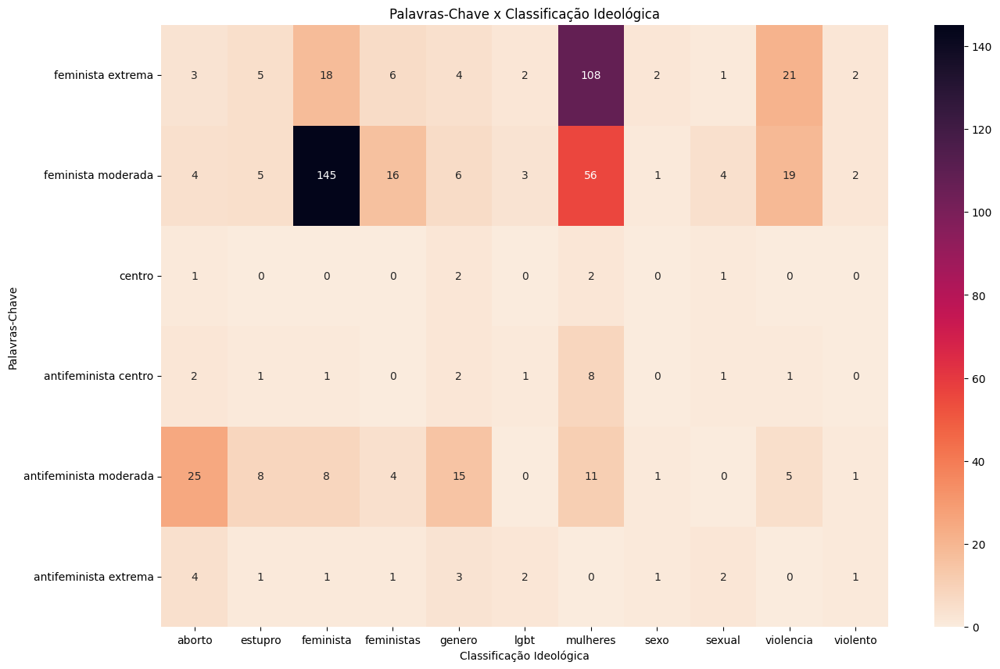

In [33]:
# Contagem de palavras

from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Ordem das ideologias
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    # 'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

df_feminism['tweet_text_clean'] = df_feminism.tweet_text.apply(preprocess_tweet)
df_feminism['tweet_feminist_words_clean'] = df_feminism['tweet_feminist_words'].astype(str).str.replace('[', '').str.replace(']', '').str.replace("'", '').str.replace(',', '')

# Passo 1: Vetorizar as palavras-chave
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df_feminism['tweet_feminist_words_clean'].fillna(''))

# Passo 2: Criar um DataFrame das palavras-chave com as ideologias como índice
keywords_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out(), index=df_feminism['user_ideology_classification'])

# Passo 3: Agrupar as frequências das palavras-chave por ideologia
keywords_by_ideology = keywords_df.groupby('user_ideology_classification').sum()

# Passo 4: Reordenar o DataFrame de acordo com a ordem das ideologias
keywords_by_ideology = keywords_by_ideology.reindex(ordered_ideologies)

# Passo 5: Filtrar palavras-chave que aparecem em pelo menos um determinado número de registros
min_occurrence = 4
keywords_filtered = keywords_by_ideology.loc[:, (keywords_by_ideology > 0).sum(axis=0) >= min_occurrence]

# Verificar se a matriz não está vazia antes de criar o heatmap
if not keywords_filtered.empty:
    # Passo 6: Criar um heatmap para visualizar a distribuição das palavras-chave por ideologia
    plt.figure(figsize=(15, 10))
    sns.heatmap(keywords_filtered, cmap="rocket_r", annot=True, fmt="d")
    plt.title("Palavras-Chave x Classificação Ideológica")
    plt.xlabel("Classificação Ideológica")
    plt.ylabel("Palavras-Chave")
    plt.show()
else:
    print("Nenhuma palavra-chave suficiente para criar o heatmap após a filtragem.")


/tmp/ipykernel_202017/1634131612.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_202017/1634131612.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



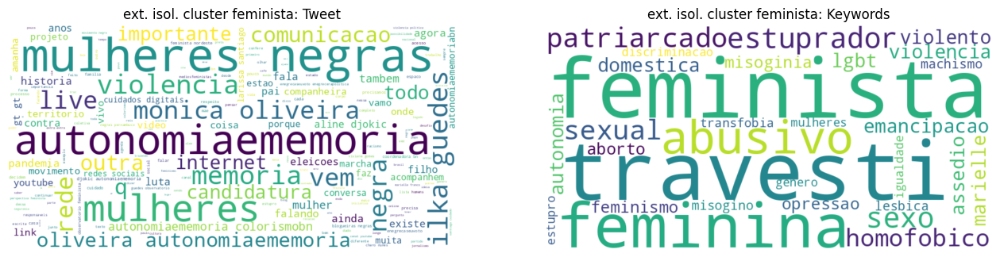

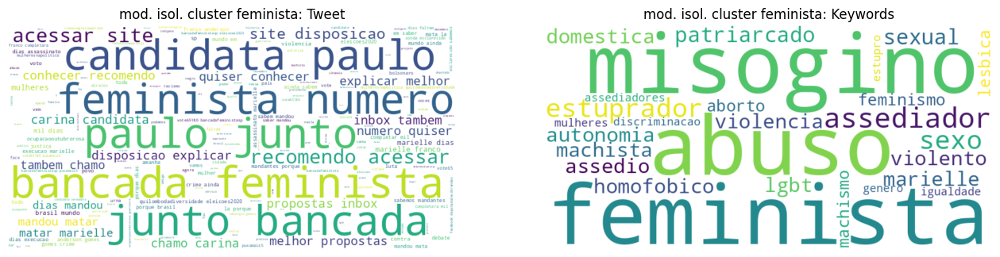

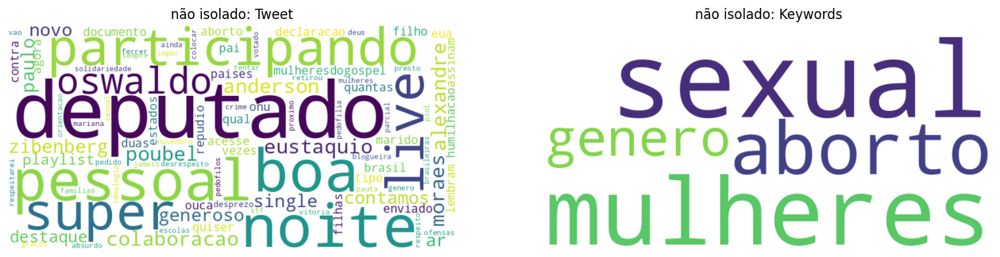

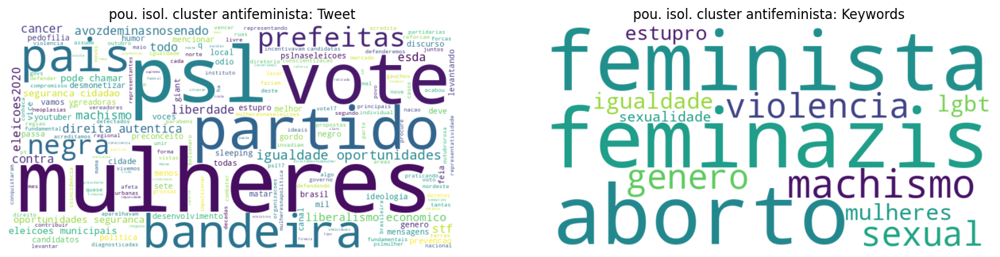

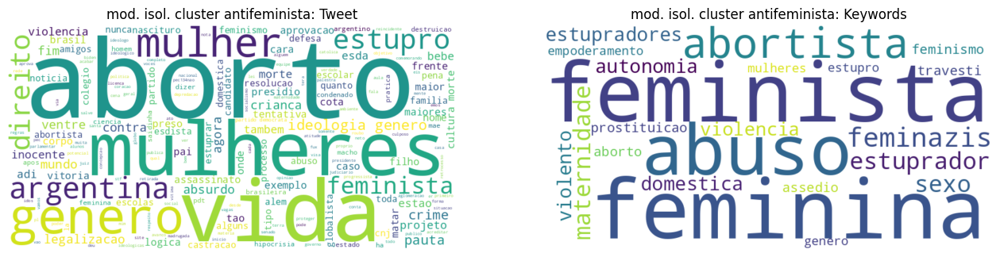

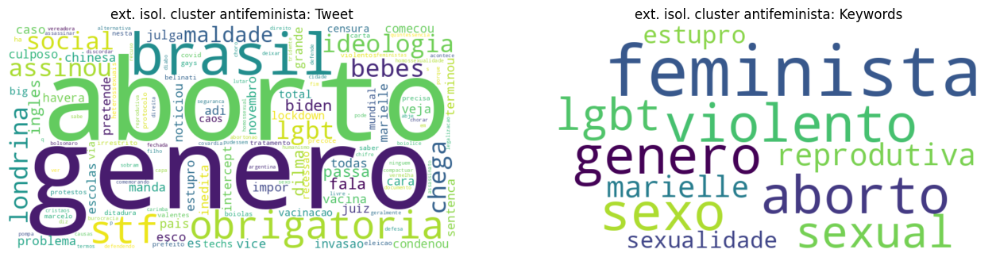

In [34]:
import ast
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Preprocessamento dos tweets
df_feminism['tweet_text_clean'] = df_feminism.tweet_text.apply(preprocess_tweet)
df_feminism['tweet_feminist_words_clean'] = df_feminism['tweet_feminist_words'].astype(str).str.replace('[', '').str.replace(']', '').str.replace("'", '').str.replace(',', '')

# Dicionário para renomear as faixas ideológicas
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Definir a ordem das ideologias renomeadas (da mais feminista para a mais antifeminista)
ordered_ideologies = [
    rename_map['feminista extrema'], 
    rename_map['feminista moderada'], 
    # rename_map['feminista centro'], 
    rename_map['centro'], 
    rename_map['antifeminista centro'], 
    rename_map['antifeminista moderada'], 
    rename_map['antifeminista extrema']
]

# Função para gerar uma nuvem de palavras a partir de uma lista de palavras
def generate_wordcloud_from_list(words_list, ax, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(words_list))
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(title)

# Função para gerar uma nuvem de palavras a partir de um texto completo
def generate_wordcloud_from_text(text, ax, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(title)

# Filtrando os dados por faixa ideológica e gerando as nuvens de palavras
for ideology in ordered_ideologies:
    # Mapeamento inverso para encontrar a ideologia original
    original_ideology = {v: k for k, v in rename_map.items()}[ideology]
    
    # Filtrar os tweets pela ideologia atual
    df_subset = df_feminism[df_feminism['user_ideology_classification'] == original_ideology]
    
    # Nuvem de palavras para as keywords (tweet_feminist_words)
    keywords_list = []
    for words in df_subset['tweet_feminist_words'].dropna():
        keywords = ast.literal_eval(words)
        # Normalizar palavras: remover espaços, converter para minúsculas, e remover duplicatas
        keywords_normalized = [word.strip().lower() for word in keywords]
        keywords_list.extend(keywords_normalized)
    
    # Remover duplicatas na lista final
    keywords_list = list(set(keywords_list))
    
    if keywords_list:
        fig, axs = plt.subplots(1, 2, figsize=(16, 8))
        
        # Nuvem de palavras para o texto completo do tweet (tweet_text_clean)
        generate_wordcloud_from_text(" ".join(df_subset['tweet_text_clean'].str.replace('quer', '').dropna()), axs[0], f'{ideology}: Tweet')
        
        # Nuvem de palavras para as keywords
        generate_wordcloud_from_list(keywords_list, axs[1], f'{ideology}: Keywords')

        plt.show()


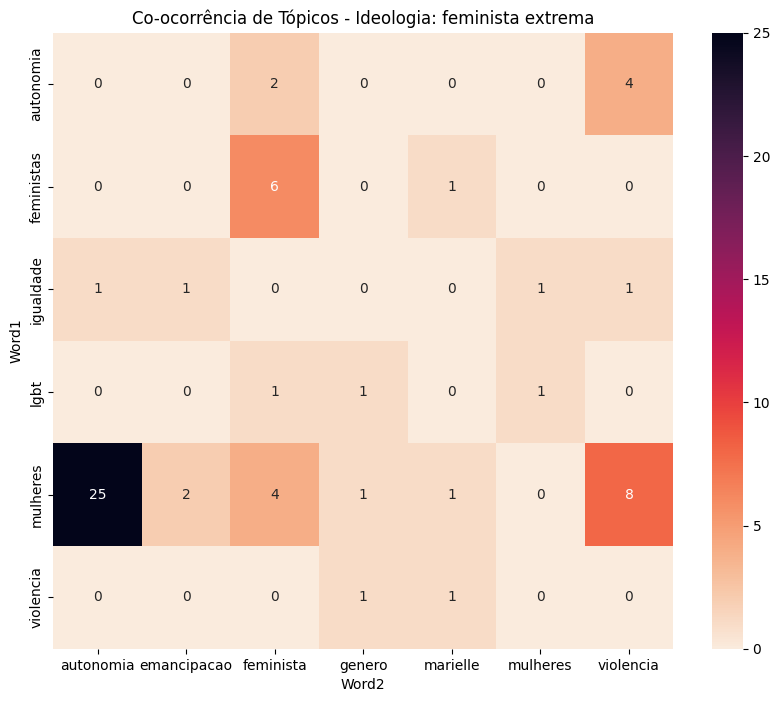

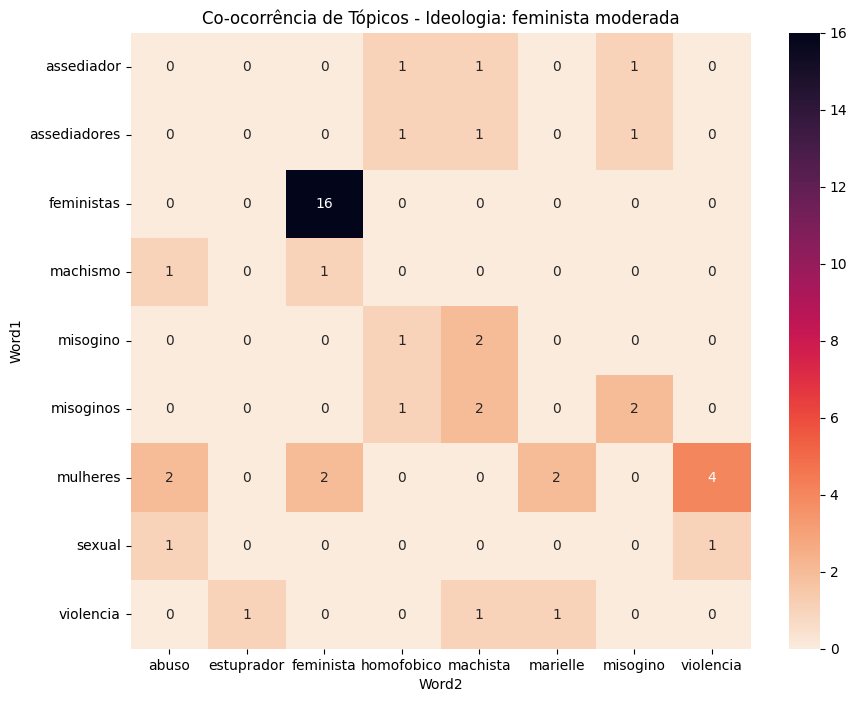

Sem dados suficientes para gerar heatmap para a ideologia: centro
Sem dados suficientes para gerar heatmap para a ideologia: antifeminista centro


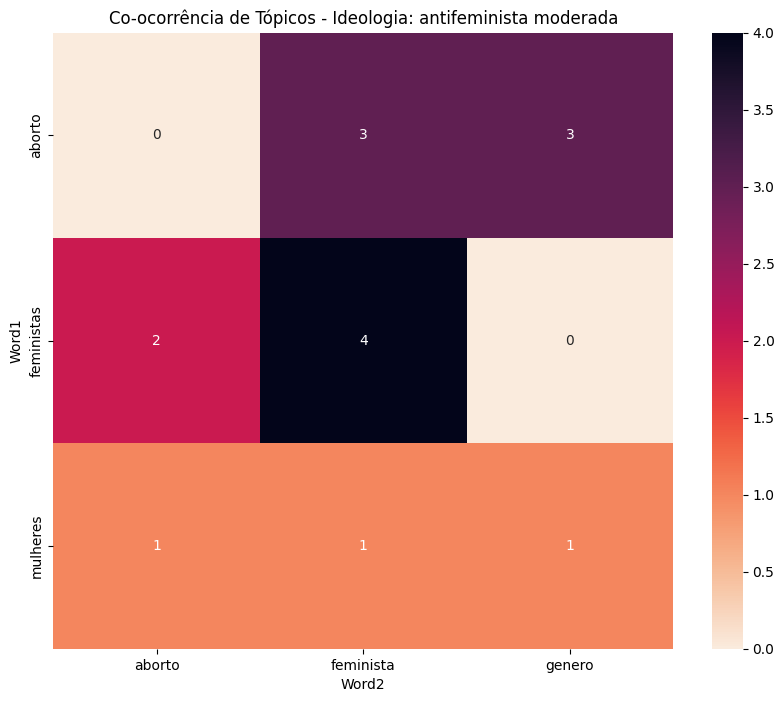

Sem dados suficientes para gerar heatmap para a ideologia: antifeminista extrema


In [35]:
# Correlação entre tópicos

from itertools import combinations
from collections import Counter
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Função ajustada para converter strings em listas de palavras
def process_feminist_words(val):
    if isinstance(val, str):
        return val.split()  # Dividindo a string em uma lista de palavras
    return []

# Função para calcular co-ocorrência de palavras em uma lista de palavras
def compute_co_occurrence(words_list):
    co_occurrence_counts = Counter()
    for words in words_list:
        if len(words) > 1:
            for pair in combinations(words, 2):
                co_occurrence_counts[frozenset(pair)] += 1
    return co_occurrence_counts

# Criando dicionário para armazenar as co-ocorrências por faixa ideológica
co_occurrence_by_ideology = {}

# Definindo a ordem das ideologias
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Processando co-ocorrências para cada faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    group = df_feminism[df_feminism['user_ideology_classification'] == ideology]
    words_list = group['tweet_feminist_words_clean'].dropna().apply(process_feminist_words)
    words_list = words_list.dropna().tolist()  # Filtrando apenas as listas válidas
    co_occurrence_by_ideology[ideology] = compute_co_occurrence(words_list)

# Transformando o dicionário de co-ocorrências em dataframes
co_occurrence_dfs = {}
for ideology, co_occurrence in co_occurrence_by_ideology.items():
    if co_occurrence:  # Verifica se existem co-ocorrências
        co_occurrence_df = pd.DataFrame(
            [(list(pair)[0], list(pair)[1], count) for pair, count in co_occurrence.items()],
            columns=['Word1', 'Word2', 'Count']
        )
        co_occurrence_df = co_occurrence_df.pivot(index='Word1', columns='Word2', values='Count').fillna(0)

        # Filtrando palavras que têm pelo menos 2 co-ocorrências
        co_occurrence_df = co_occurrence_df.loc[(co_occurrence_df.sum(axis=1) > 2), (co_occurrence_df.sum(axis=0) > 2)]

        co_occurrence_dfs[ideology] = co_occurrence_df

# Visualizando a co-ocorrência para cada faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    if ideology in co_occurrence_dfs and not co_occurrence_dfs[ideology].empty:
        plt.figure(figsize=(10, 8))
        sns.heatmap(co_occurrence_dfs[ideology], annot=True, cmap='rocket_r')
        plt.title(f"Co-ocorrência de Tópicos - Ideologia: {ideology}")
        plt.show()
    else:
        print(f"Sem dados suficientes para gerar heatmap para a ideologia: {ideology}")


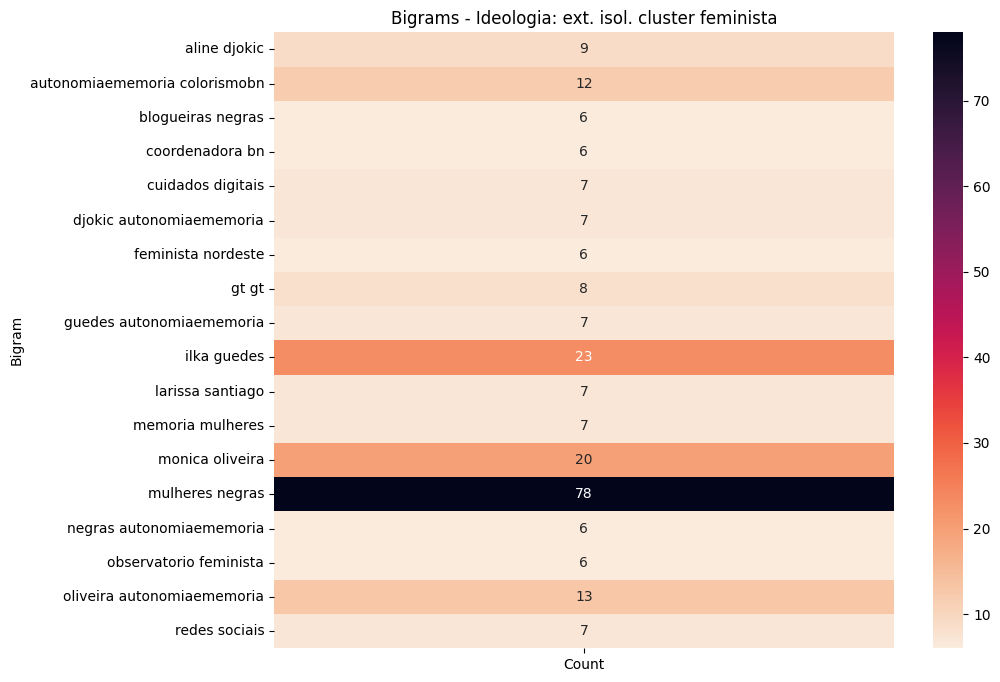

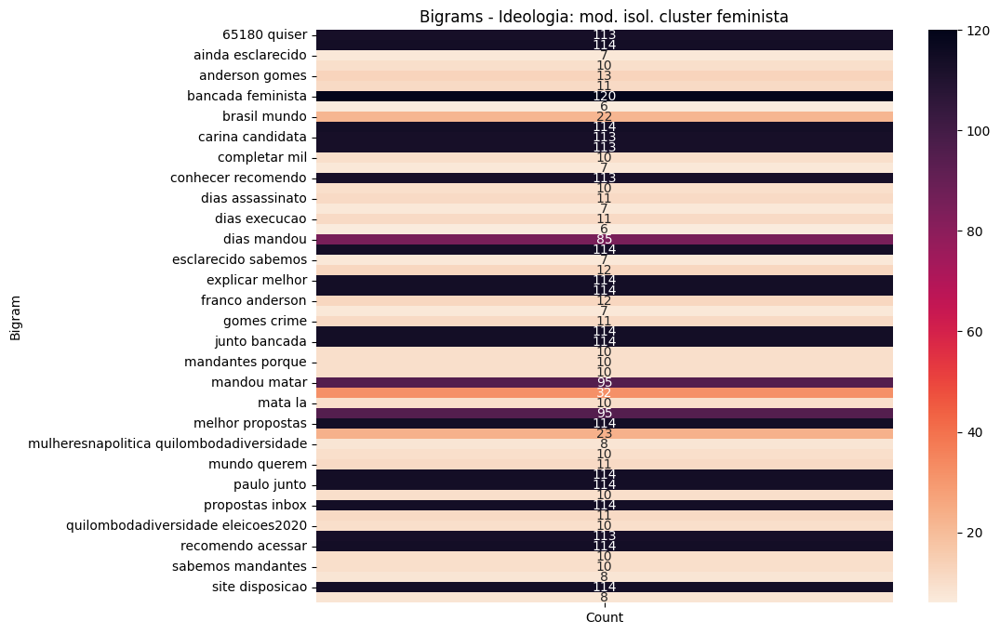

Sem dados suficientes para gerar heatmap para a ideologia: não isolado


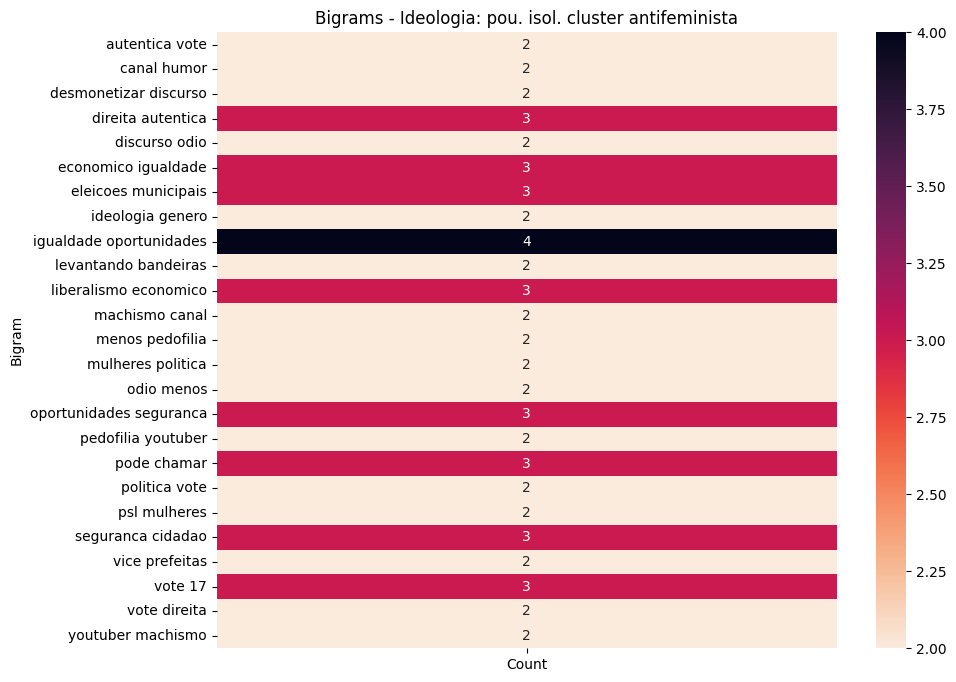

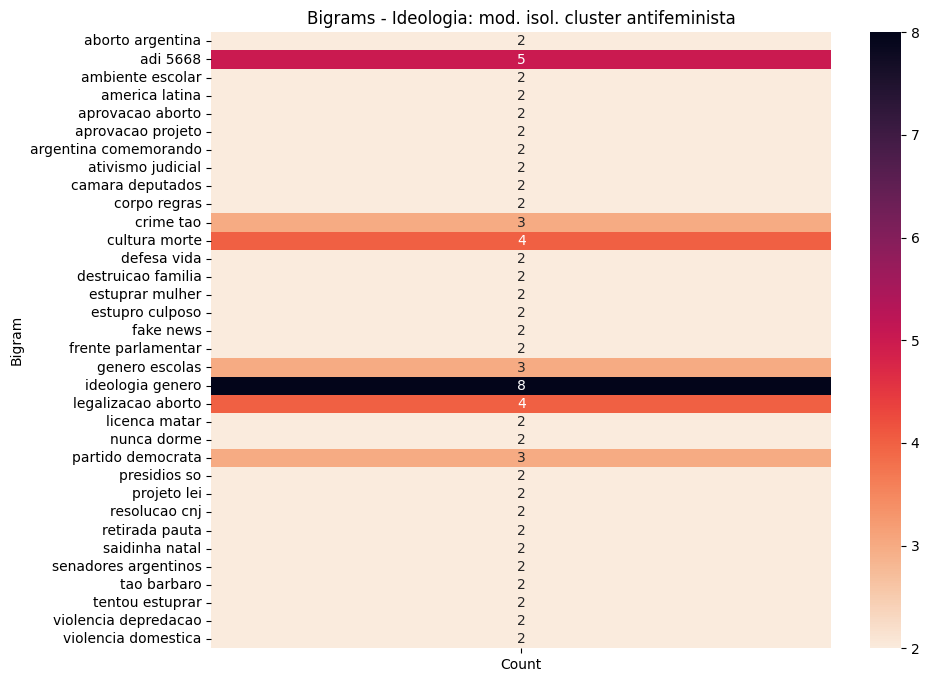

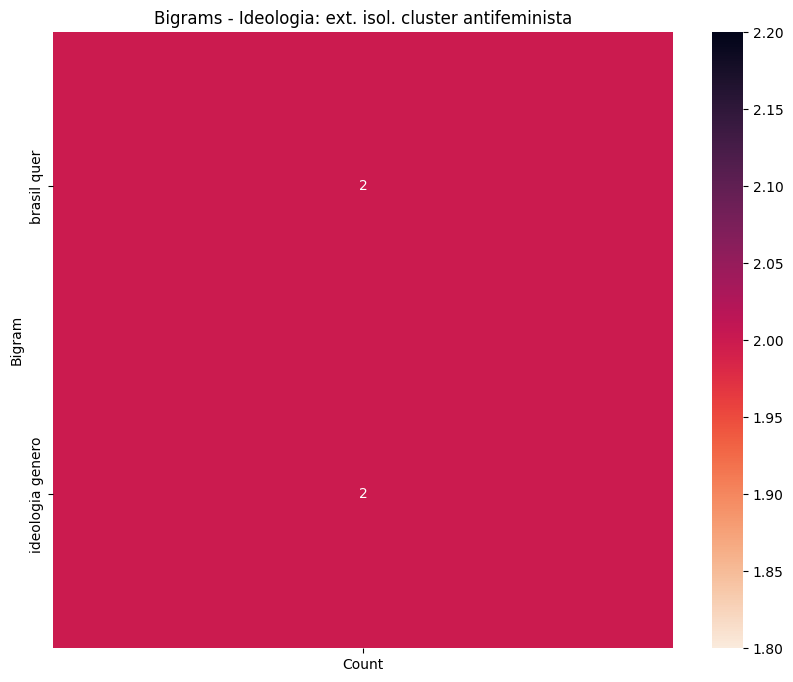

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer

# Função para gerar bigrams a partir de textos
def generate_bigrams(text):
    vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words=None)
    X = vectorizer.fit_transform(text)
    bigrams = vectorizer.get_feature_names_out()
    bigram_counts = X.toarray().sum(axis=0)
    return dict(zip(bigrams, bigram_counts))

# Criando dicionário para armazenar os bigrams por faixa ideológica
bigrams_by_ideology = {}

# Dicionário para renomear as faixas ideológicas
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Ordem das ideologias renomeadas conforme solicitado
ordered_ideologies = [
    rename_map['feminista extrema'], 
    rename_map['feminista moderada'], 
    rename_map['centro'], 
    rename_map['antifeminista centro'], 
    rename_map['antifeminista moderada'], 
    rename_map['antifeminista extrema']
]

# Criar um dicionário para mapear de volta para os nomes originais
inverse_rename_map = {v: k for k, v in rename_map.items()}

# Processando bigrams para cada faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    original_ideology = inverse_rename_map[ideology]
    group = df_feminism[df_feminism['user_ideology_classification'] == original_ideology]
    text_data = group['tweet_text_clean'].dropna().tolist()
    bigrams_by_ideology[ideology] = generate_bigrams(text_data)

# Transformando o dicionário de bigrams em dataframes
bigram_dfs = {}
for ideology, bigrams in bigrams_by_ideology.items():
    bigram_df = pd.DataFrame(list(bigrams.items()), columns=['Bigram', 'Count'])
    if ideology in [rename_map['feminista extrema'], rename_map['feminista moderada']]:
        bigram_df = bigram_df[bigram_df['Count'] > 5]
    else:
        bigram_df = bigram_df[bigram_df['Count'] > 1]
    if not bigram_df.empty:
        bigram_dfs[ideology] = bigram_df.set_index('Bigram')

# Visualizando os bigrams para cada faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    if ideology in bigram_dfs and not bigram_dfs[ideology].empty:
        plt.figure(figsize=(10, 8))
        sns.heatmap(bigram_dfs[ideology], annot=True, cmap='rocket_r', fmt="d")
        plt.title(f"Bigrams - Ideologia: {ideology}")
        plt.show()
    else:
        print(f"Sem dados suficientes para gerar heatmap para a ideologia: {ideology}")


#### Hashtags

/tmp/ipykernel_202017/1985761572.py:28: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



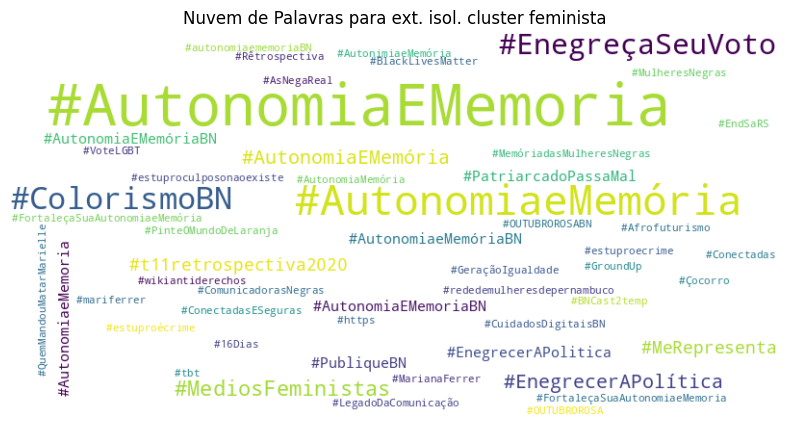

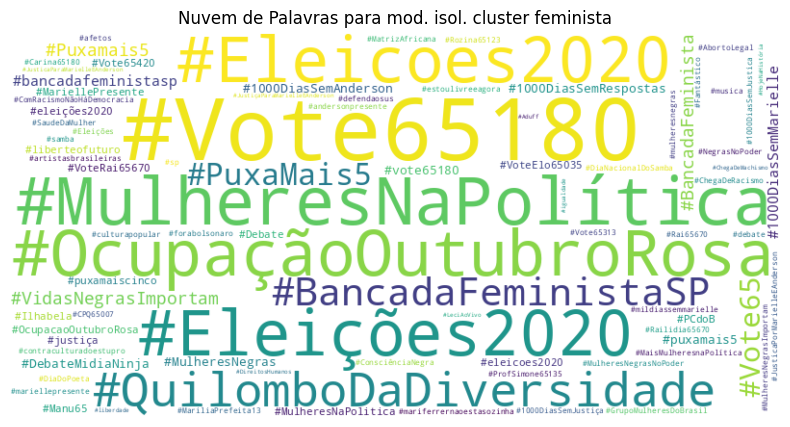

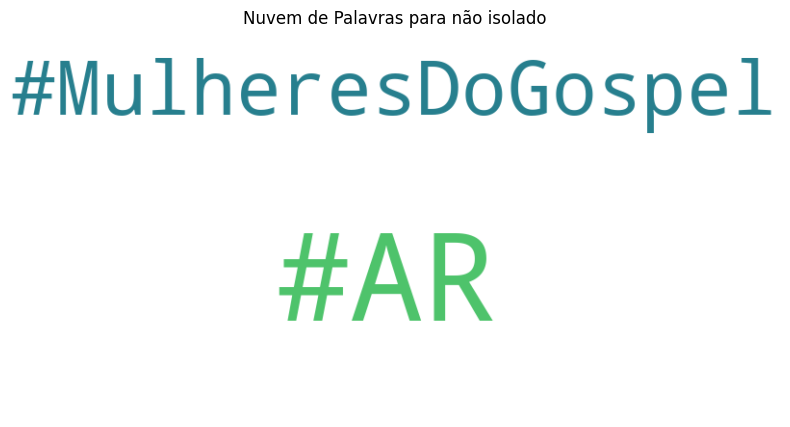

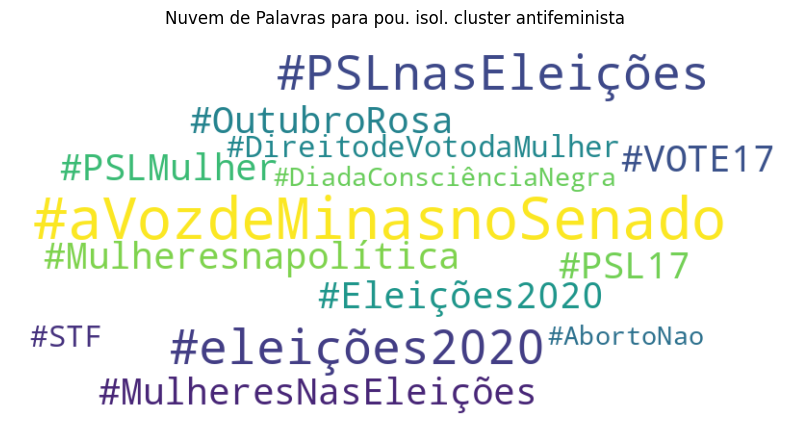

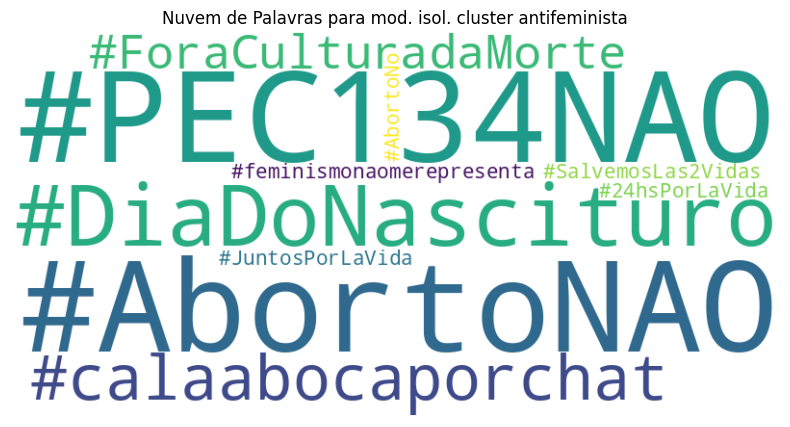

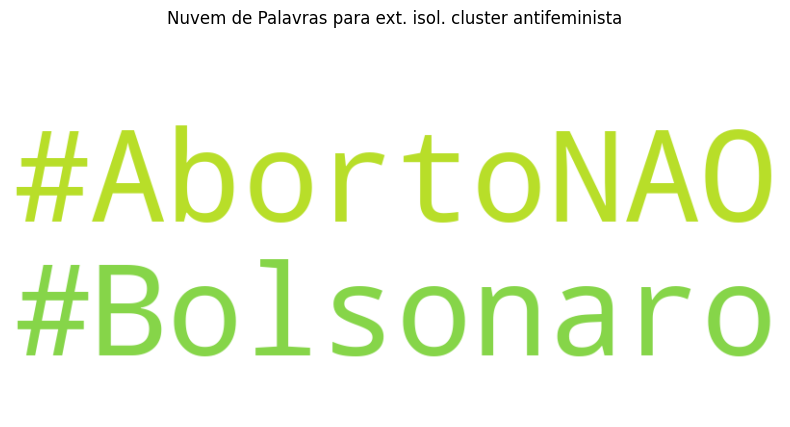

In [37]:
from collections import Counter
import ast
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Dicionário para renomear as faixas ideológicas
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Função para contar hashtags por faixa ideológica
def count_hashtags(group):
    hashtags = Counter()
    for hashtags_list in group['tweet_hashtags'].dropna():
        # Verifica se a string não está vazia e se é uma string, então faz a conversão
        if isinstance(hashtags_list, str) and hashtags_list != '[]':
            hashtags.update(ast.literal_eval(hashtags_list))
        elif isinstance(hashtags_list, list):
            hashtags.update(hashtags_list)
    return hashtags

hashtags_by_ideology = df_feminism.groupby('user_ideology_classification').apply(count_hashtags)

# Ordem das ideologias renomeadas conforme solicitado
ordered_ideologies = [
    rename_map['feminista extrema'], 
    rename_map['feminista moderada'], 
    rename_map['centro'], 
    rename_map['antifeminista centro'], 
    rename_map['antifeminista moderada'], 
    rename_map['antifeminista extrema']
]

# Criar um dicionário para mapear de volta para os nomes originais
inverse_rename_map = {v: k for k, v in rename_map.items()}

# Gerando nuvens de palavras para cada faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    original_ideology = inverse_rename_map[ideology]
    if original_ideology in hashtags_by_ideology:
        hashtags = hashtags_by_ideology[original_ideology]
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(hashtags)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Nuvem de Palavras para {ideology}')
        plt.axis('off')
        plt.show()


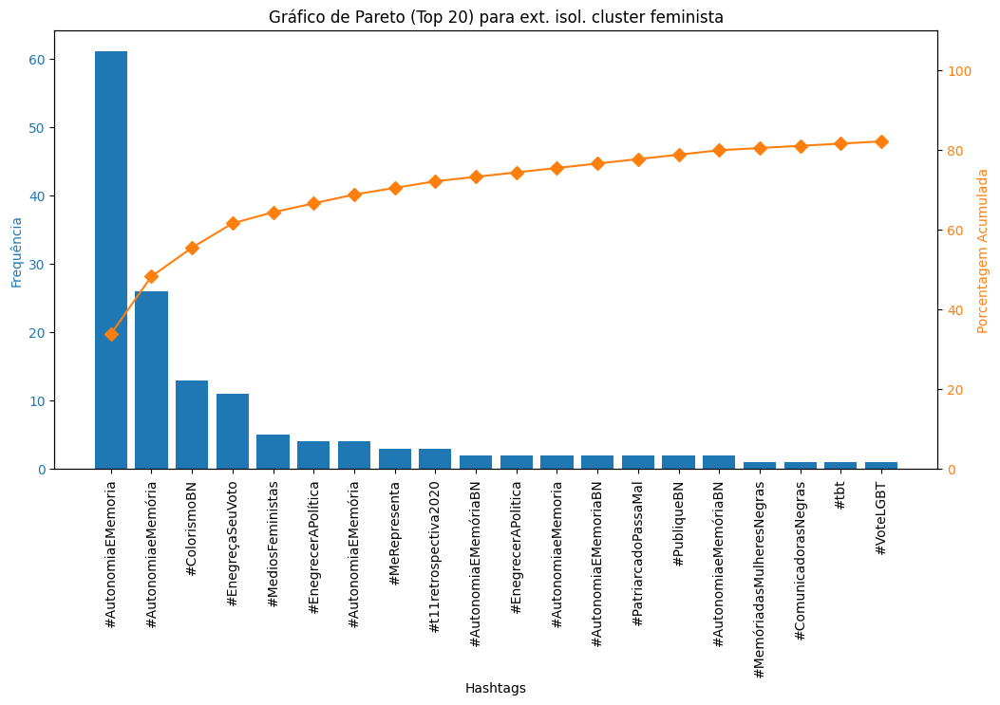

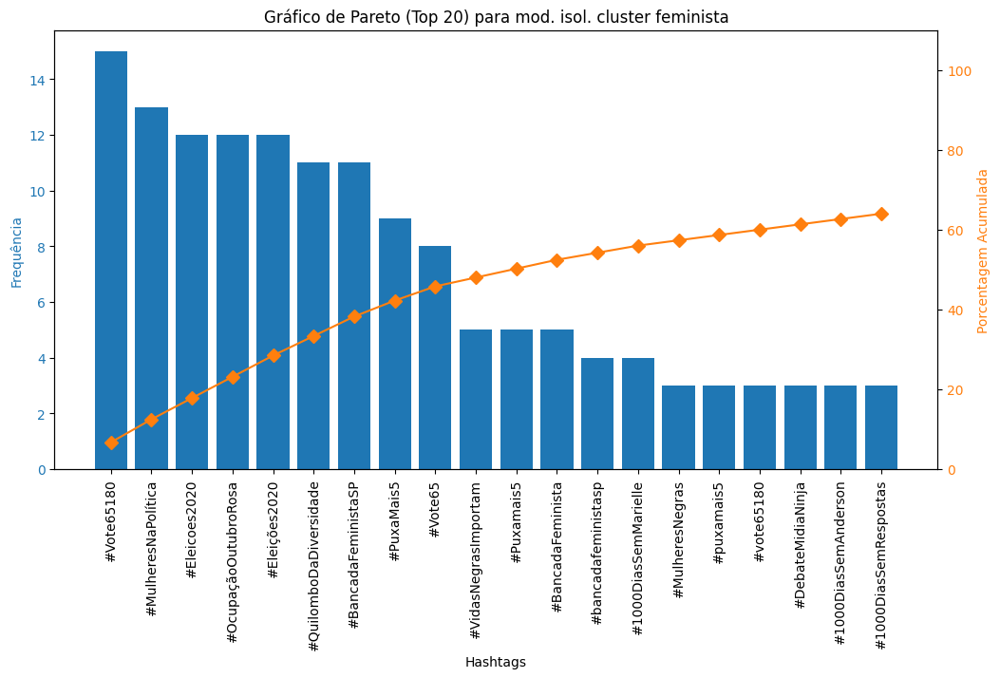

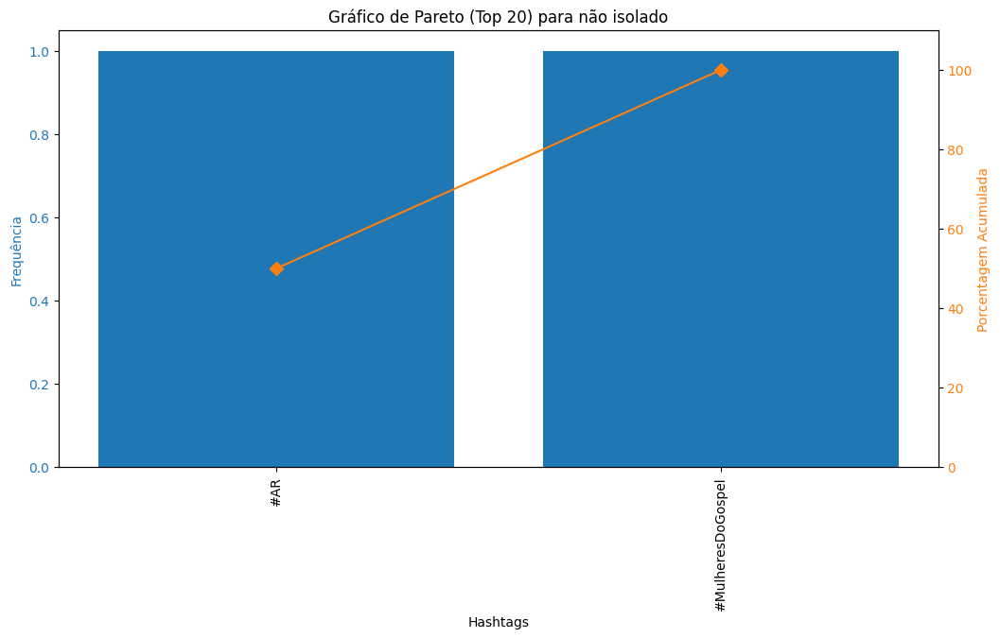

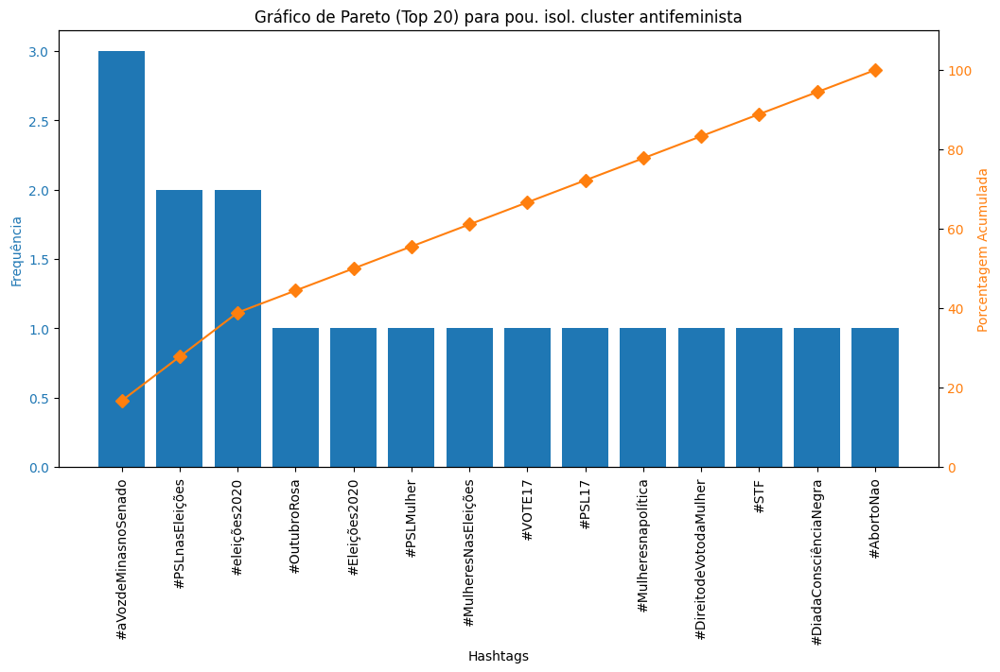

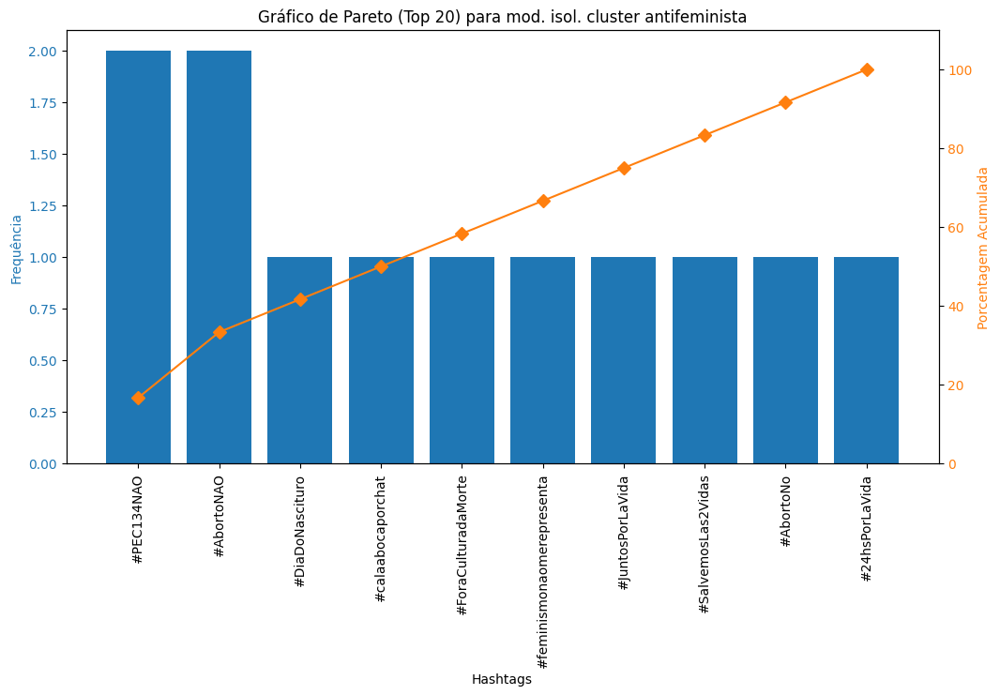

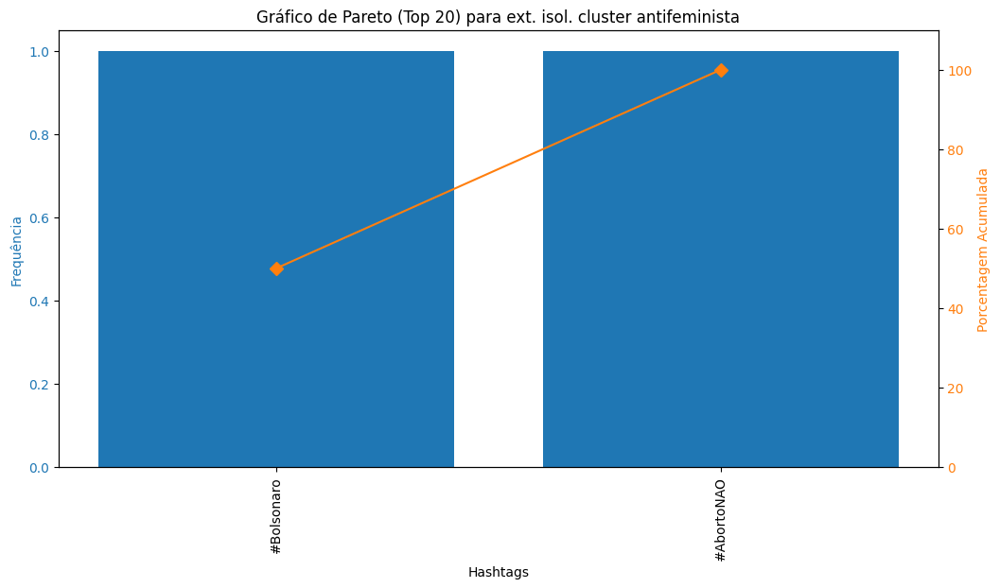

In [38]:
import matplotlib.pyplot as plt

# Dicionário para renomear as faixas ideológicas
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Ordem das ideologias renomeadas conforme solicitado
ordered_ideologies = [
    rename_map['feminista extrema'], 
    rename_map['feminista moderada'], 
    rename_map['centro'], 
    rename_map['antifeminista centro'], 
    rename_map['antifeminista moderada'], 
    rename_map['antifeminista extrema']
]

# Criar um dicionário para mapear de volta para os nomes originais
inverse_rename_map = {v: k for k, v in rename_map.items()}

# Gerando gráfico de Pareto para cada faixa ideológica na ordem especificada, mostrando apenas o top 20
for ideology in ordered_ideologies:
    original_ideology = inverse_rename_map[ideology]
    if original_ideology in hashtags_by_ideology:
        hashtags = hashtags_by_ideology[original_ideology]
        total_counts = sum(hashtags.values())  # Somando todas as hashtags, não apenas as top 20
        
        hashtags_sorted = hashtags.most_common(20)  # Mostrando apenas as top 20 hashtags
        
        if hashtags_sorted:
            labels, counts = zip(*hashtags_sorted)
            
            # Calculando a porcentagem acumulada considerando o total
            cum_percentage = [sum(counts[:i+1])/total_counts * 100 for i in range(len(counts))]
            
            # Plotando o gráfico de Pareto
            fig, ax1 = plt.subplots(figsize=(12, 6))

            ax1.bar(labels, counts, color='C0')
            ax1.set_xlabel('Hashtags')
            ax1.set_ylabel('Frequência', color='C0')
            ax1.tick_params(axis='y', labelcolor='C0')
            plt.xticks(rotation=90)

            ax2 = ax1.twinx()
            ax2.plot(labels, cum_percentage, color='C1', marker='D', ms=7)
            ax2.set_ylabel('Porcentagem Acumulada', color='C1')
            ax2.tick_params(axis='y', labelcolor='C1')
            ax2.set_ylim([0, 110])

            plt.title(f'Gráfico de Pareto (Top 20) para {ideology}')
            plt.show()


#### Menções

In [39]:
# @s

from collections import Counter
import ast

# Função para contar menções por faixa ideológica
def count_mentions(group):
    mentions = Counter()
    for mentions_list in group['tweet_mentions'].dropna():
        # Verifica se a string não está vazia e se é uma string, então faz a conversão
        if isinstance(mentions_list, str) and mentions_list != '[]':
            mentions.update(ast.literal_eval(mentions_list))
        elif isinstance(mentions_list, list):
            mentions.update(mentions_list)
    return mentions

# Agrupando por faixa ideológica e contando as menções
mentions_by_ideology = df_feminism.groupby('user_ideology_classification').apply(count_mentions)


/tmp/ipykernel_202017/4018206354.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



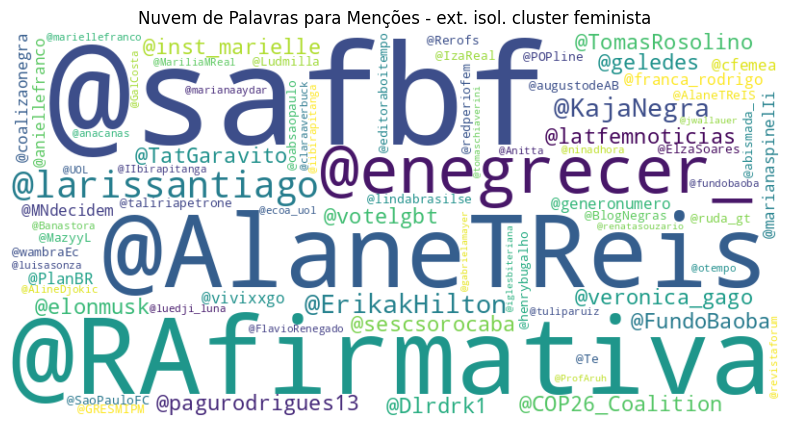

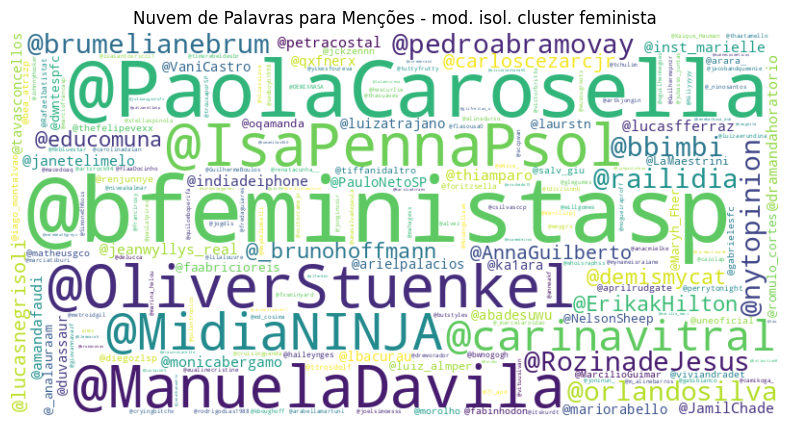

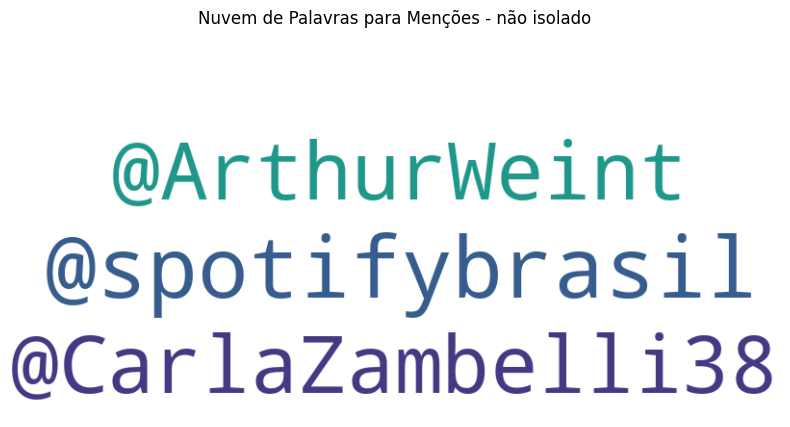

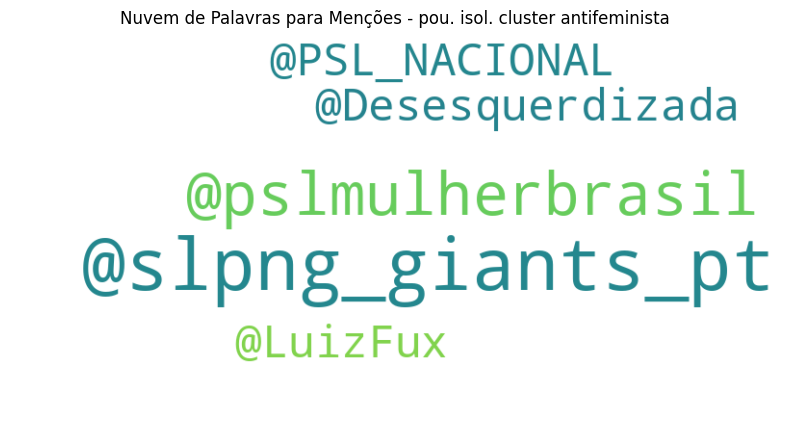

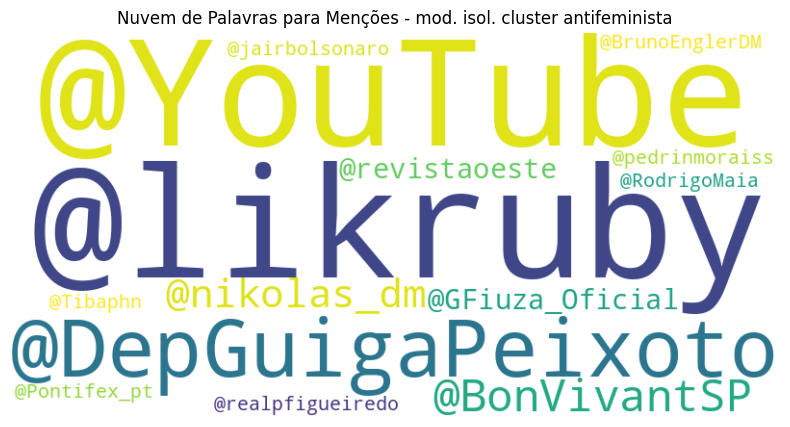

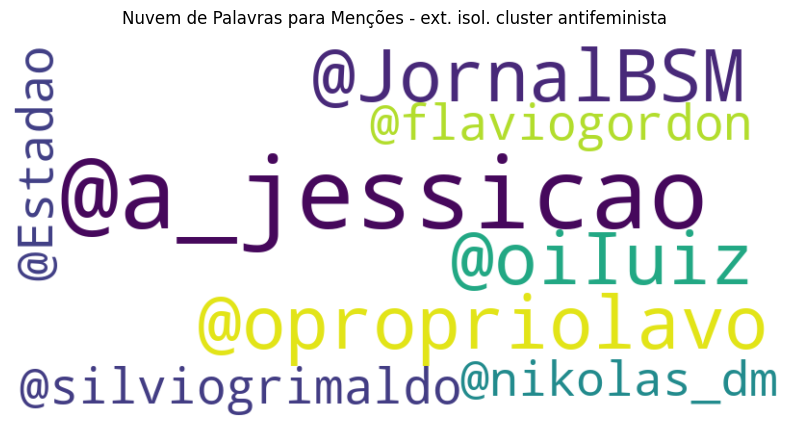

In [40]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Dicionário para renomear as faixas ideológicas
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Ordem das ideologias renomeadas conforme solicitado
ordered_ideologies = [
    rename_map['feminista extrema'], 
    rename_map['feminista moderada'], 
    rename_map['centro'], 
    rename_map['antifeminista centro'], 
    rename_map['antifeminista moderada'], 
    rename_map['antifeminista extrema']
]

# Criar um dicionário para mapear de volta para os nomes originais
inverse_rename_map = {v: k for k, v in rename_map.items()}

# Gerando nuvens de palavras para menções por faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    original_ideology = inverse_rename_map[ideology]
    if original_ideology in mentions_by_ideology:
        mentions = mentions_by_ideology[original_ideology]
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(mentions)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Nuvem de Palavras para Menções - {ideology}')
        plt.axis('off')
        plt.show()


In [41]:
# Pareto Menções

import matplotlib.pyplot as plt

# Gerando gráfico de Pareto para menções em cada faixa ideológica na ordem especificada, mostrando apenas o top 10
for ideology in ordered_ideologies:
    if ideology in mentions_by_ideology:
        mentions = mentions_by_ideology[ideology]
        total_counts = sum(mentions.values())  # Somando todas as menções, não apenas as top 10
        
        mentions_sorted = mentions.most_common(20)  # Mostrando apenas as top 10 menções
        
        if mentions_sorted:
            labels, counts = zip(*mentions_sorted)
            
            # Calculando a porcentagem acumulada considerando o total
            cum_percentage = [sum(counts[:i+1])/total_counts * 100 for i in range(len(counts))]
            
            # Plotando o gráfico de Pareto
            fig, ax1 = plt.subplots(figsize=(12, 6))

            ax1.bar(labels, counts, color='C0')
            ax1.set_xlabel('Menções')
            ax1.set_ylabel('Frequência', color='C0')
            ax1.tick_params(axis='y', labelcolor='C0')
            plt.xticks(rotation=90)

            ax2 = ax1.twinx()
            ax2.plot(labels, cum_percentage, color='C1', marker='D', ms=7)
            ax2.set_ylabel('Porcentagem Acumulada', color='C1')
            ax2.tick_params(axis='y', labelcolor='C1')
            ax2.set_ylim([0, 110])

            plt.title(f'Gráfico de Pareto (Top 20) para Menções - {ideology}')
            plt.show()


#### Emojis

In [42]:
# emojis

from collections import Counter
import regex as re  # Usando 'regex' para suporte avançado a emojis

# Função para remover modificadores de tons de pele e outros símbolos
def remove_modifiers(emoji):
    # Remove todos os modificadores de tons de pele e outros símbolos combinados
    return re.sub(r'[\U0001F3FB-\U0001F3FF\U0001F3A0-\U0001F3F0\U00002600-\U000026FF]', '', emoji)

# Função para contar emojis por faixa ideológica
def count_emojis(group):
    emojis = Counter()
    emoji_pattern = re.compile(r'\X', re.UNICODE)
    
    for emojis_list in group['tweet_emojis'].dropna():
        if isinstance(emojis_list, str) and emojis_list.strip():
            found_emojis = [char for char in emoji_pattern.findall(emojis_list)]
            # Filtra emojis vazios
            found_emojis = [emoji for emoji in found_emojis if emoji.strip()]
            emojis.update(found_emojis)
    
    return emojis

# Agrupando por faixa ideológica e contando os emojis
emojis_by_ideology = df_feminism.groupby('user_ideology_classification').apply(count_emojis)

# Exibindo os resultados
# emojis_by_ideology


/tmp/ipykernel_202017/1834264059.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [43]:
# emojis mais usados em tweets

import plotly.graph_objects as go
import re
from collections import Counter

# Ordem das ideologias conforme solicitado
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Função para extrair emojis usando regex que separa corretamente os emojis
def extract_emojis(text):
    emoji_pattern = re.compile(r'[\U0001F600-\U0001F64F'
                               r'\U0001F300-\U0001F5FF'
                               r'\U0001F680-\U0001F6FF'
                               r'\U0001F1E0-\U0001F1FF'
                               r'\U00002702-\U000027B0'
                               r'\U000024C2-\U0001F251'
                               r'\U0001F900-\U0001F9FF'
                               r'\U0000200D-\U0001F3FB-\U0001F3FF]', flags=re.UNICODE)
    return emoji_pattern.findall(text)

# Função para calcular a porcentagem de tweets em que cada emoji aparece
def calculate_emoji_percentage(df, ideology):
    # Filtrando os tweets da ideologia específica
    tweets = df[df['user_ideology_classification'] == ideology]
    total_tweets = len(tweets)
    
    emoji_counts = Counter()
    for tweet_emojis in tweets['tweet_emojis'].dropna():
        if isinstance(tweet_emojis, str) and tweet_emojis.strip():
            # Extrair cada emoji individualmente
            emoji_list = set(extract_emojis(tweet_emojis))
            emoji_counts.update(emoji_list)  # Contagem por tweet
    
    # Calculando a porcentagem de tweets que contêm cada emoji
    emoji_percentages = {emoji: (count / total_tweets) * 100 for emoji, count in emoji_counts.items()}
    return emoji_percentages

# Gerar gráficos de barras para cada faixa ideológica
for ideology in ordered_ideologies:
    emoji_percentages = calculate_emoji_percentage(df_feminism, ideology)
    
    if emoji_percentages:  # Verifica se há emojis para a ideologia
        sorted_emojis = sorted(emoji_percentages.items(), key=lambda item: item[1], reverse=True)
        top_10_emojis = sorted_emojis[:10]
        
        if top_10_emojis:
            labels, percentages = zip(*top_10_emojis)

            # Formatar os valores para exibir com uma casa decimal e símbolo de porcentagem
            formatted_percentages = [f'{p:.1f}%' for p in percentages]

            # Criar o gráfico de barras com Plotly
            fig = go.Figure([go.Bar(x=labels, y=percentages, text=formatted_percentages, textposition='auto')])

            fig.update_layout(
                title=f'Emojis mais usados - {ideology}',
                xaxis_title='Emojis',
                yaxis_title='Porcentagem de Tweets (%)',
                showlegend=False
            )

            fig.show()


In [44]:
# tweets mais numerosos

import plotly.graph_objects as go

# Ordem das ideologias conforme solicitado
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Função para calcular a porcentagem de tweets em que cada emoji aparece
def calculate_emoji_percentage(emojis_by_ideology, total_tweets):
    emoji_percentages = {emoji: (count / total_tweets) * 100 for emoji, count in emojis_by_ideology.items()}
    return emoji_percentages

# Gerar gráficos de Pareto para cada faixa ideológica
for ideology in ordered_ideologies:
    if ideology in emojis_by_ideology:
        emojis = emojis_by_ideology[ideology]
        total_tweets = sum(emojis.values())  # Calcular o número total de tweets na faixa ideológica

        if emojis:  # Verifica se há emojis para a ideologia
            # Calcular as porcentagens de cada emoji
            emoji_percentages = calculate_emoji_percentage(emojis, total_tweets)
            labels, percentages = zip(*sorted(emoji_percentages.items(), key=lambda item: item[1], reverse=True))

            # Calculando a porcentagem acumulada
            cum_percentage = [sum(percentages[:i+1]) for i in range(len(percentages))]

            # Criar o gráfico de Pareto com Plotly
            fig = go.Figure()

            # Adicionar o gráfico de barras para as porcentagens
            fig.add_trace(go.Bar(x=labels, y=percentages, text=[f'{p:.1f}%' for p in percentages], textposition='auto', name='Porcentagem de Tweets'))

            # Adicionar o gráfico de linha para a porcentagem acumulada
            fig.add_trace(go.Scatter(x=labels, y=cum_percentage, mode='lines+markers', name='Porcentagem Acumulada', yaxis='y2'))

            # Configurar layout com dois eixos y
            fig.update_layout(
                title=f'Gráfico de Pareto para Emojis - {ideology}',
                xaxis_title='Emojis',
                yaxis_title='Porcentagem de Tweets (%)',
                yaxis2=dict(
                    title='Porcentagem Acumulada',
                    overlaying='y',
                    side='right',
                    range=[0, 110]
                ),
                showlegend=False
            )

            fig.show()


#### Extra 1: Análise de sentimentos e feminismo

In [45]:
# Aplicar uma análise de sentimento ao texto dos tweets para entender o tom geral dos tweets relacionados ao feminismo em cada faixa ideológica.

from transformers import pipeline

# Carregar o pipeline de análise de sentimentos usando um modelo multilíngue
sentiment_analyzer = pipeline("sentiment-analysis", model="nlptown/bert-base-multilingual-uncased-sentiment")

# Função para aplicar a análise de sentimentos e converter estrelas para categorias detalhadas
def get_detailed_sentiment(text):
    result = sentiment_analyzer(text)[0]
    stars = int(result['label'].split()[0])  # Extrai o número de estrelas
    if stars == 1:
        return 'muito negativo'
    elif stars == 2:
        return 'negativo'
    elif stars == 3:
        return 'neutro'
    elif stars == 4:
        return 'positivo'
    elif stars == 5:
        return 'muito positivo'

# Aplicando a função de sentimento para cada linha no DataFrame
df_feminism['tweet_sentiment'] = df_feminism['tweet_text_clean'].apply(get_detailed_sentiment)

# Verificando as primeiras linhas para garantir que a nova coluna foi adicionada corretamente
df_feminism[['tweet_text_clean', 'tweet_sentiment']].head()


/home/mindera/Documents/Mestrado/twitter_handler/myenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

2024-08-31 12:24:50.260345: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-31 12:24:50.268544: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-31 12:24:50.279975: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-31 12:24:50.283245: E external/local

,tweet_text_clean,tweet_sentiment
0,biden passa dilma fala ingles problema vice marielle,muito negativo
11,episodio novo qgcast ar falamos saude mental mulheres venham ouvir compartilhem,muito negativo
39,932 dias mandou matar marielle,muito negativo
70,idoso respeitar vividos dever responsabilidade todos promover bem protecao honrar vida infelizmente violencia contra idoso aumentou durante pandemia pode continuar,muito negativo
71,apresentei projeto criar sos idoso canal denunciar maus tratos violencia contra idosos todos dias possamos valorizar construiram historias,muito positivo


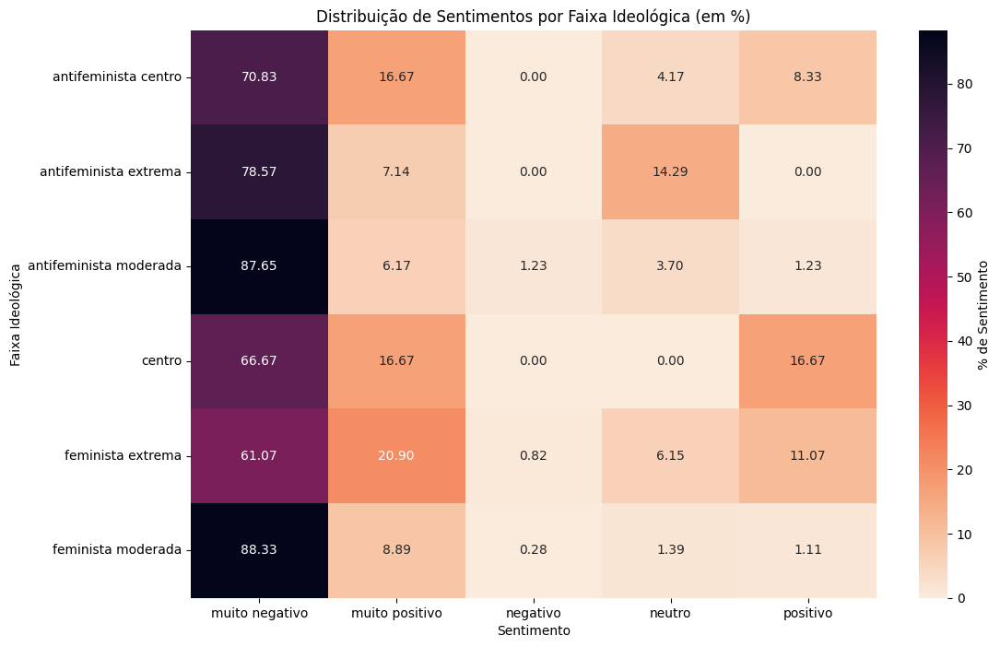

In [46]:
# Agrupando por faixa ideológica e sentimento, e contando o número de tweets em cada grupo
sentiment_distribution = df_feminism.groupby(['user_ideology_classification', 'tweet_sentiment']).size().unstack(fill_value=0)

# Calculando a proporção de cada sentimento dentro de cada faixa ideológica
sentiment_proportion = sentiment_distribution.div(sentiment_distribution.sum(axis=1), axis=0)

import matplotlib.pyplot as plt
import seaborn as sns

# Arredondando os valores para 2 casas decimais e convertendo para porcentagem (0-100)
sentiment_proportion_rounded = (sentiment_proportion * 100).round(2)

# Criando o heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(sentiment_proportion_rounded, annot=True, cmap='rocket_r', fmt='.2f', cbar_kws={'label': '% de Sentimento'})

plt.title('Distribuição de Sentimentos por Faixa Ideológica (em %)')
plt.xlabel('Sentimento')
plt.ylabel('Faixa Ideológica')
plt.show()



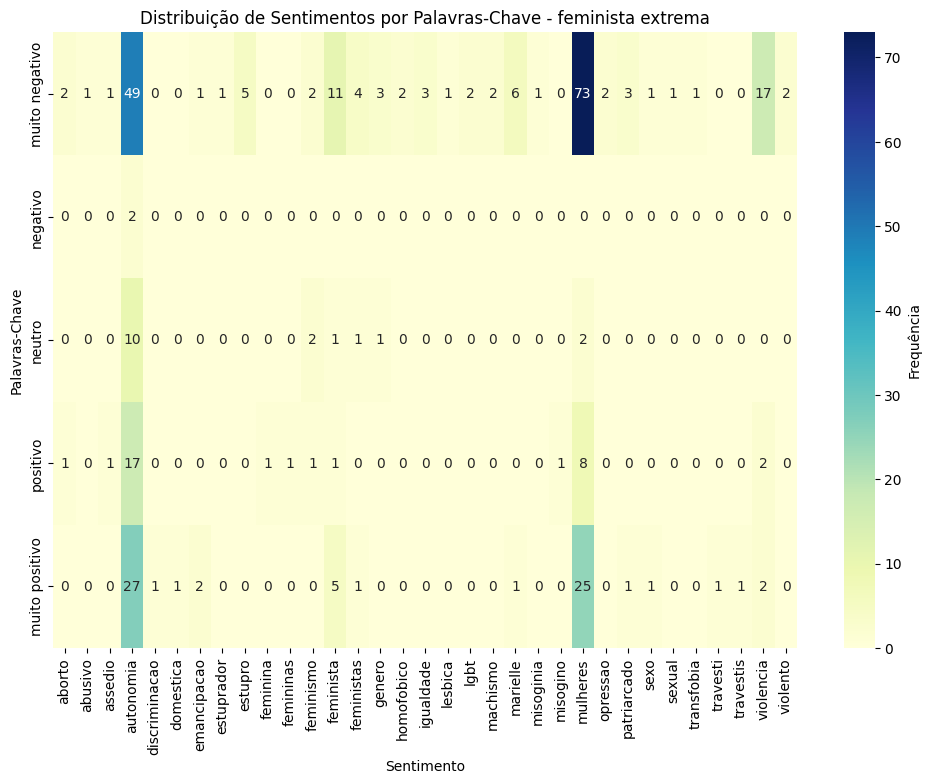

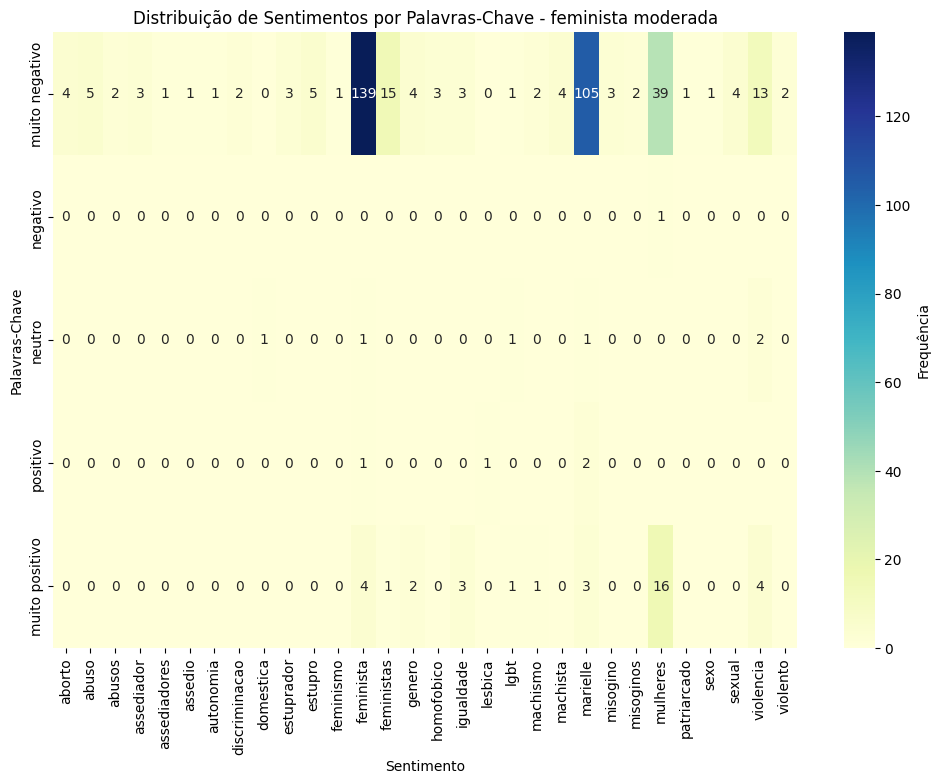

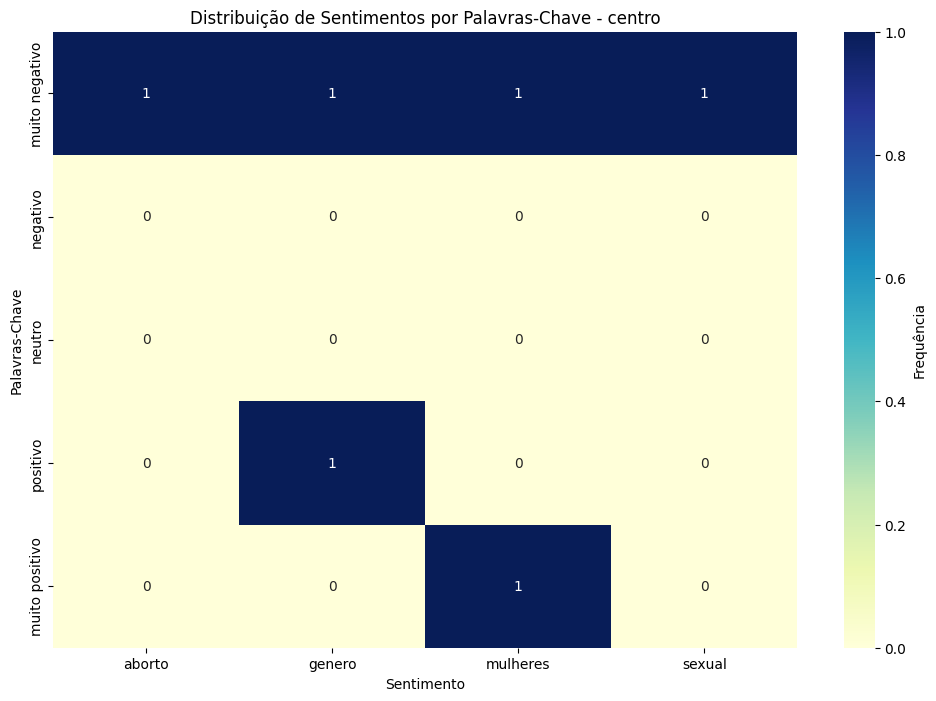

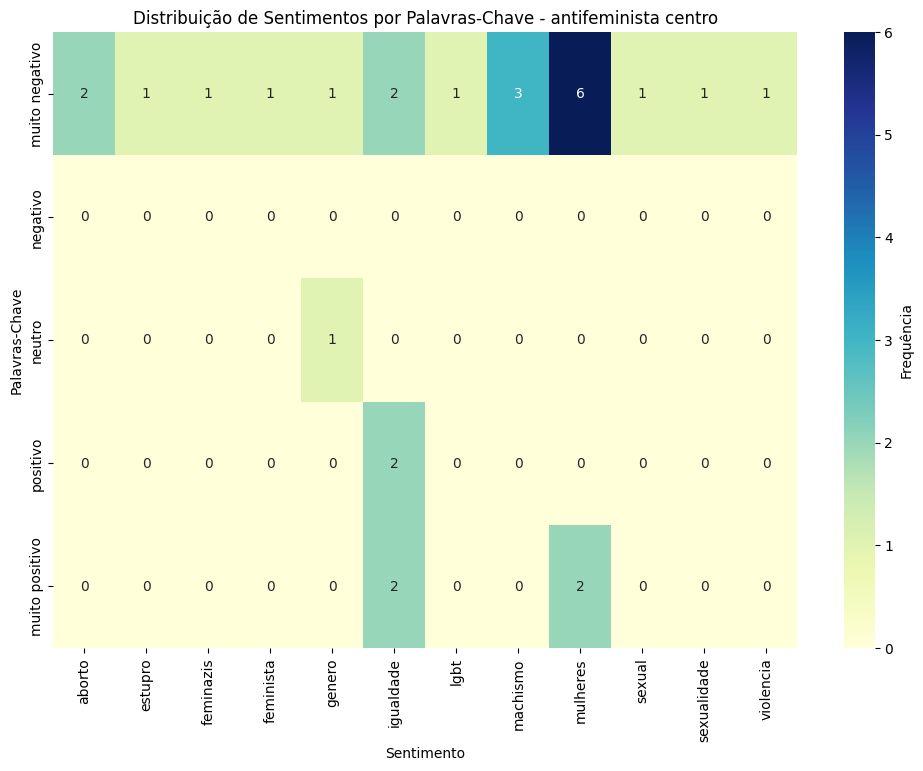

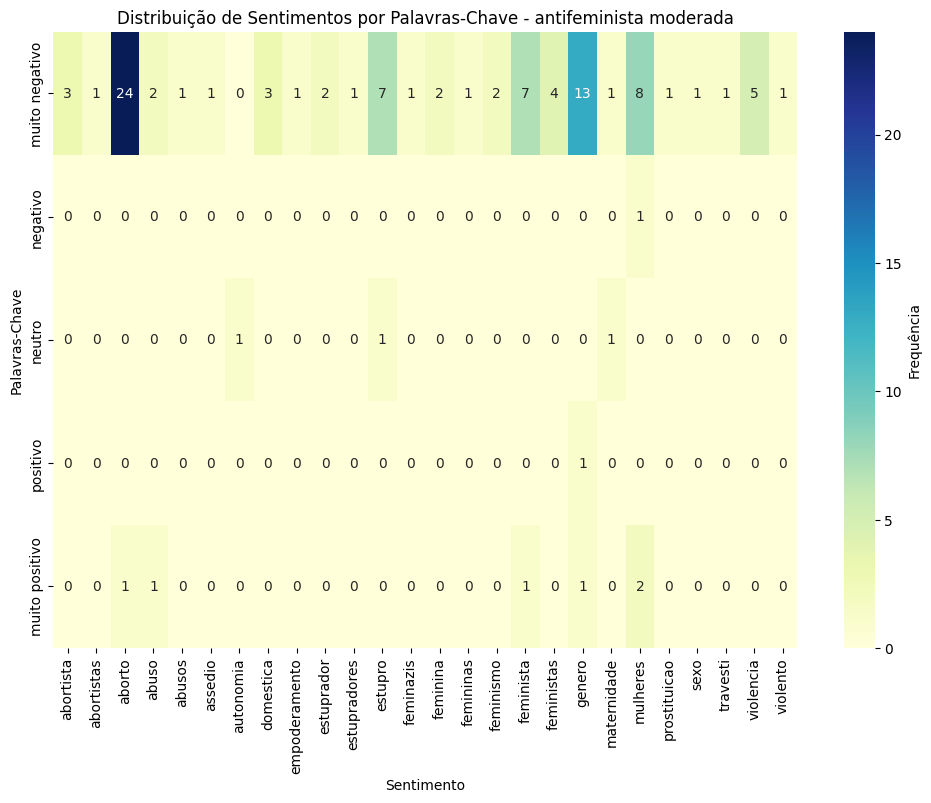

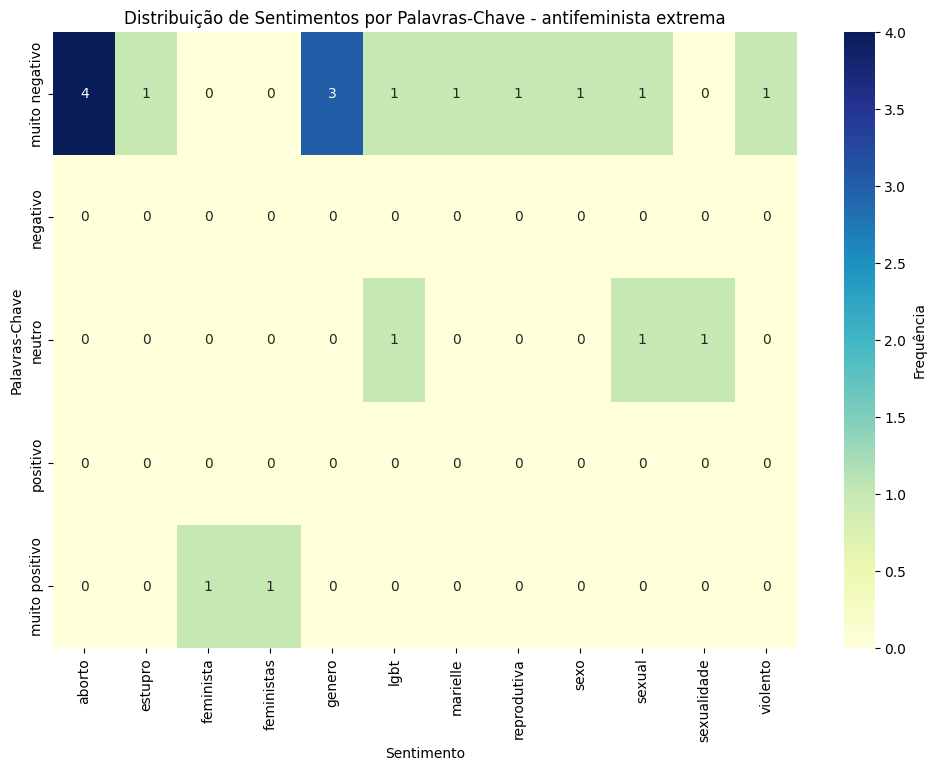

In [47]:
# sentimento por faixa ideologica e keywords
import warnings
warnings.filterwarnings("ignore")

import ast
from collections import Counter

# Função para descompactar listas de palavras-chave e associá-las a sentimentos e faixas ideológicas
def extract_keywords_and_sentiments(row):
    try:
        keywords = ast.literal_eval(row['tweet_feminist_words'])  # Converte string de lista para lista
    except:
        keywords = []
    sentiment = row['tweet_sentiment']
    ideology = row['user_ideology_classification']
    return [(keyword, sentiment, ideology) for keyword in keywords]

# Aplicando a função a cada linha do dataframe
keywords_sentiments_ideology = df_feminism.apply(extract_keywords_and_sentiments, axis=1)

# Descompactando a lista de listas
flat_list = [item for sublist in keywords_sentiments_ideology for item in sublist]

# Criando um novo dataframe para análise
df_keywords_sentiments = pd.DataFrame(flat_list, columns=['keyword', 'sentiment', 'ideology']).dropna()

# Visualizando as primeiras linhas do novo dataframe
# df_keywords_sentiments.head()

# Contando a frequência de cada palavra-chave por sentimento e faixa ideológica
keyword_sentiment_count = df_keywords_sentiments.groupby(['ideology', 'sentiment', 'keyword']).size().unstack(fill_value=0)

# Exibindo as primeiras linhas do resultado
# keyword_sentiment_count.head()

ordered_ideologies = ['feminista extrema', 
                      'feminista moderada', 
                      'centro', 
                      'antifeminista centro', 
                      'antifeminista moderada', 
                      'antifeminista extrema']

# Selecionando uma faixa ideológica para análise detalhada
for selected_ideology in ordered_ideologies:
    min_value = 0

    if selected_ideology in ['feminista extrema', 'feminista moderada']:
        min_value = 10

    min_value = 0

    # Filtrando os dados para a faixa ideológica selecionada
    filtered_data = keyword_sentiment_count.loc[selected_ideology]

    # Filtrando as palavras-chave que aparecem pelo menos uma vez
    filtered_data_nonzero = filtered_data.loc[:, (filtered_data > min_value).any(axis=0)]

    # Reordenando o índice para que os sentimentos fiquem do mais negativo para o mais positivo
    ordered_sentiments = ['muito negativo', 'negativo', 'neutro', 'positivo', 'muito positivo']

    # Reordenando os sentimentos e preenchendo os que estão faltando com zeros
    for sentiment in ordered_sentiments:
        if sentiment not in filtered_data_nonzero.index:
            filtered_data_nonzero.loc[sentiment] = 0

    # Reordenando o DataFrame para garantir que os sentimentos apareçam na ordem correta
    filtered_data_nonzero = filtered_data_nonzero.reindex(ordered_sentiments)

    # Criando o heatmap com o eixo Y ordenado do mais negativo para o mais positivo
    plt.figure(figsize=(12, 8))
    sns.heatmap(filtered_data_nonzero, annot=True, cmap='YlGnBu', fmt='d', cbar_kws={'label': 'Frequência'})

    plt.title(f'Distribuição de Sentimentos por Palavras-Chave - {selected_ideology}')
    plt.xlabel('Sentimento')
    plt.ylabel('Palavras-Chave')
    plt.show()






In [48]:
# Quais são os tweets dos antifeministas que são positivos e sobre feminista(s)?

df_feminism[(df_feminism['tweet_feminist_words_clean'].str.contains('feminista', case=False, na=False)) & 
            (df_feminism['user_ideology_classification'].str.contains('antifeminista', case=False, na=False)) & 
            (df_feminism['tweet_sentiment'].str.contains('positivo', case=False, na=False))][['tweet_text', 'user_ideology_classification', 'tweet_feminist_words_clean', 'tweet_sentiment']]

,tweet_text,user_ideology_classification,tweet_feminist_words_clean,tweet_sentiment
896,"Qual é a lógica feminista em querer ganhar relevância mostrando o corpo? Se são tão capazes assim, mostrem seus valores intrínsecos!",antifeminista moderada,feminista,muito positivo
10791,Feministas comemorando a legalização do assassinato de bebês. https://t.co/JHarfShDMA,antifeminista extrema,feministas feminista,muito positivo


Não parece tão positivo assim...

In [49]:
# precisao aproximada da analise de sentimentos

df_manual = pd.read_csv('Classified_General_Tweets_GPT_Final.csv').drop(columns=['Unnamed: 0'])
df_manual = df_manual[~df_manual['classificacoes_manual'].isna()].drop_duplicates()

df_test = df_manual[((df_manual['is_compliment_manual'] == True) | (df_manual['is_offensive_manual'] == True)) & 
                    ~((df_manual['is_compliment_manual'] == True) & (df_manual['is_offensive_manual'] == True))].copy()


df_test['tweet_text_clean'] = df_test['text'].apply(preprocess_tweet)
df_test['tweet_sentiment'] = df_test['tweet_text_clean'].apply(get_detailed_sentiment)

# Condições para verificar acertos nos tweets ofensivos
is_offensive_correct = (df_test['is_offensive_manual'] == True) & (df_test['tweet_sentiment'].isin(['muito negativo', 'negativo']))

# Condições para verificar acertos nos tweets elogiosos
is_compliment_correct = (df_test['is_compliment_manual'] == True) & (df_test['tweet_sentiment'].isin(['muito positivo', 'positivo']))

# Combinação das condições de acerto (ofensivo ou elogioso)
total_correct = is_offensive_correct | is_compliment_correct

# Total de casos onde is_offensive_manual ou is_compliment_manual são True
total_cases = df_test['is_offensive_manual'].sum() + df_test['is_compliment_manual'].sum()

# Proporção de acertos no total
total_accuracy = total_correct.sum() / total_cases

# Exibindo o resultado
print(f"Proporção de acertos no total: {total_accuracy:.2%}")



Proporção de acertos no total: 82.86%


In [50]:
# mais metricas

# Mapeando os sentimentos para três classes
df_test['sentiment_class'] = df_test['tweet_sentiment'].map({
    'muito negativo': 'negativo',
    'negativo': 'negativo',
    'neutro': 'neutro',
    'positivo': 'positivo',
    'muito positivo': 'positivo'
})

def map_manual_class(row):
    if row['is_offensive_manual'] == True:
        return 'negativo'
    elif row['is_compliment_manual'] == True:
        return 'positivo'
    else:
        return 'neutro'

df_test['manual_class'] = df_test.apply(map_manual_class, axis=1)

from sklearn.metrics import confusion_matrix, classification_report

# Criando a matriz de confusão
conf_matrix = confusion_matrix(df_test['manual_class'], df_test['sentiment_class'], labels=['negativo', 'neutro', 'positivo'])

# Exibindo a matriz de confusão
print("Matriz de Confusão:")
print(conf_matrix)

# Relatório de classificação
report = classification_report(df_test['manual_class'], df_test['sentiment_class'], labels=['negativo', 'neutro', 'positivo'])

# Exibindo o relatório
print("Relatório de Classificação:")
print(report)


Matriz de Confusão:
[[106   3  15]
 [  0   0   0]
 [ 11   1  39]]
Relatório de Classificação:
              precision    recall  f1-score   support

    negativo       0.91      0.85      0.88       124
      neutro       0.00      0.00      0.00         0
    positivo       0.72      0.76      0.74        51

    accuracy                           0.83       175
   macro avg       0.54      0.54      0.54       175
weighted avg       0.85      0.83      0.84       175



A análise de sentimentos erra um pouco nos negativos - o que explica a menção às feministas ter sido classificada como positiva, apesar de ser negativa - mas erra proporcionalmente mais nos positivos, tendo considerado negativo 1/5 dos positivos. Ainda assim, o erro não é tão grande, com a precisão em mais de 70% dos casos.

#### Extra 2: Distribuição temporal

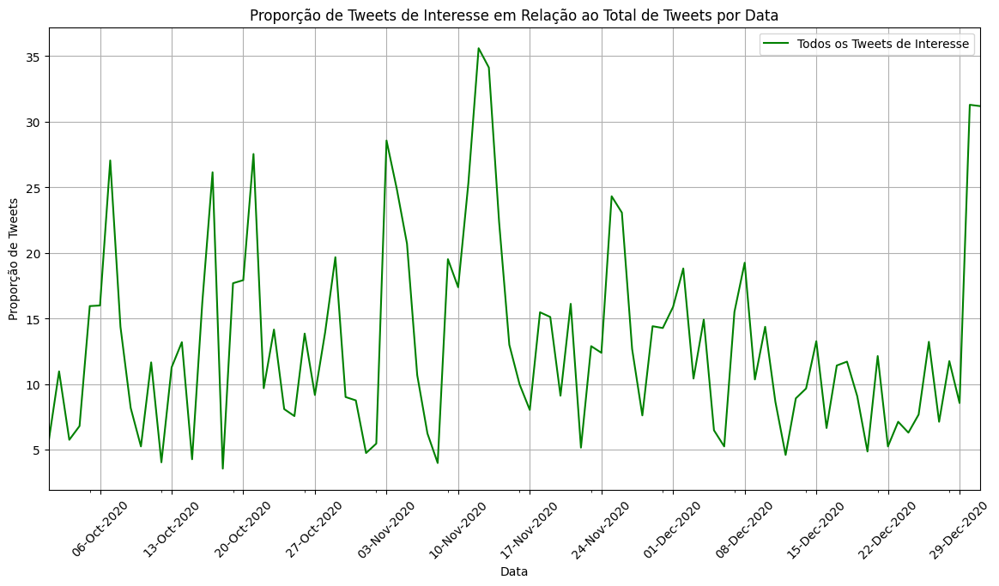

In [53]:
# Analisar a distribuição temporal dos tweets para identificar picos de atividade e ver se estão relacionados a eventos específicos.

import pandas as pd
import matplotlib.pyplot as plt

# Passo 1: Converter a coluna 'tweet_created_at' para o formato datetime
df['tweet_created_at'] = pd.to_datetime(df['tweet_created_at'])

# Passo 2: Filtrar apenas os tweets feministas
df_feminism['tweet_created_at'] = pd.to_datetime(df_feminism['tweet_created_at'])

# Passo 3: Contagem de todos os tweets por data
total_tweets_per_day = df.set_index('tweet_created_at').resample('D').size()

# Passo 4: Contagem de tweets feministas por data
feminist_tweets_per_day = df_feminism.set_index('tweet_created_at').resample('D').size()

# Passo 5: Calcular a proporção de tweets feministas em relação ao total de tweets por data
proportion_feminist_tweets_per_day = feminist_tweets_per_day / total_tweets_per_day

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Passo 1: Converter a coluna 'tweet_created_at' para o formato datetime
df['tweet_created_at'] = pd.to_datetime(df['tweet_created_at'])

# Passo 2: Filtrar apenas os tweets feministas
df_feminism['tweet_created_at'] = pd.to_datetime(df_feminism['tweet_created_at'])

# Passo 3: Contagem de todos os tweets por data
total_tweets_per_day = df.set_index('tweet_created_at').resample('D').size()

# Passo 4: Filtrar os tweets de usuários feministas e antifeministas
df_feminist_users = df_feminism[df_feminism['user_ideology_classification'].str.contains('feminista', case=False, na=False)]
df_antifeminist_users = df_feminism[df_feminism['user_ideology_classification'].str.contains('antifeminista', case=False, na=False)]

df_feminist_users_tt = df[df['user_ideology_classification'].str.contains('feminista', case=False, na=False)].set_index('tweet_created_at').resample('D').size()
df_antifeminist_users_tt = df[df['user_ideology_classification'].str.contains('antifeminista', case=False, na=False)].set_index('tweet_created_at').resample('D').size()

# Passo 5: Contagem de tweets feministas por data para cada grupo
feminist_users_tweets_per_day = df_feminist_users.set_index('tweet_created_at').resample('D').size()
antifeminist_users_tweets_per_day = df_antifeminist_users.set_index('tweet_created_at').resample('D').size()

# Passo 6: Calcular a proporção de tweets feministas em relação ao total de tweets por data para cada grupo
proportion_feminist_users_tweets_per_day = round(feminist_users_tweets_per_day / df_feminist_users_tt * 100, 2)
proportion_antifeminist_users_tweets_per_day = round(antifeminist_users_tweets_per_day / df_antifeminist_users_tt * 100, 2)

# Passo 7: Plotar as proporções ao longo do tempo
plt.figure(figsize=(14, 7))

# Linha para todos os tweets feministas
(proportion_feminist_tweets_per_day * 100).plot(label='Todos os Tweets de Interesse', color='green')

# Linha para tweets de usuários feministas
# proportion_feminist_users_tweets_per_day.plot(label='Tweets de Interesse de Usuários no Cluster Feministas', color='purple')

# Linha para tweets de usuários antifeministas
# proportion_antifeminist_users_tweets_per_day.plot(label='Tweets de Interesse de Usuários no Cluster Antifeministas', color='blue')

# Ajustes no eixo X para exibir corretamente as datas
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))  # Mostra as semanas
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b-%Y'))  # Formato de data dia-mês-ano

plt.title('Proporção de Tweets de Interesse em Relação ao Total de Tweets por Data')
plt.xlabel('Data')
plt.ylabel('Proporção de Tweets')
plt.grid(True)
plt.legend()
plt.xticks(rotation=45)  # Rotaciona as datas para melhor visualização
plt.show()



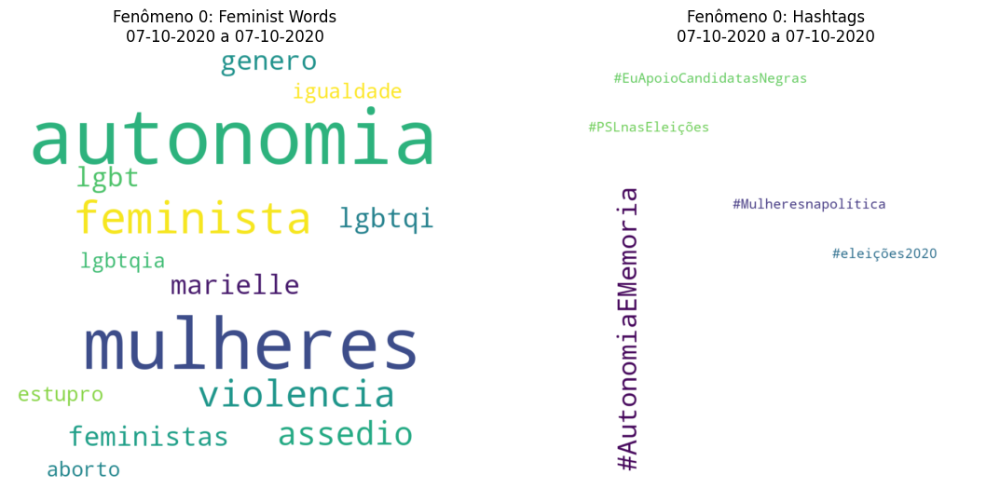

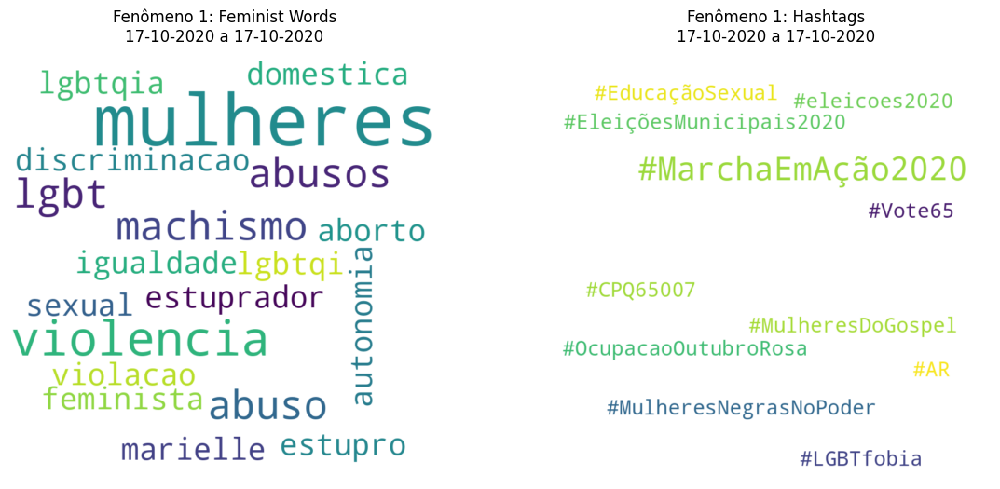

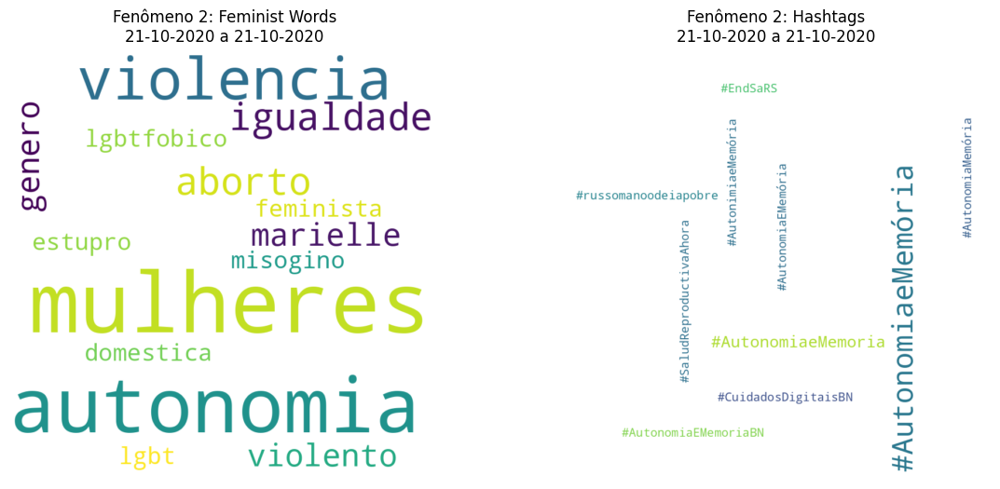

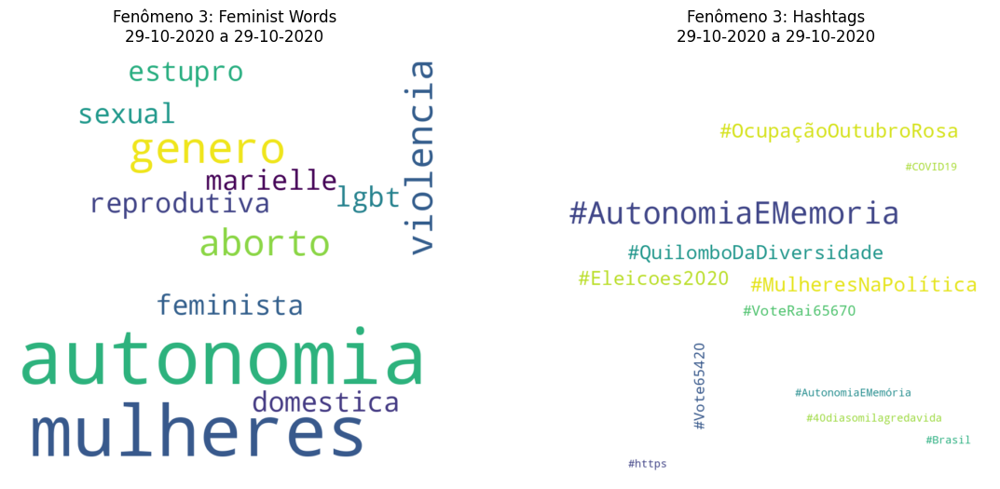

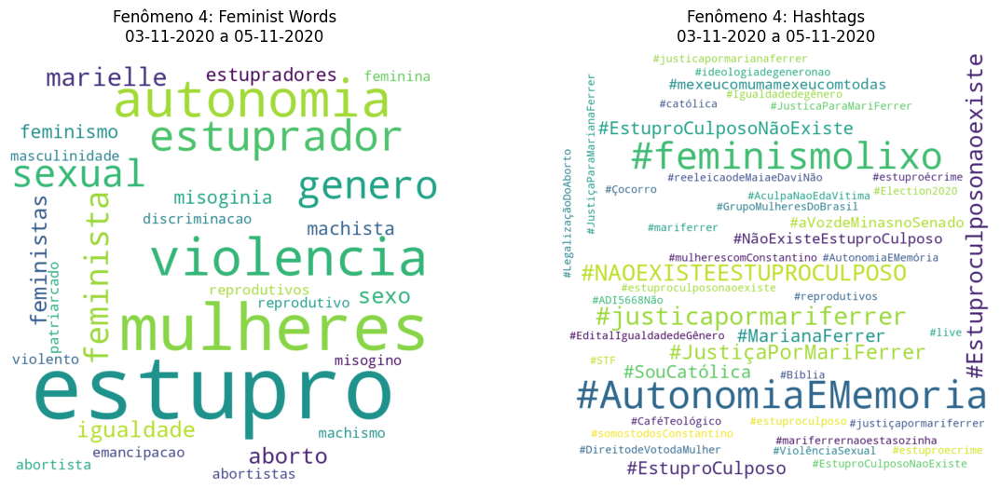

...

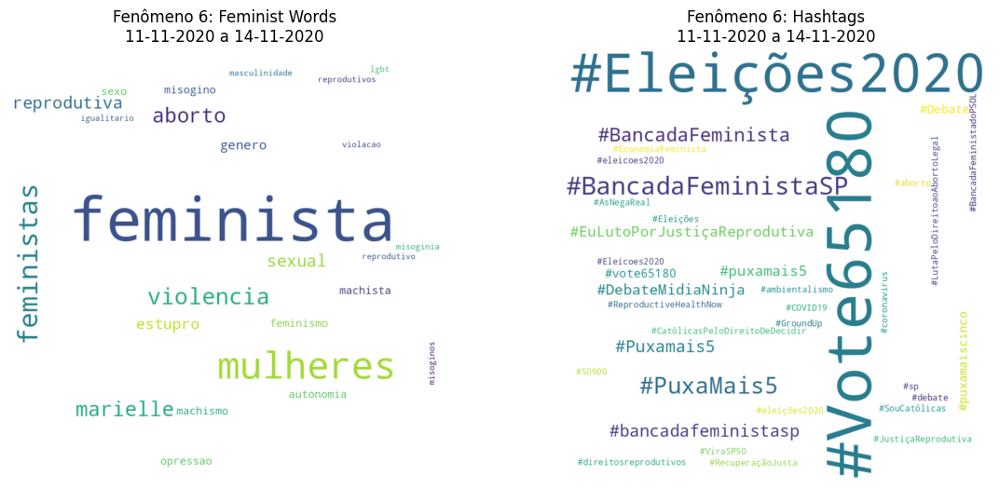

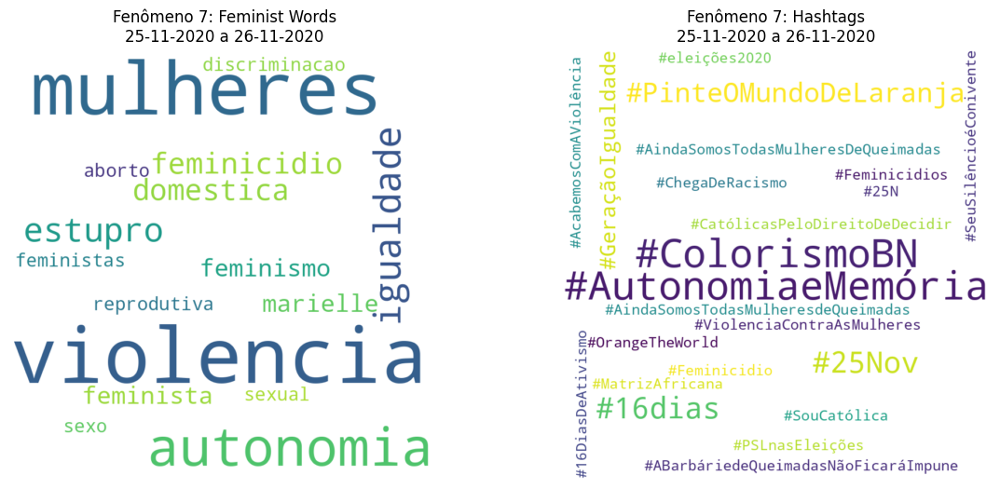

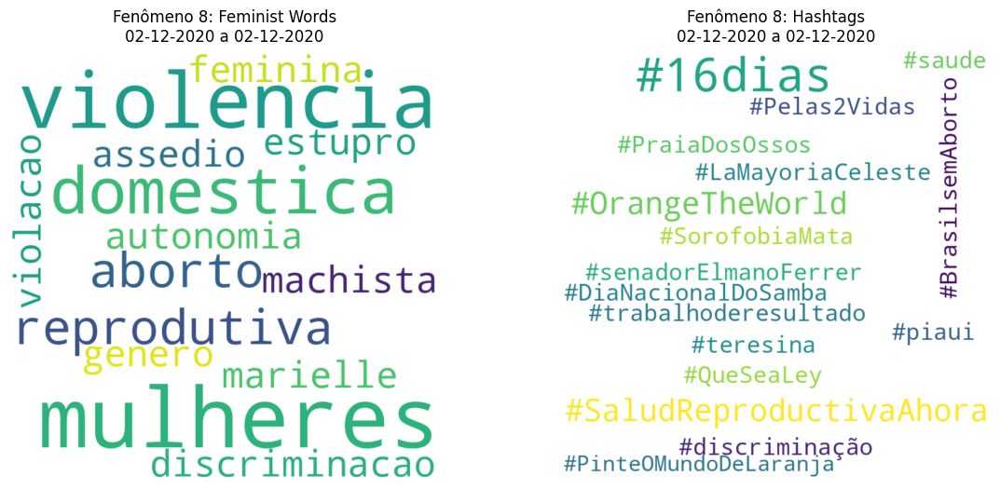

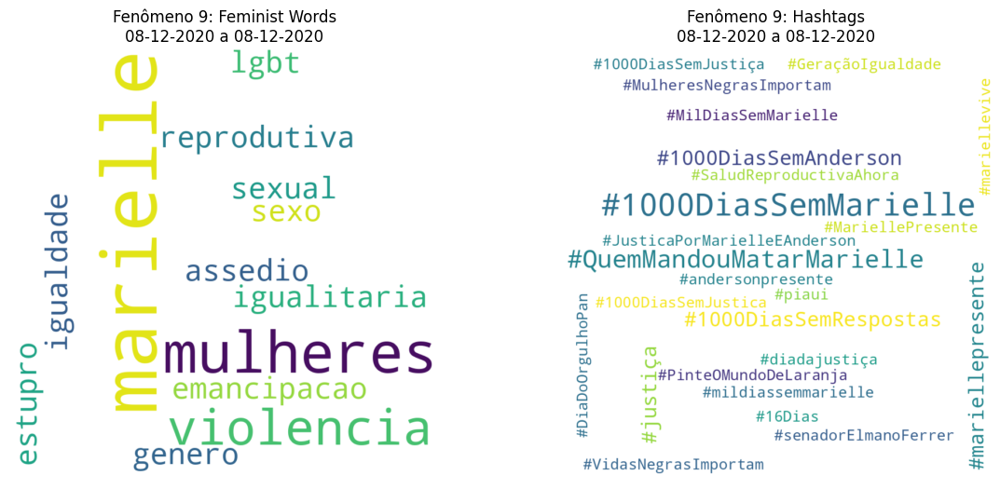

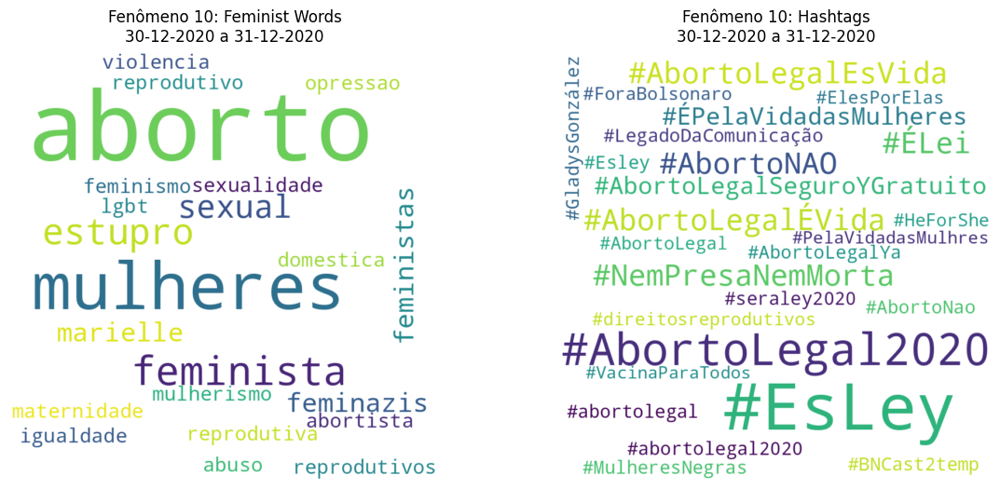

In [ ]:
# keywords e hashtags por dia fora da curva

from scipy.signal import find_peaks

# Identificando picos no gráfico de proporção de tweets feministas
peaks, _ = find_peaks(proportion_feminist_tweets_per_day, distance=5, height=0.18)  # Ajuste o valor de `height` conforme necessário

# Obter as datas correspondentes aos picos
# Filtrar os dias em que a proporção de tweets feministas é maior que 0.25
days_above_threshold = proportion_feminist_tweets_per_day[proportion_feminist_tweets_per_day > 0.18]

# Exibir os resultados
# days_above_threshold

import pandas as pd

# Considerando que 'days_above_threshold' é a série com as datas filtradas
# Criando um DataFrame para facilitar o processamento
df_above_threshold = days_above_threshold.reset_index()

# Criando uma coluna para identificar grupos de dias consecutivos
df_above_threshold['group'] = (df_above_threshold['tweet_created_at'].diff().dt.days > 1).cumsum()

# Agrupando por esses grupos
groups = df_above_threshold.groupby('group')['tweet_created_at'].apply(list)

# print(groups)

from collections import Counter

# Analisando os tópicos para cada grupo de dias consecutivos
# for i, days in groups.items():
#     # Filtrar os tweets desses dias
#     df_group = df_feminism[df_feminism['tweet_created_at'].dt.date.isin(pd.to_datetime(days).date)]
    
#     # Contar as palavras relacionadas ao feminismo
#     feminist_words = Counter()
#     for words_list in df_group['tweet_feminist_words_clean'].dropna():
#         words = words_list.split()  # Dividindo as palavras na string
#         feminist_words.update(words)
    
#     # Contar as hashtags mais usadas
#     hashtags = Counter()
#     for hashtags_list in df_group['tweet_hashtags'].dropna():
#         hashtags.update(hashtags_list)  # Já é uma lista, então apenas atualizamos o Counter
    
#     # Exibir os tópicos principais para o grupo
#     print(f"Fenômeno {i}:")
#     print("Palavras feministas mais comuns:", feminist_words.most_common(10))
#     print("Hashtags mais comuns:", hashtags.most_common(10))
#     print("\n")

from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Função para criar e exibir as nuvens de palavras
def create_wordclouds(feminist_words, hashtags, phenomenon_number, days):
    # Criando a word cloud para feminist_words
    wordcloud_feminist_words = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(feminist_words)
    
    # Criando a word cloud para hashtags
    wordcloud_hashtags = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(hashtags)
    
    # Plotando as word clouds lado a lado
    plt.figure(figsize=(14, 6))

    # Word cloud para feminist_words
    plt.subplot(1, 2, 1)
    plt.imshow(wordcloud_feminist_words, interpolation='bilinear')
    plt.title(f'Fenômeno {phenomenon_number}: Feminist Words\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
    plt.axis('off')

    # Word cloud para hashtags
    plt.subplot(1, 2, 2)
    plt.imshow(wordcloud_hashtags, interpolation='bilinear')
    plt.title(f'Fenômeno {phenomenon_number}: Hashtags\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
    plt.axis('off')

    plt.show()

# Gerando as word clouds para cada fenômeno
for i, days in groups.items():
    # Filtrar os tweets desses dias
    df_group = df_feminism[df_feminism['tweet_created_at'].dt.date.isin(pd.to_datetime(days).date)]
    
    # Contar as palavras relacionadas ao feminismo
    feminist_words = Counter()
    for words_list in df_group['tweet_feminist_words_clean'].dropna():
        words = words_list.split()  # Dividindo as palavras na string
        feminist_words.update(words)
    
    # Contar as hashtags mais usadas
    hashtags = Counter()
    for hashtags_list in df_group['tweet_hashtags'].dropna():
        hashtags.update(hashtags_list)  # Já é uma lista, então apenas atualizamos o Counter
    
    # Criar e exibir as word clouds para o fenômeno atual
    create_wordclouds(feminist_words, hashtags, i, days)





Fenômeno 1 (2020-10-07 a 2020-10-07):
Hashtags mais numerosas: ['#PSLnasEleições', '#eleições2020', '#Mulheresnapolítica']


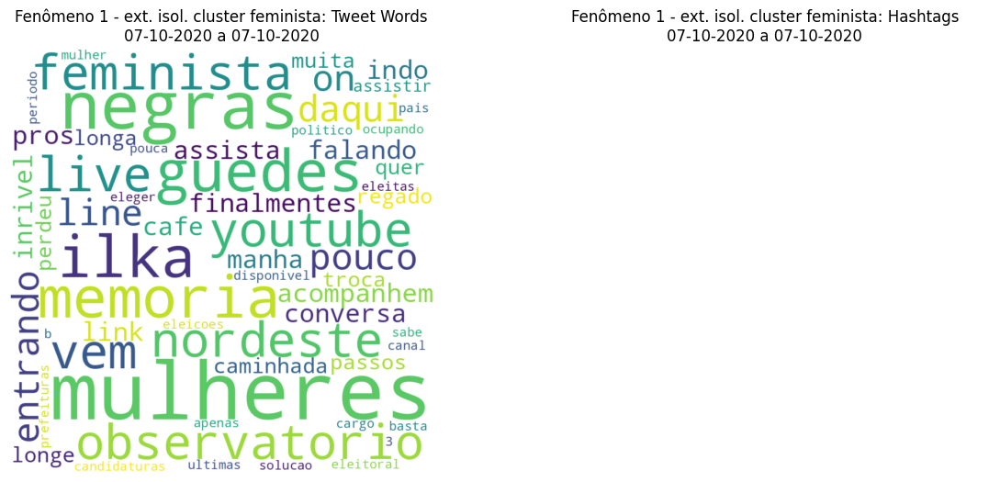

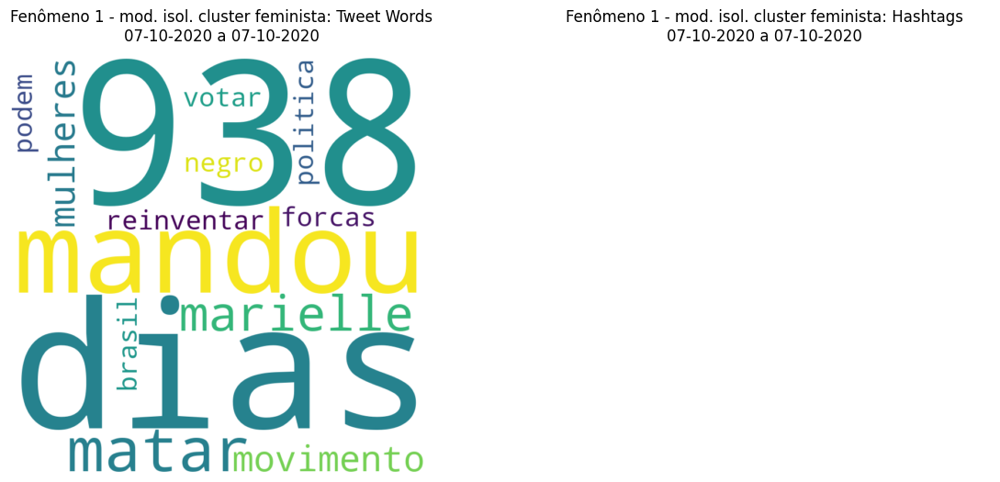

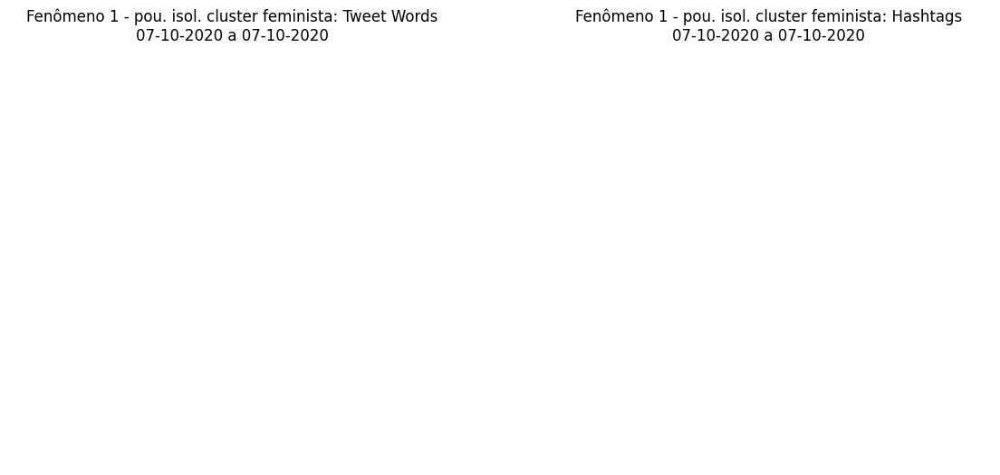

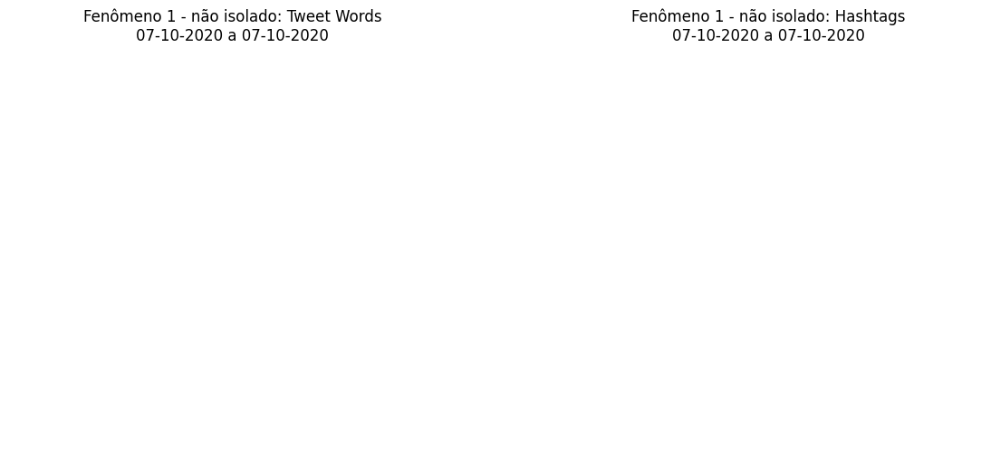

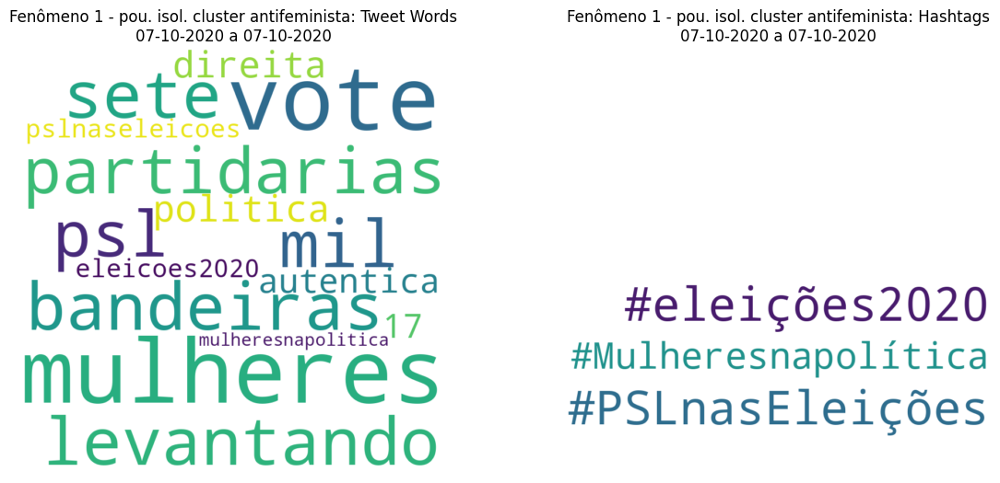

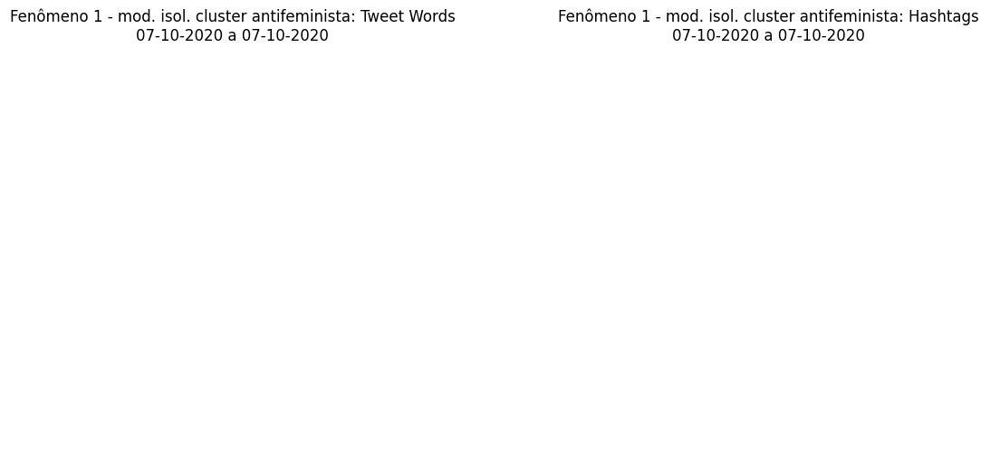

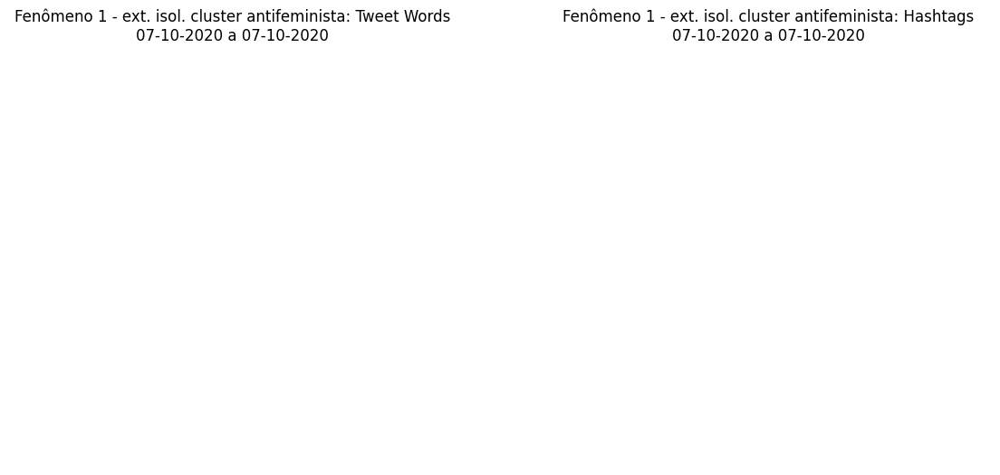

,tweet_text,user_ideology_classification
830,"São mais de sete mil mulheres levantando as bandeiras partidárias do PSL. Por mais mulheres na política, vote na direita autêntica. Vote 17! #PSLnasEleições #eleições2020 #Mulheresnapolítica",antifeminista centro
672,"Daqui a pouco estamos entrando on-line no YouTube na live sobre Memória com Mulheres Negras, com Ilka Guedes! Acompanhem no link: https://t.co/7GUHu5DXgE https://t.co/yMuIdYhohp",feminista extrema
687,"Estamos com Ilka Guedes, do Observatório Feminista do Nordeste falando sobre a memória das mulheres negras, vem! https://t.co/FSTv8aj9Wy",feminista extrema
704,"Estamos indo pros finalmentes: assista depois nossa live inrível com Ilka Guedes, do Observatório Feminista do Nordeste https://t.co/FSTv8aj9Wy",feminista extrema
717,"Nossa conversa sobre memória das mulheres negras de hoje com café da manhã foi regado por muita troca de uma longa caminhada, de passos que vêm de longe 🍃\r\nPra quem perdeu e quer assistir tá disponível no nosso canal do YouTube https://t.co/7GUHu5DXgE ✨ https://t.co/dmeYs6fcdY",feminista extrema
762,Estamos em período eleitoral e a gente sabe que tem pouca mulher ocupando cargo político. Qual a solução pra isso? Basta eleger mulheres? Que mulheres? https://t.co/T6k0z3s7Mk,feminista extrema
795,"RT @franca_rodrigo: Nas últimas eleições para Prefeituras do país, apenas 3% das candidaturas eleitas foram de mulheres negras. Temos que b…",feminista extrema
662,938 dias.\r\nQuem mandou matar Marielle?\r\nE por quê?,feminista moderada
751,RT @brumelianebrum: 938 dias.\r\nQuem mandou matar Marielle?\r\nE por quê?,feminista moderada
752,RT @pedroabramovay: O movimento negro e o movimento de mulheres são as forças que podem reinventar a política no Brasil. Votar em mulheres…,feminista moderada



Fenômeno 2 (2020-10-17 a 2020-10-17):
Hashtags mais numerosas: ['#AR', '#MulheresDoGospel', '#OcupacaoOutubroRosa', '#Vote65', '#MulheresNegrasNoPoder', '#eleicoes2020', '#CPQ65007']


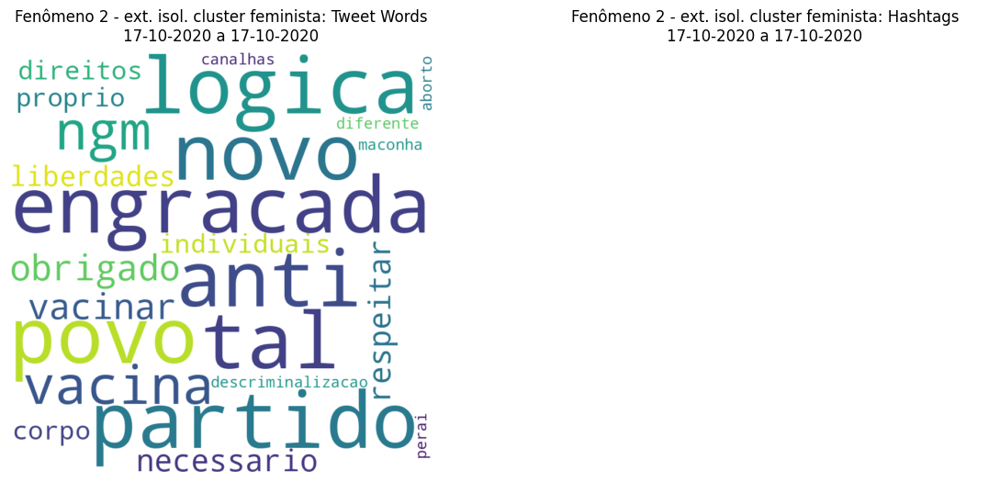

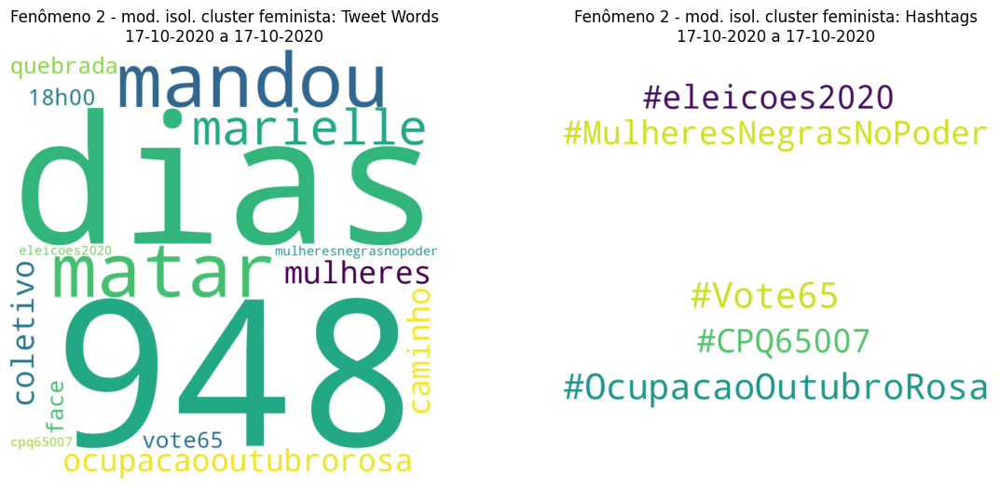

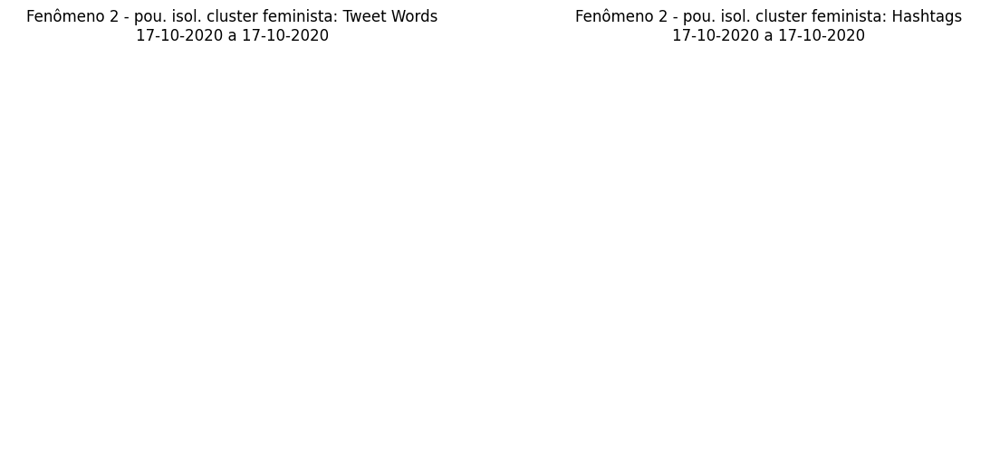

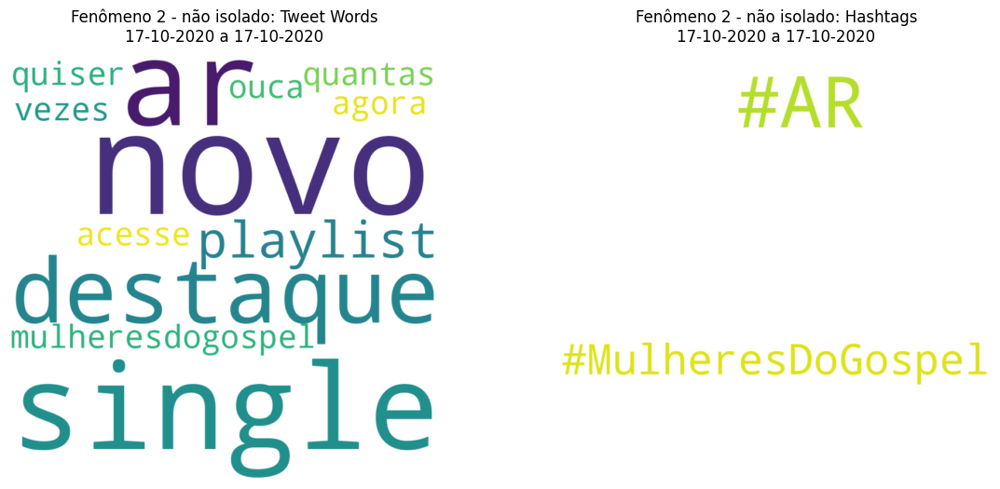

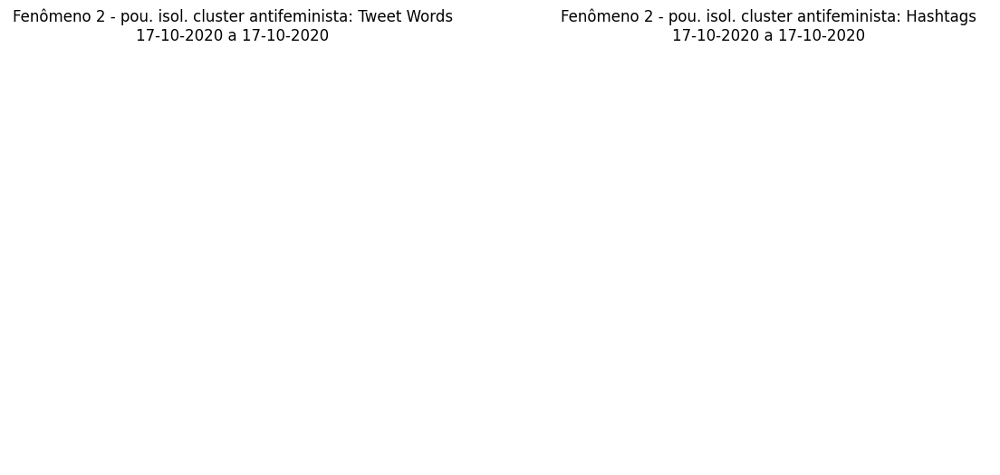

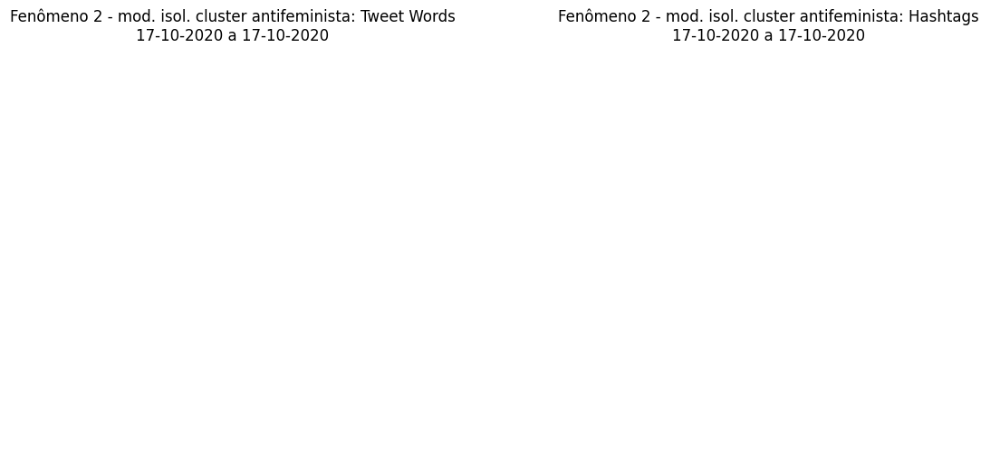

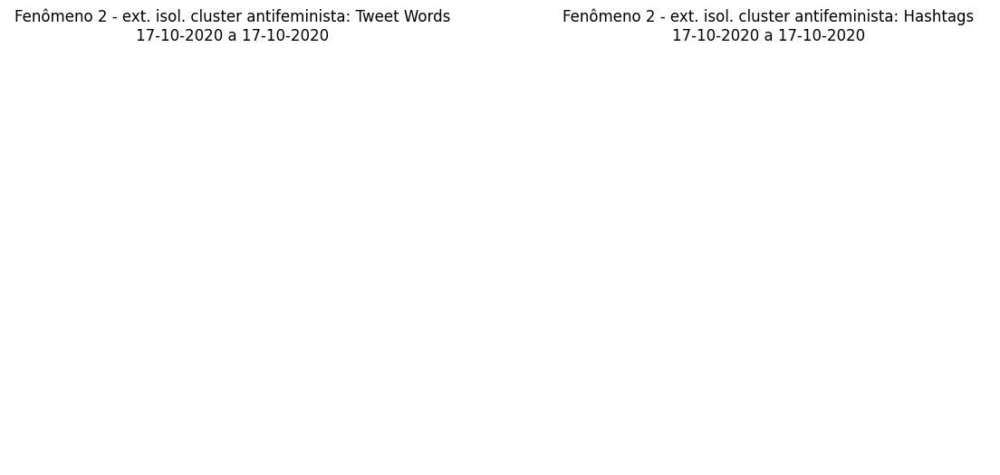

,tweet_text,user_ideology_classification
1930,Meu novo single #AR é destaque na playlist #MulheresDoGospel do @spotifybrasil! Acesse agora e ouça quantas vezes quiser https://t.co/nVxMCtM2jK https://t.co/uP8c7TPL85,centro
1970,"Engraçada essa lógica do tal partido ""Novo""\r\n\r\nSobre o povo anti-vacina: ""ngm é obrigado a se vacinar, é necessário respeitar as liberdades individuais e os direitos sobre o próprio corpo""\r\n\r\nSobre a descriminalização do aborto e da maconha: NÃO MAS PERAI ISSO É DIFERENTE\r\n\r\nCanalhas. https://t.co/X6IM2sZHQ5",feminista extrema
1924,948 dias.\r\nQuem mandou matar Marielle?\r\nE por quê?,feminista moderada
1936,É hoje! #OcupacaoOutubroRosa com as mulheres do Coletivo O Caminho é Pela Quebrada! Vai ser às 18h00 aqui no nosso Face 😉\r\n\r\n#Vote65 #MulheresNegrasNoPoder #eleicoes2020 #CPQ65007 https://t.co/ri2f3TXGEr,feminista moderada



Fenômeno 3 (2020-10-21 a 2020-10-21):
Hashtags mais numerosas: ['#AutonomiaeMemória', '#AutonomiaeMemoria', '#AutonomiaMemória', '#AutonimiaeMemória', '#EndSaRS', '#AutonomiaEMemoriaBN', '#CuidadosDigitaisBN']


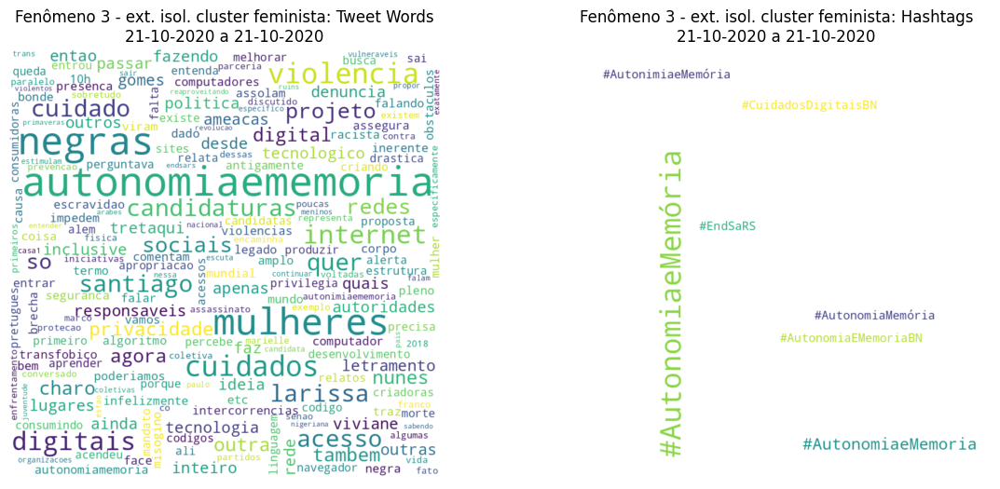

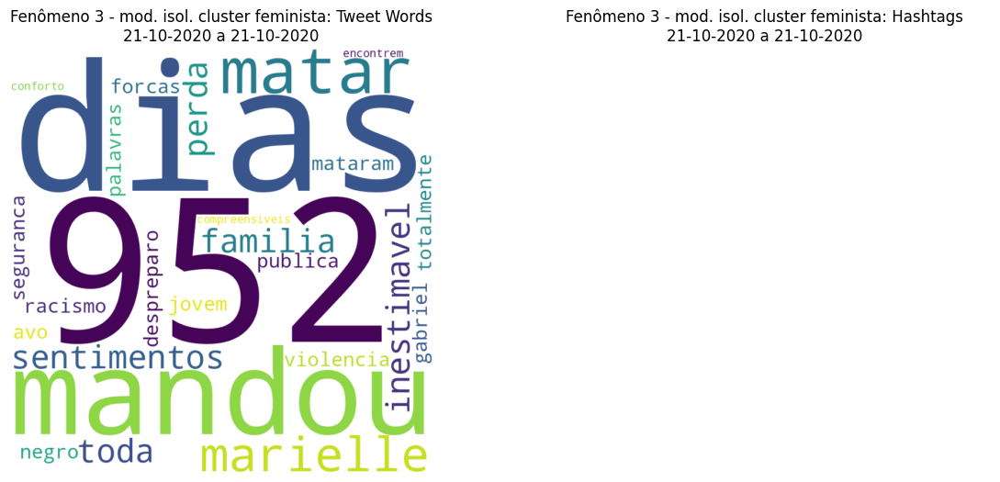

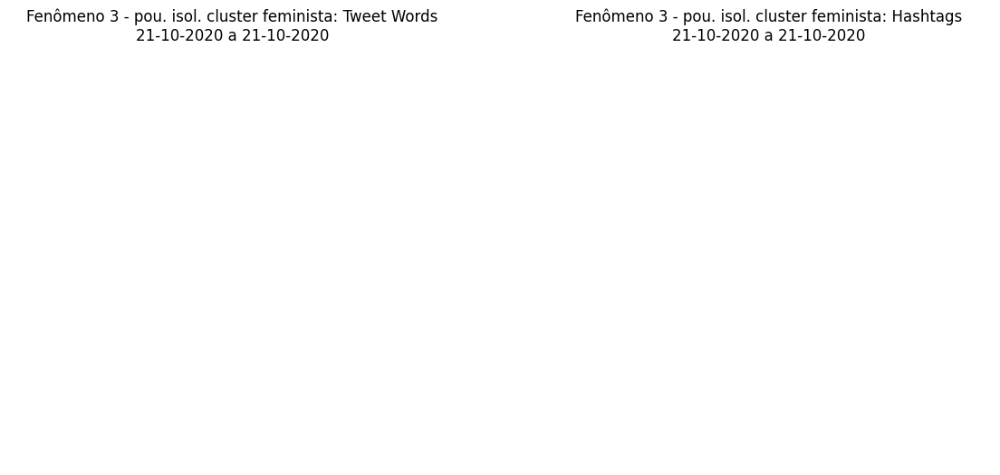

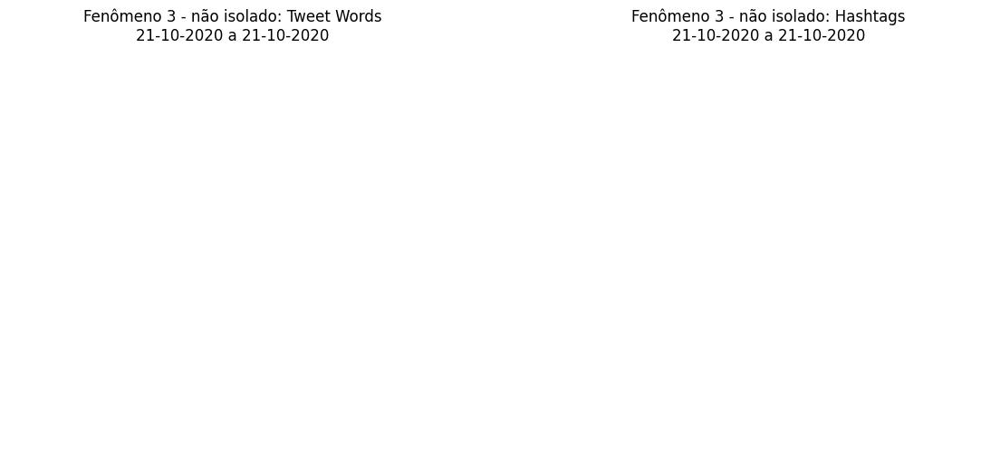

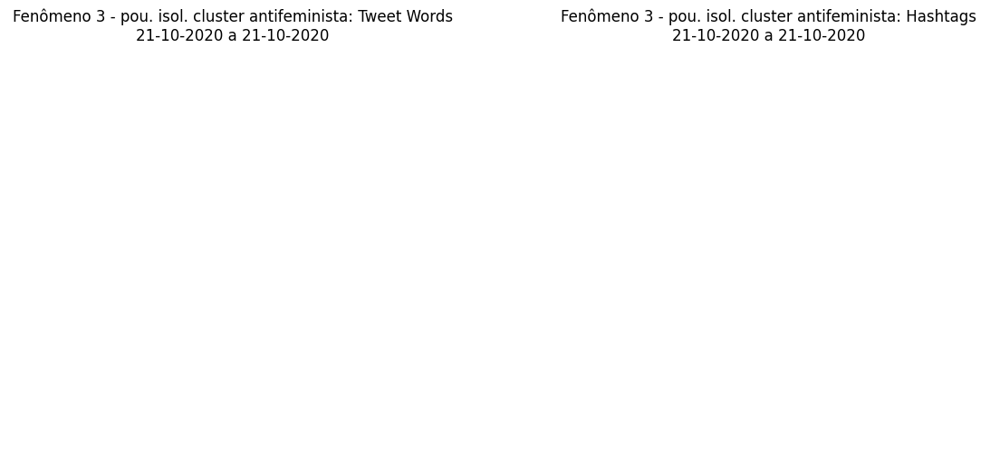

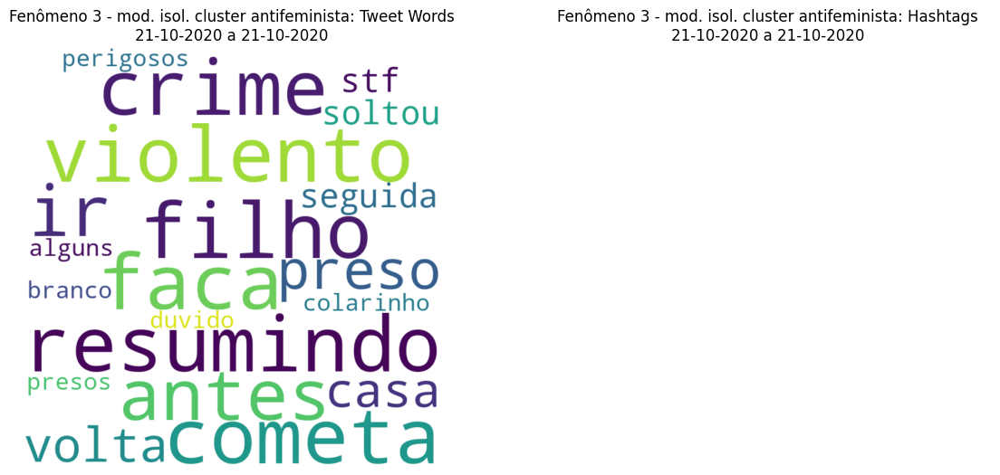

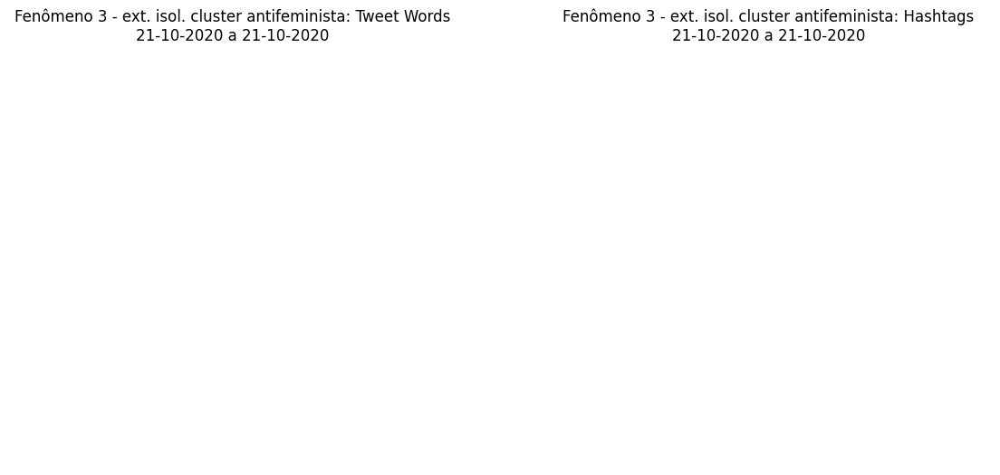

,tweet_text,user_ideology_classification
2413,"Resumindo: cometa um crime não violento, faça um filho antes de ir preso que você já volta pra casa em seguida. \r\n\r\nDepois que o STF soltou perigosos presos e até alguns de colarinho branco, não duvido de mais nada.\r\n\r\nhttps://t.co/SPGRJZh9jA",antifeminista moderada
2384,"Pra quem perdeu a live sobre cuidados digitais para mulheres negras, com as coordenadoras BN Larissa Santiago, Charo Nunes e Viviane Gomes, tá disponível no nosso canal do Youtube no link: https://t.co/cd9AKFxjCJ ⚡\r\n\r\n#AutonomiaEMemoriaBN\r\n#CuidadosDigitaisBN https://t.co/KuZtMu9bUf",feminista extrema
2359,"""A gente tem que entender como a gente faz outras primaveras de mulheres, árabes, outros #EndSaRS que é essa revolução que a juventude nigeriana tá fazendo pelo país inteiro com a ajuda das redes sociais, outro Black Lives Matter, pq o BLM continua pressionando as autoridades+",feminista extrema
2358,"+ de então, pra gente propor se a gente quer sair, ou se a gente quer continuar nessa rede reaproveitando esses lugares, mesmo sabendo que eles são lugares violentos e ruins"" Larissa Santiago sobre cuidados digitais para mulheres negras\r\n\r\n#AutonomiaeMemória",feminista extrema
2353,"""Exatamente agora os meninos da Casa1, de São Paulo, estão fazendo agora o projeto Escuta Candidata, um projeto nacional, que também não é específico para mulheres negras, mas é para candidaturas vulneráveis, de mulheres trans, negras, coletivas""\r\n\r\n#AutonomiaeMemória",feminista extrema
2352,"""hoje existem algumas poucas iniciativas, que não são voltadas apenas pra candidaturas de mulheres negras, o Me Representa, por exemplo, tem um projeto paralelo que é o Tretaqui"", em parceria com outras organizações que falam sobre violência política e que estimulam a denúncia +",feminista extrema
2351,"+ a denúncia política, e o Tretaqui encaminha às autoridades pra fazer um enfrentamento a essa violência""\r\n\r\nLarissa Santiago sobre cuidados para candidaturas negras\r\n\r\n#AutonomiaeMemória",feminista extrema
2350,"""O que a gente tem conversado, inclusive, é sobre como os partidos são co-responsáveis, senão responsáveis primeiros, pela proteção e pelo cuidado da vida dessas mulheres, sobretudo"" Larissa Santiago sobre o cuidado em candidaturas negras\r\n\r\n#AutonomiaeMemória",feminista extrema
2347,"""Especificamente a gente ainda não tem um projeto de prevenção contra violência para candidaturas de mulheres negras, ou coletiva de pessoas negras, o que o fato é que a gente tem discutido isso desde 2018, e o marco foi a violência física do assassinato de Marielle Franco""",feminista extrema
2346,"""Foi ali que acendeu o alerta para as candidatas negras sobre violência. Hoje, a gente tem relatos, inclusive de @taliriapetrone que relata ameaças de morte desde o seu primeiro mandato""\r\n\r\n#AutonimiaeMemória",feminista extrema



Fenômeno 4 (2020-11-03 a 2020-11-05):
Hashtags mais numerosas: ['#estuproculposonaoexiste', '#estuproécrime', '#estuproecrime', '#mariferrer', '#MarianaFerrer', '#mariferrernaoestasozinha', '#GrupoMulheresDoBrasil']


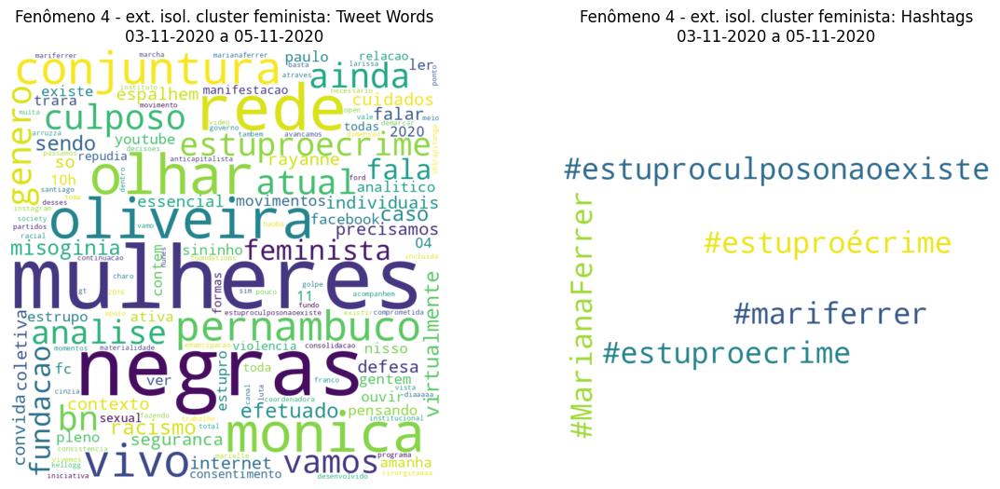

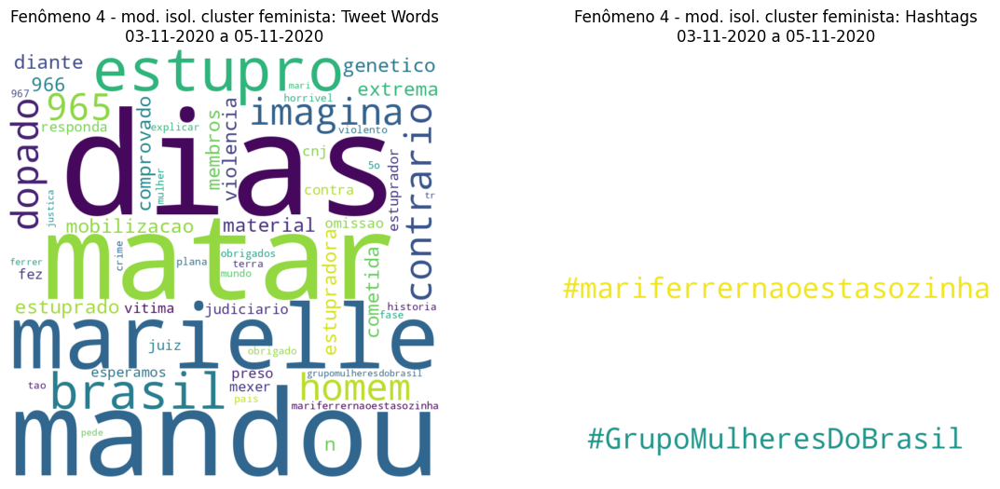

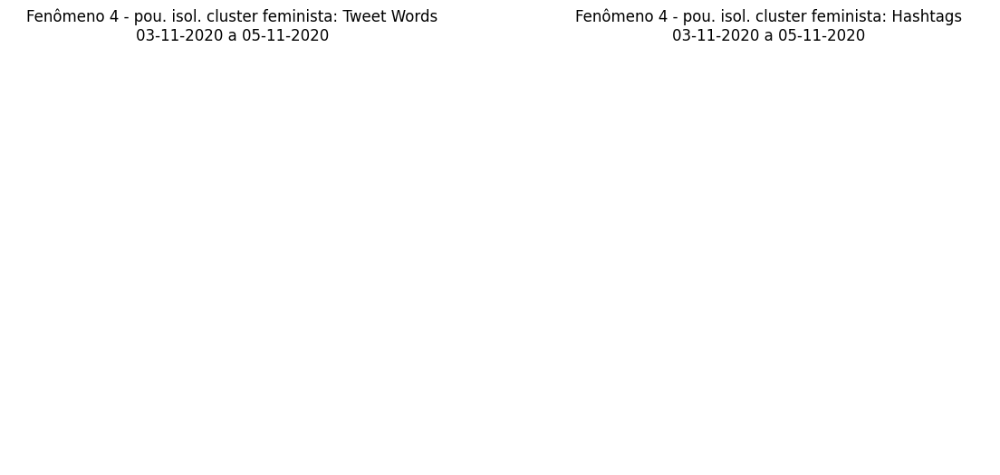

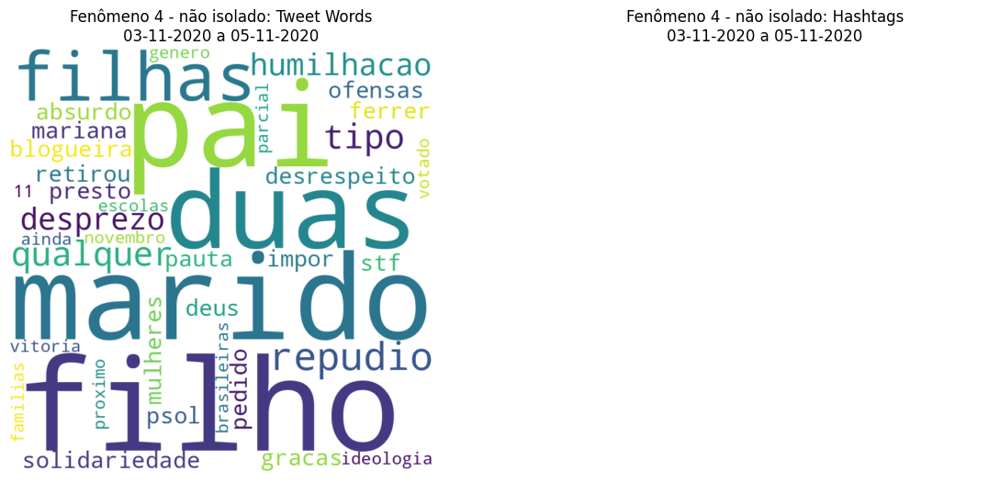

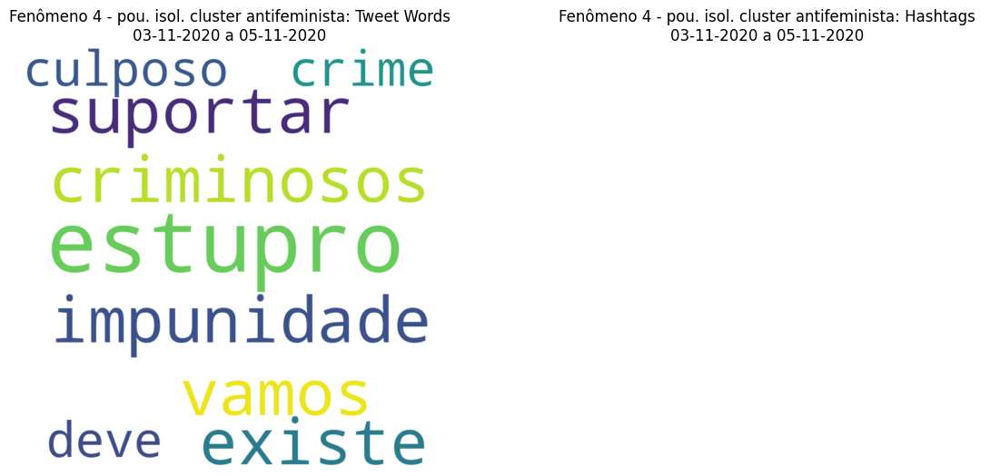

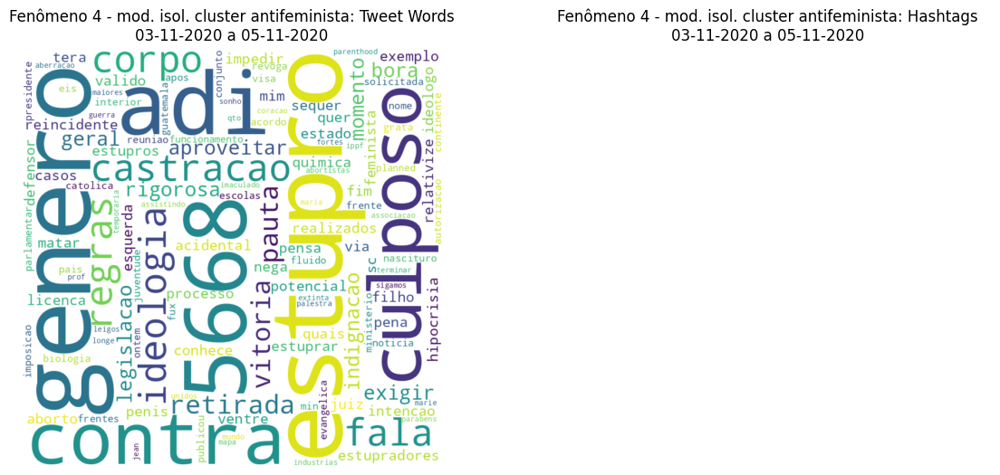

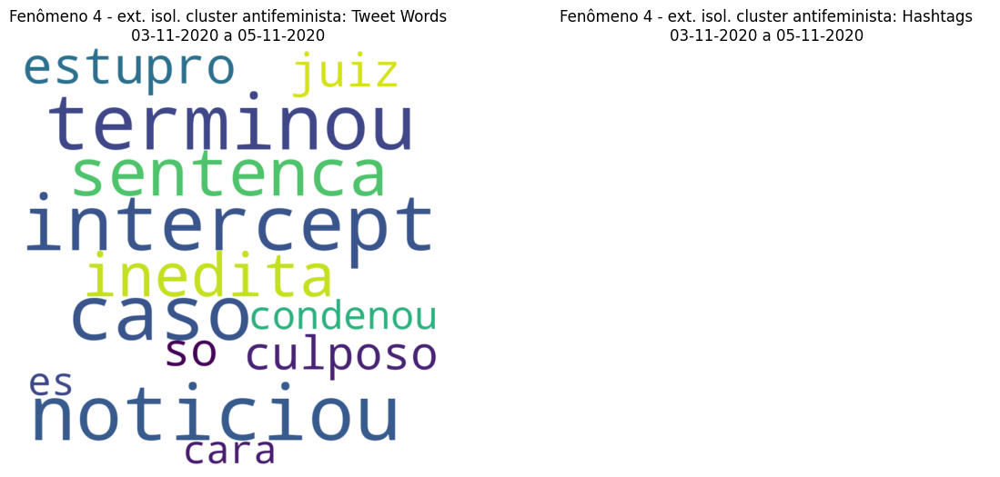

,tweet_text,user_ideology_classification
4091,"RT @pslmulherbrasil: Até quando vamos ter que suportar a impunidade de criminosos? Não existe Estupro Culposo. Estupro é crime, que deve se…",antifeminista centro
3962,RT @oiIuiz: O Intercept noticiou que o caso terminou com uma “sentença inédita de estupro culposo”\r\n\r\nSó que o juiz não condenou o cara em es…,antifeminista extrema
4139,"A hipocrisia da esquerda não tem fim...\r\nAborto: “Meu corpo, minhas regras” - Fala a feminista que quer “licença” para matar seu filho no ventre.\r\nGênero: “Nosso corpo, as regras do Estado” - Pensa o ideólogo e defensor da ADI 5668 que nega a biologia em nome de um “gênero fluido”.",antifeminista moderada
3916,NÃO RELATIVIZE O ESTUPRO! https://t.co/sT8r9Hs9Tz,antifeminista moderada
3911,"Está no processo mas não no juiz: Em SC, “estupro culposo”. Sem intenção de estuprar? Acidental? https://t.co/Cqa9Lp69LS via @YouTube",antifeminista moderada
4277,"Na Associação de Leigos - Imaculado Coração de Maria -, assistindo a uma palestra sobre a ideologia de gênero. Vitória temporária qto à retirada de pauta da ADI 5668... mas a guerra contra essa aberração está longe de terminar. Sigamos fortes e unidos! Parabéns, Prof. Jean Marie! https://t.co/5F6aNpqid6",antifeminista moderada
4155,"Eis uma grata notícia: a ADI 5668, que visa a imposição da ideologia de gênero nas escolas do nosso país, foi retirada de pauta após reunião com o Min. Fux solicitada pela Frente Parlamentar pela Juventude, da qual sou Presidente, em conjunto com as Frentes Católica e Evangélica.",antifeminista moderada
3816,@likruby Fala pra mim quais casos você conhece de estupros realizados sem o pênis?,antifeminista moderada
3812,"Bora aproveitar esse momento de indignação geral sobre o ""estupro culposo"" e exigir uma legislação mais rigorosa contra estupradores? Castração química, por exemplo.",antifeminista moderada
4258,"Mais uma vitória do nascituro em nosso continente: o Ministério do Interior da Guatemala publicou ontem um acordo que revoga a autorização para o funcionamento da Planned Parenthood, uma das maiores indústrias abortistas do mundo! Meu sonho é que a IPPF seja extinta do mapa!",antifeminista moderada



Fenômeno 5 (2020-11-11 a 2020-11-14):
Hashtags mais numerosas: ['#Vote65180', '#Eleições2020', '#BancadaFeministaSP', '#PuxaMais5', '#BancadaFeminista', '#bancadafeministasp', '#Puxamais5', '#puxamais5', '#DebateMidiaNinja', '#puxamaiscinco', '#vote65180', '#Debate', '#eleicoes2020', '#sp', '#GroundUp', '#Eleicoes2020', '#debate', '#Eleições', '#eleições2020', '#AsNegaReal']


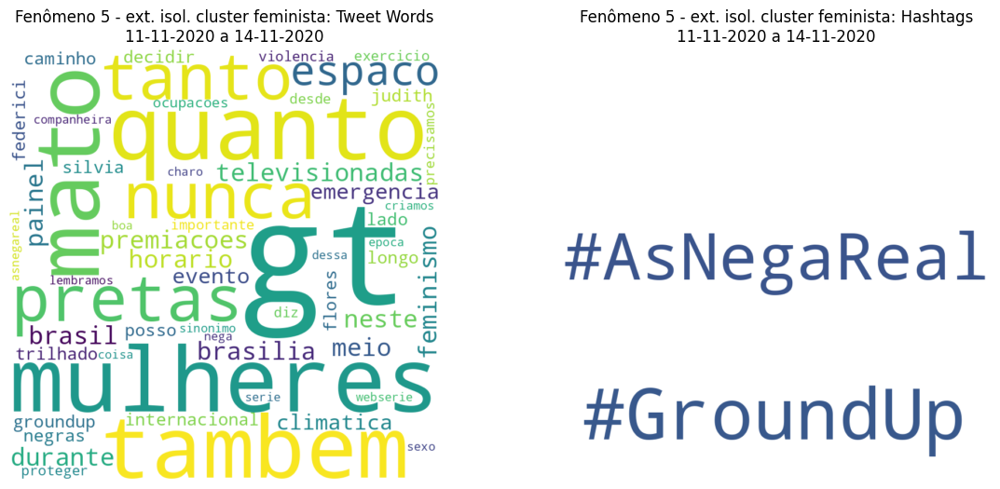

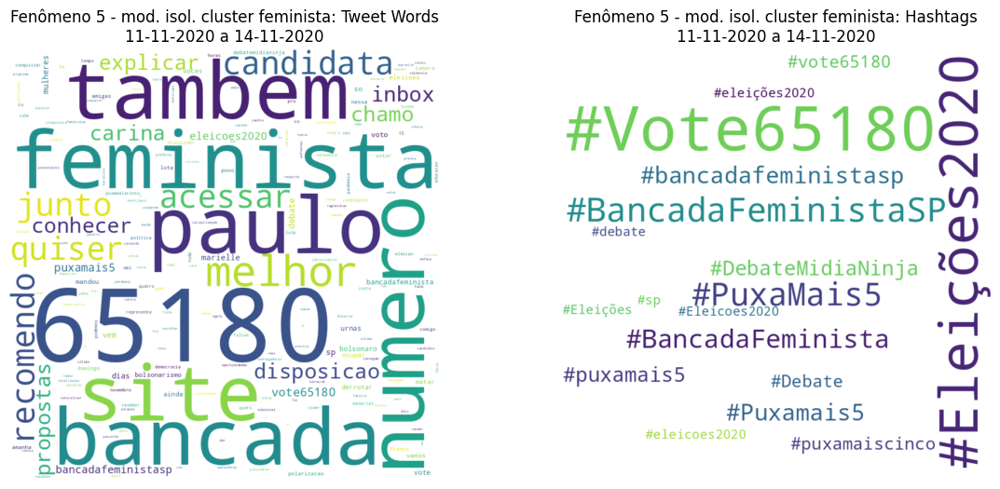

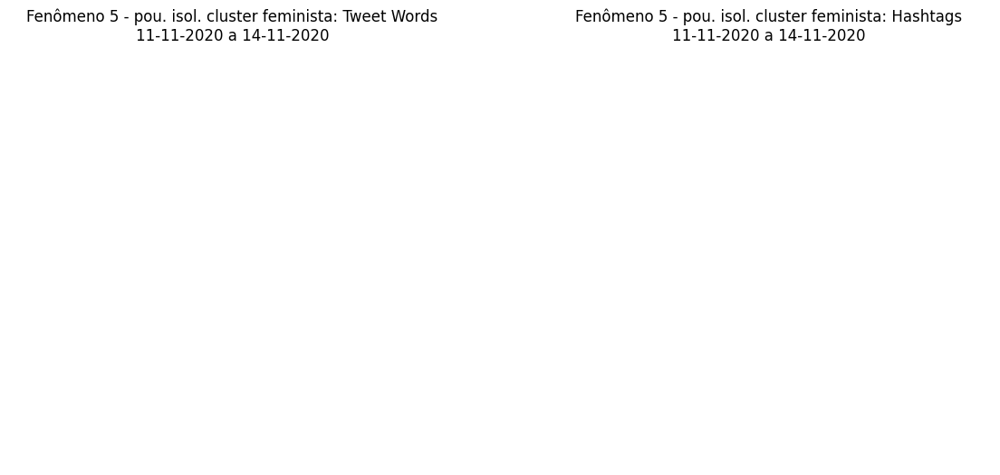

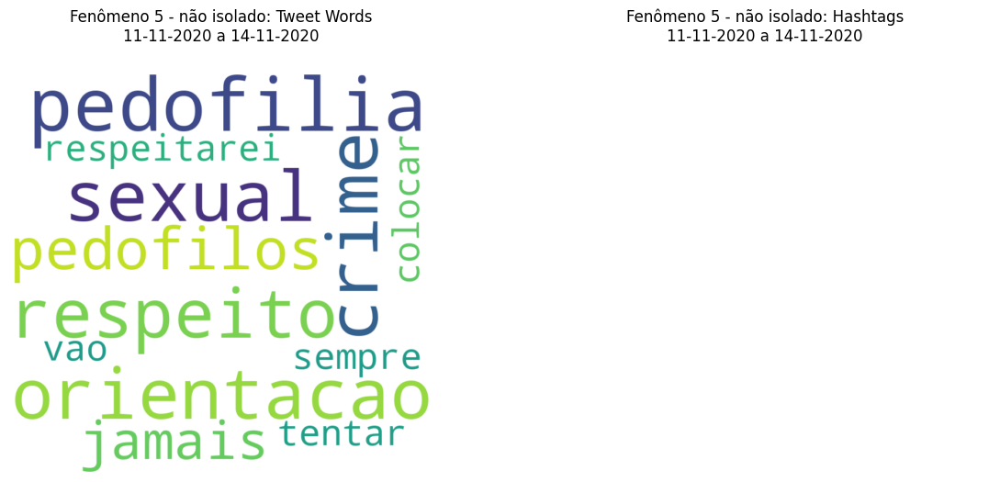

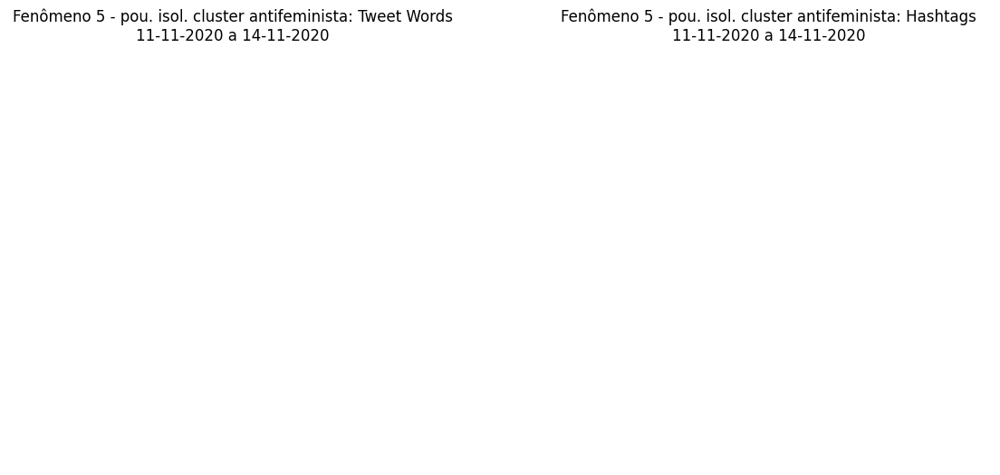

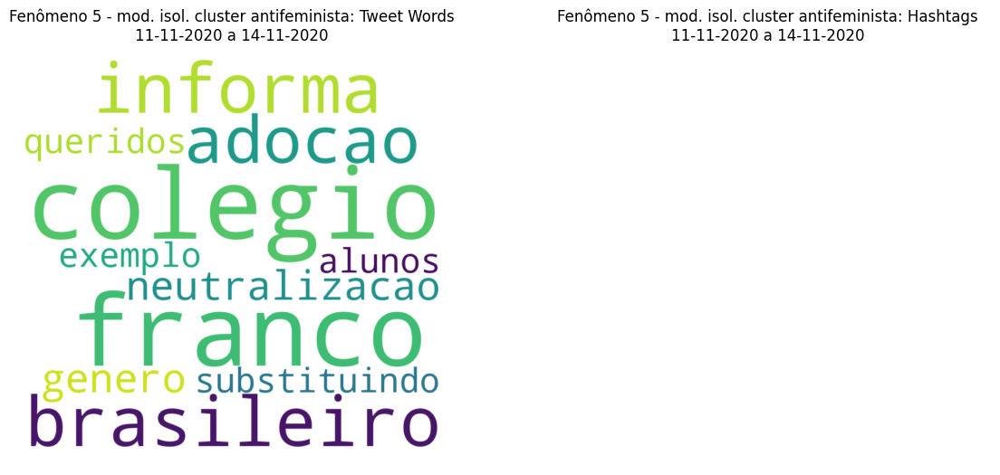

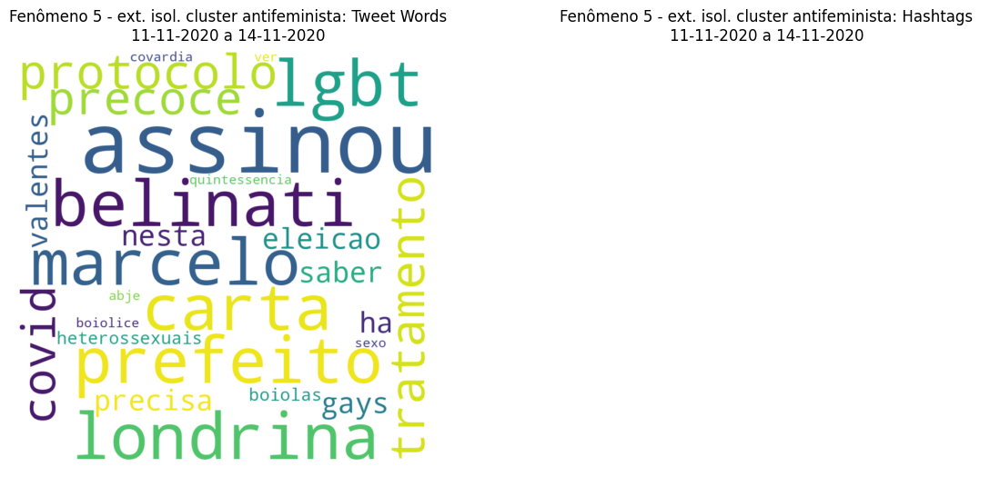

,tweet_text,user_ideology_classification
5442,"O prefeito de Londrina, Marcelo Belinati, assinou a carta LGBT mas não assinou o protocolo do tratamento precoce da Covid.\r\nIsso é tudo que você precisa saber dele nesta eleição.",antifeminista extrema
5528,RT @silviogrimaldo: Há gays valentes e heterossexuais boiolas. A quintessência da boiolice não tem nada a ver com sexo. É uma covardia abje…,antifeminista extrema
5088,"RT @GFiuza_Oficial: O Colégio Franco Brasileiro informa a adoção de ""neutralização de gênero"" - substituindo por exemplo ""queridos alunos""…",antifeminista moderada
5379,"RT @ArthurWeint: Pedofilia não é orientação sexual. É crime! Não respeito pedófilos, jamais respeitarei. Vão sempre tentar colocar isso com…",centro
5106,"RT @POPline: Mulheres pretas nunca tiveram tanto espaço em premiações televisionadas no Brasil quanto neste ano. @IzaReal , @Ludmilla , @Te…",feminista extrema
...,...,...
5171,"@willgomes Me chamo Carina e sou candidata em São Paulo junto a Bancada Feminista! Nosso número é o 65180. Pra quem quiser conhecer, recomendo acessar o site e estou à disposição pra explicar melhor nossas propostas no inbox também!\r\n\r\nhttps://t.co/LAEj038QPh",feminista moderada
5203,"Essa semana perdemos o Cadu Barcellos, vítima da violência no Rio de Janeiro. Ele deixa saudades em todo mundo. Não podemos aliviar a dor que essa perda gera na família, mas podemos nos unir para ajudar seu filho de 2 anos, Bernardo: https://t.co/gtLIfYzAiX\r\n\r\n1/2",feminista moderada
5218,Você não precisa escolher! Vem com a @bfeministasp e eleja quatro mulheres de luta para transformar São Paulo! https://t.co/1KJCt3SqVD,feminista moderada
5158,"@Rafaelbatistat Me chamo Carina e sou candidata em São Paulo junto a Bancada Feminista! Nosso número é o 65180. Pra quem quiser conhecer, recomendo acessar o site e estou à disposição pra explicar melhor nossas propostas no inbox também!\r\n\r\nhttps://t.co/LAEj038QPh",feminista moderada



Fenômeno 6 (2020-12-30 a 2020-12-31):
Hashtags mais numerosas: ['#AbortoNAO', '#AbortoNao']


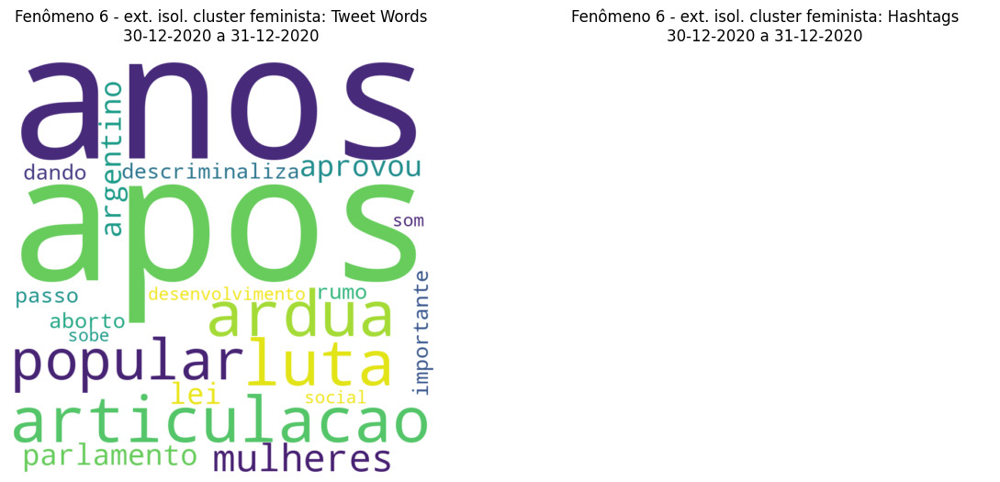

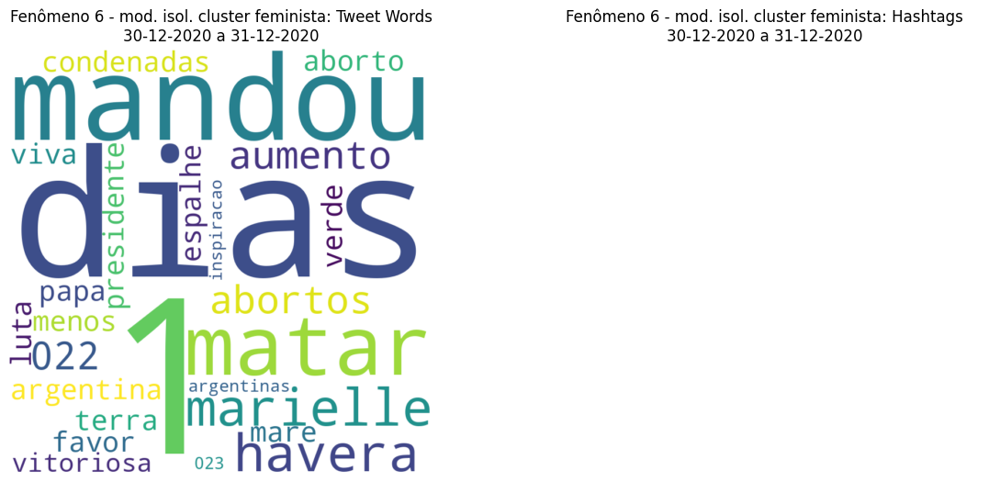

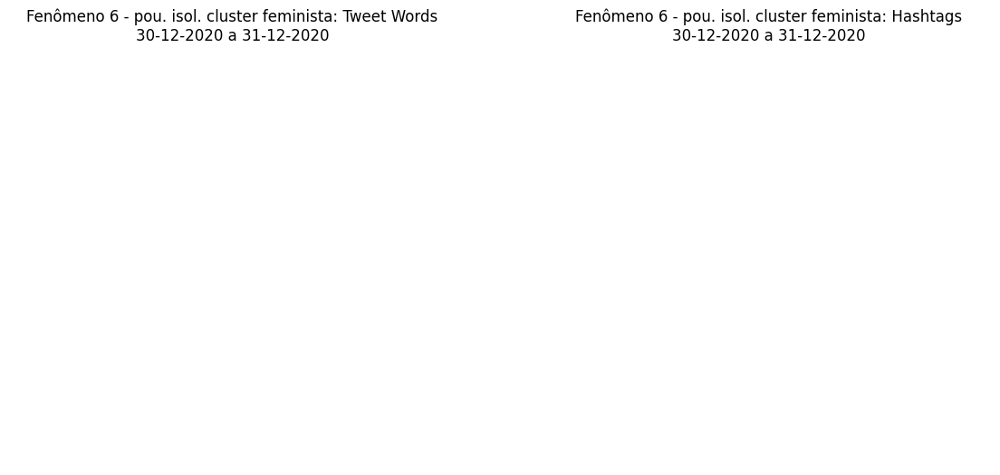

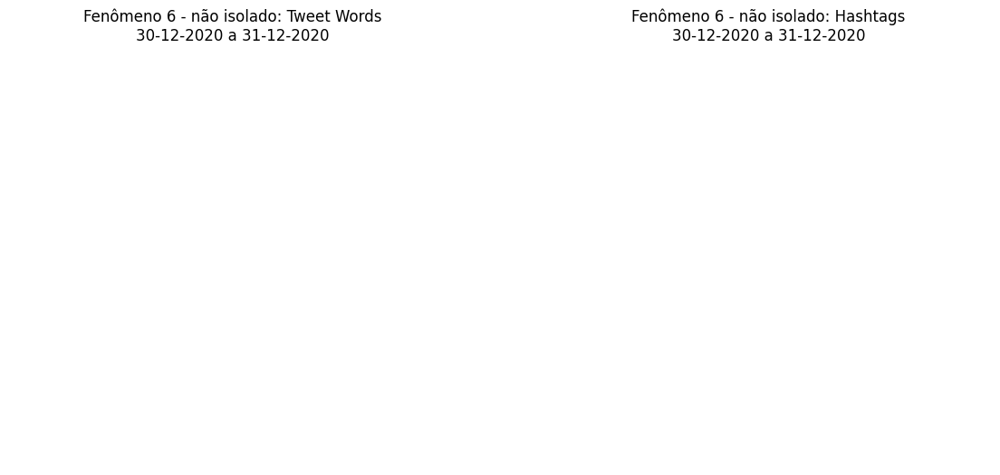

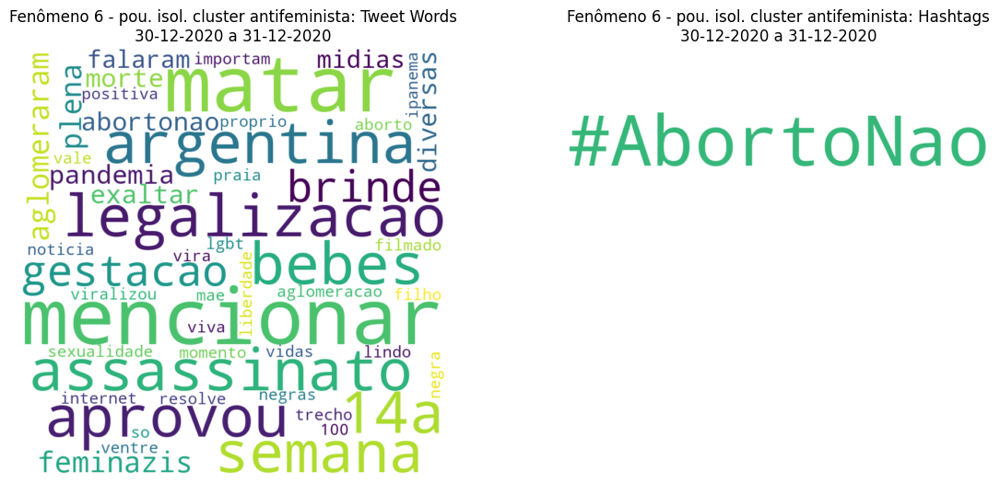

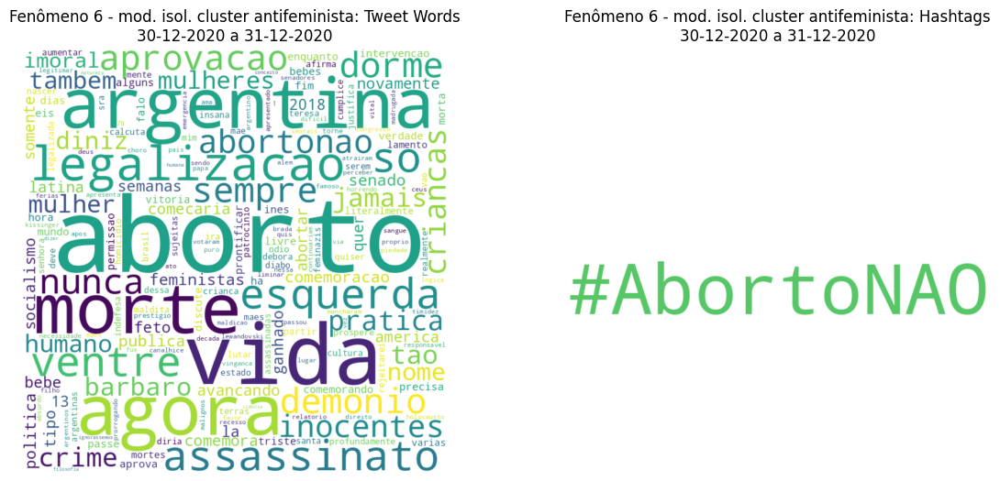

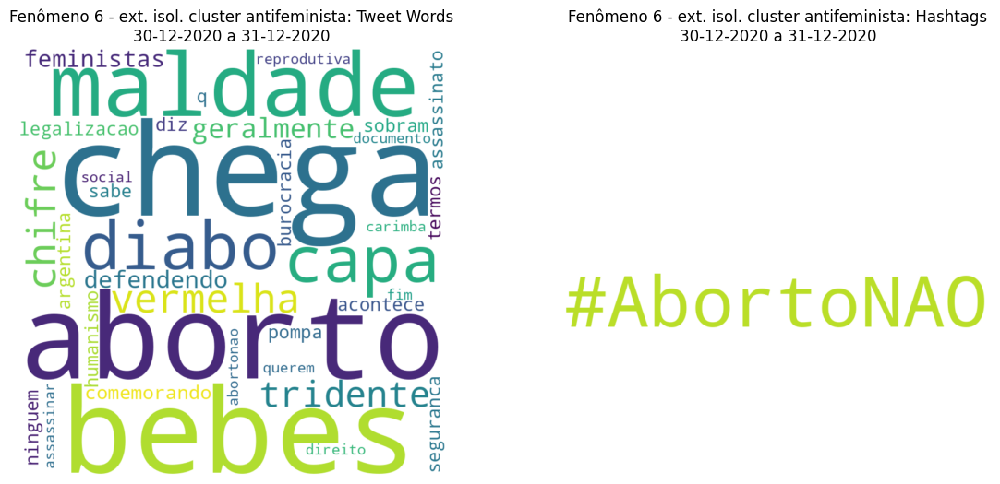

,tweet_text,user_ideology_classification
10844,"""Vidas negras importam"" até o momento em que a mãe negra resolve matar o próprio filho no ventre.\r\nAí vira ""aborto é lindo, viva a liberdade"" para matar.",antifeminista centro
10818,"Diversas mídias falaram sobre a aglomeração em Ipanema, que viralizou na Internet, mas sem mencionar que o trecho da praia filmado é 100% LGBT.\r\nSó vale mencionar a sexualidade quando a notícia é positiva?",antifeminista centro
10735,"A Argentina aprovou a legalização do assassinato de bebês até a 14a semana de gestação.\r\nDe brinde, as feminazis se aglomeraram em plena pandemia para exaltar a morte.\r\n#AbortoNao",antifeminista centro
10816,#AbortoNAO https://t.co/U6djcGsOWl,antifeminista extrema
10715,"RT @nikolas_dm: “O diabo não chega com capa vermelha, chifre e tridente, geralmente ele chega defendendo o aborto.”",antifeminista extrema
10794,"Sabe o que acontece na Argentina? Isso. Maldade com pompa de humanismo e burocracia. Ninguém diz o q é maldade, mas sobram termos como “segurança reprodutiva” e “direito social ao aborto”. No fim, querem assassinar bebês como se carimba um documento. https://t.co/fQaXWkOI9I",antifeminista extrema
10791,Feministas comemorando a legalização do assassinato de bebês. https://t.co/JHarfShDMA,antifeminista extrema
10826,"3. Ou seja, mesmo nesse cenário, tudo o que restaria aos defensores da legalização do aborto seria o argumento de que não é imoral decidir num jogo de cara-ou-coroa se devemos ou não matar um possível e provável ser humano, inocente e em uma situação de total vulnerabilidade.",antifeminista moderada
10824,"1. Não é difícil perceber que o aborto e sua legalização continuariam sendo imorais e malignos, mesmo se ignorássemos tudo o que a filosofia e a ciência têm a nos dizer sobre a natureza humana, sobre o conceito de vida e sobre o desenvolvimento humano, da concepção à morte.",antifeminista moderada
10823,"Seria a vez de Fux, no recesso, mas Lewandovski não quis férias e dá liminar prorrogando emergência - no lugar também do Congresso. E a timidez do Papa no aborto argentino. https://t.co/mwJAxAGdgW via @YouTube",antifeminista moderada


In [ ]:
from collections import Counter
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Função para filtrar tweets por data e encontrar as hashtags mais numerosas
def filtrar_tweets_por_data_e_hashtags(df, start_date, end_date, top_n=50):
    # Convertendo strings de data para objetos datetime.date
    start_date = pd.to_datetime(start_date).date()
    end_date = pd.to_datetime(end_date).date()
    
    # Filtrando os tweets por data
    df_filtered = df[
        (df['tweet_created_at'].dt.date >= start_date) &
        (df['tweet_created_at'].dt.date <= end_date) &
        (~df['user_ideology_classification'].isna())
    ]

    palavras_filtro = ['#BNCast2temp', '#AutonomiaEMemoria', '#aVozdeMinasnoSenado', '#Çocorro', '#DireitodeVotodaMulher', '#AutonomiaEMemória']
    filtro = df_filtered['tweet_hashtags'].apply(lambda x: not any(palavra in x for palavra in palavras_filtro))
    df_filtered = df_filtered[filtro]
        
    # Contando as hashtags mais frequentes
    hashtags_list = df_filtered['tweet_hashtags'].sum()  # Somando as listas de hashtags
    hashtags_counter = Counter(hashtags_list)
    
    # Selecionando as top N hashtags mais frequentes
    top_hashtags = [hashtag for hashtag, _ in hashtags_counter.most_common(top_n)]
    
    return df_filtered, top_hashtags

# Função para criar e exibir as nuvens de palavras por fenômeno e ideologia
def create_wordclouds_by_phenomenon_and_ideology(df, phenomenon_number, start_date, end_date):
    for ideology_key, ideology_name in rename_map.items():
        df_ideology = df[df['user_ideology_classification'] == ideology_key]
        
        # Contar as palavras em tweet_text_clean
        tweet_words = Counter()
        for words_list in df_ideology['tweet_text_clean'].dropna():
            words = words_list.split()  # Dividindo as palavras na string
            tweet_words.update(words)
        
        # Contar as hashtags mais usadas
        hashtags = Counter()
        for hashtags_list in df_ideology['tweet_hashtags'].dropna():
            hashtags.update(hashtags_list)  # Já é uma lista, então apenas atualizamos o Counter
        
        # Criar e exibir as nuvens de palavras
        create_wordclouds(tweet_words, hashtags, phenomenon_number, [start_date, end_date], ideology_name)

# Função para criar e exibir as nuvens de palavras
def create_wordclouds(tweet_words, hashtags, phenomenon_number, days, ideology):
    plt.figure(figsize=(14, 6))

    # Verificar se há palavras para gerar a nuvem de palavras
    if tweet_words:
        wordcloud_tweet_words = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(tweet_words)
        plt.subplot(1, 2, 1)
        plt.imshow(wordcloud_tweet_words, interpolation='bilinear')
        plt.title(f'Fenômeno {phenomenon_number} - {ideology}: Tweet Words\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
        plt.axis('off')
    else:
        plt.subplot(1, 2, 1)
        plt.title(f'Fenômeno {phenomenon_number} - {ideology}: Tweet Words\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
        plt.axis('off')

    # Verificar se há hashtags para gerar a nuvem de palavras
    if hashtags:
        wordcloud_hashtags = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(hashtags)
        plt.subplot(1, 2, 2)
        plt.imshow(wordcloud_hashtags, interpolation='bilinear')
        plt.title(f'Fenômeno {phenomenon_number} - {ideology}: Hashtags\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
        plt.axis('off')
    else:
        plt.subplot(1, 2, 2)
        plt.title(f'Fenômeno {phenomenon_number} - {ideology}: Hashtags\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
        plt.axis('off')
    
    plt.show()

# Definindo as datas dos fenômenos
fenomenos = [
    ('2020-10-07', '2020-10-07'),  # Fenômeno 0
    ('2020-10-17', '2020-10-17'),  # Fenômeno 1
    ('2020-10-21', '2020-10-21'),  # Fenômeno 2
    ('2020-11-03', '2020-11-05'),  # Fenômeno 3
    ('2020-11-11', '2020-11-14'),  # Fenômeno 4
    ('2020-12-30', '2020-12-31'),  # Fenômeno 5
]

# Analisando os fenômenos
for i, (data_inicio, data_fim) in enumerate(fenomenos):
    tweets_filtrados, top_hashtags = filtrar_tweets_por_data_e_hashtags(df_feminism, data_inicio, data_fim)
    
    print(f"\nFenômeno {i + 1} ({data_inicio} a {data_fim}):")
    print(f"Hashtags mais numerosas: {top_hashtags}")
    
    # Criar e exibir as nuvens de palavras por fenômeno e ideologia na ordem de rename_map
    create_wordclouds_by_phenomenon_and_ideology(tweets_filtrados, i + 1, pd.to_datetime(data_inicio).date(), pd.to_datetime(data_fim).date())

    display(tweets_filtrados[['tweet_text', 'user_ideology_classification']].sort_values('user_ideology_classification'))


In [ ]:
df_feminism['tweet_text'][3962]

'RT @oiIuiz: O Intercept noticiou que o caso terminou com uma “sentença inédita de estupro culposo”\r\n\r\nSó que o juiz não condenou o cara em es…'

**Resumo de cada fenômeno**

**Fenômeno 0**: eleições

**Fenômeno 1**: ação internacional das mulheres, lançamento de música de cantora gospel, eleições

**Fenômeno 2**: cuidados digitais

**Fenômeno 3**: "estupro culposo" e questão mari ferrer

**Fenômeno 4**: eleições

**Fenômeno 5**: descriminalização do aborto na Argentina


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Definindo as datas dos fenômenos
fenomenos = [
    # ('2020-10-07', '2020-10-07'),  # Fenômeno 0
    # ('2020-10-17', '2020-10-17'),  # Fenômeno 1
    # ('2020-10-21', '2020-10-21'),  # Fenômeno 2
    ('2020-11-03', '2020-11-05'),  # Fenômeno 3
    # ('2020-11-11', '2020-11-14'),  # Fenômeno 4
    ('2020-12-30', '2020-12-31'),  # Fenômeno 5
]

# Dicionário para renomear as faixas ideológicas
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Lista ordenada de faixas ideológicas
ordered_ideologies = list(rename_map.keys())

# Função para criar o gráfico único por fenômeno
def plot_tweet_counts_by_ideology(df, phenomenon_number, start_date, end_date):
    # Filtrando os tweets por data
    df_filtered = df[
        (df['tweet_created_at'].dt.date >= start_date) &
        (df['tweet_created_at'].dt.date <= end_date) &
        (~df['user_ideology_classification'].isna())
    ]

    # Contando os tweets por faixa de segmentação
    tweet_counts = df_filtered['user_ideology_classification'].value_counts().reindex(ordered_ideologies).fillna(0)
    
    # Renomeando as faixas ideológicas para exibição
    tweet_counts.index = tweet_counts.index.map(rename_map)

    # Criando o gráfico de barras com Plotly
    fig = go.Figure(data=[
        go.Bar(
            x=tweet_counts.index,
            y=tweet_counts.values,
            text=tweet_counts.values,
            textposition='auto',
            marker_color='darkblue'  # Tom de azul mais escuro
        )
    ])

    # Atualizando o layout do gráfico
    fig.update_layout(
        title_text=f'Contagem de Tweets por Faixa de Segmentação<br> {start_date} a {end_date}',
        xaxis_title='Faixa de Segmentação',
        yaxis_title='Quantidade de Tweets',
        template='plotly_white'
    )

    # Exibindo o gráfico
    fig.show()

# Gerando os gráficos para cada fenômeno
for i, (data_inicio, data_fim) in enumerate(fenomenos):
    plot_tweet_counts_by_ideology(df_feminism, i + 1, pd.to_datetime(data_inicio).date(), pd.to_datetime(data_fim).date())

In [ ]:
# from scipy.signal import find_peaks
# from collections import Counter
# from wordcloud import WordCloud
# import pandas as pd
# import matplotlib.pyplot as plt
# from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

# # Dicionário para renomear as faixas ideológicas
# rename_map = {
#     'feminista extrema': 'ext. isol. cluster feminista',
#     'feminista moderada': 'mod. isol. cluster feminista',
#     'feminista centro': 'pou. isol. cluster feminista',
#     'centro': 'não isolado',
#     'antifeminista centro': 'pou. isol. cluster antifeminista',
#     'antifeminista moderada': 'mod. isol. cluster antifeminista',
#     'antifeminista extrema': 'ext. isol. cluster antifeminista'
# }

# # Identificando picos no gráfico de proporção de tweets feministas
# peaks, _ = find_peaks(proportion_feminist_tweets_per_day, distance=5, height=0.15)

# # Obter as datas correspondentes aos picos
# days_above_threshold = proportion_feminist_tweets_per_day[proportion_feminist_tweets_per_day > 0.25]

# # Criando um DataFrame para facilitar o processamento
# df_above_threshold = days_above_threshold.reset_index()

# # Criando uma coluna para identificar grupos de dias consecutivos
# df_above_threshold['group'] = (df_above_threshold['tweet_created_at'].diff().dt.days > 1).cumsum()

# # Agrupando por esses grupos
# groups = df_above_threshold.groupby('group')['tweet_created_at'].apply(list)

# # Função para criar e exibir as nuvens de palavras
# def create_wordclouds(words, phenomenon_number, days, ideology):
#     if words:  # Se houver palavras e hashtags combinadas
#         plt.figure(figsize=(10, 8))
#         wordcloud = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(words)
#         plt.imshow(wordcloud, interpolation='bilinear')
#         plt.title(f'Fenômeno {phenomenon_number} - {ideology}\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
#         plt.axis('off')
#         plt.show()
#     else:  # Se não houver dados suficientes para gerar qualquer nuvem
#         print(f"Fenômeno {phenomenon_number} - {ideology}: Não há dados suficientes para gerar a nuvem de palavras ou hashtags.")

# # Realizando a análise para cada fenômeno
# for i, days in groups.items():
#     print(f"Analisando Fenômeno {i} de {days[0].strftime('%d-%m-%Y')} a {days[-1].strftime('%d-%m-%Y')}")

#     for ideology_key, ideology_name in rename_map.items():
#         # Filtrar os tweets desses dias e dessa ideologia
#         df_group = df_feminism[
#             (df_feminism['tweet_created_at'].dt.date.isin(pd.to_datetime(days).date)) &
#             (df_feminism['user_ideology_classification'] == ideology_key)
#         ]
        
#         # Contar as palavras e hashtags, excluindo stop words
#         words = Counter()
#         for tweet in df_group['tweet_text_clean'].dropna():
#             for word in tweet.split():
#                 if word.lower() not in ENGLISH_STOP_WORDS:
#                     words[word.lower()] += 1
        
#         # Adicionar as hashtags ao contador de palavras
#         for hashtags_list in df_group['tweet_hashtags'].dropna():
#             for hashtag in hashtags_list:
#                 words[hashtag] += 1
        
#         # Criar e exibir as word clouds para o fenômeno atual
#         create_wordclouds(words, i, days, ideology_name)
